# machinehack-ml-merchandise-popularity-prediction


We need to predict the popularity from all the other data from dataset like Store_Ratio, Basket Ratio, Store Score. 

Big Brands spend a significant amount on popularizing a product.  Nevertheless, their efforts go in vain while establishing the merchandise in the hyperlocal market. Based on different geographical conditions same attributes can communicate a piece of much different information about the customer. Hence, insights this is a must for any brand owner.



# ABOUT DATASET

Train.csv - 18208 x 12  (Includes popularity Column as Target variable)

Test.csv - 12140 x 11 

# COLUMNS IN THE DATASET

storeratio

 basketratio

category1

 storescore

category2

 storepresence

score1 

score2

score3 

score4

time

popularity (Target Column)

# Importing required libraries

In [ ]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

# Importing the dataset

In [ ]:
# Load the dataset using pandas
test_da = pd.read_csv('/content/Test (2).csv')
train_da = pd.read_csv('/content/Train1.csv')

In [ ]:
# Make a copy of the dataset 
test_dataset = test_da.copy()
train_dataset = train_da.copy()

# Identifying the number of features or columns

In [ ]:
# Check the shape of train dataset
train_dataset.shape

(18208, 12)

In [ ]:
# Check the shape of test dataset
test_dataset.shape

(12140, 11)

# Know all the names of the columns

In [ ]:
# Check the columns in the train dataset
train_dataset.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time', 'popularity'],
      dtype='object')

# Knows more about the data in the columns like data type it contains and total samples of each

In [ ]:
# Check which columns are having categorical, numerical or boolean values of train dataset
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18208 entries, 0 to 18207
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Store_Ratio     18208 non-null  float64
 1   Basket_Ratio    18208 non-null  float64
 2   Category_1      18208 non-null  int64  
 3   Store_Score     18208 non-null  float64
 4   Category_2      18208 non-null  int64  
 5   Store_Presence  18208 non-null  float64
 6   Score_1         18208 non-null  float64
 7   Score_2         18208 non-null  float64
 8   Score_3         18208 non-null  float64
 9   Score_4         18208 non-null  float64
 10  time            18208 non-null  int64  
 11  popularity      18208 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


After checking the Dtypes of all the columns

object - String values

float64 - Numerical values

Observation: There are no String values so there are no categorical data

In [ ]:
# Check which columns are having categorical, numerical or boolean values of test dataset

test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12140 entries, 0 to 12139
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Store_Ratio     12140 non-null  float64
 1   Basket_Ratio    12140 non-null  float64
 2   Category_1      12140 non-null  int64  
 3   Store_Score     12140 non-null  float64
 4   Category_2      12140 non-null  int64  
 5   Store_Presence  12140 non-null  float64
 6   Score_1         12140 non-null  float64
 7   Score_2         12140 non-null  float64
 8   Score_3         12140 non-null  float64
 9   Score_4         12140 non-null  float64
 10  time            12140 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.0 MB


After checking the Dtypes of all the columns

object - String values

float64 - Numerical values

Observation: There are no String values so there are no categorical data

# Know more mathematical relations of the dataset like count, min, max values, standarad deviation values, mean and different percentile values

In [ ]:
# For more information on the train dataset like the total count in all the columns
# min, max values and more information of the respective columns  
train_dataset.describe()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time,popularity
count,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,18208.000000,1.820800e+04,18208.000000
mean,0.544283,0.483585,5.155536,-12.198086,0.648506,0.477702,0.322109,0.164888,0.421440,115.305776,2.180101e+05,3.850231
std,0.202709,0.302010,3.535068,8.370566,0.477450,0.380634,0.413493,0.136531,0.271922,31.478303,9.648289e+04,0.544226
min,0.000000,0.000216,0.000000,-47.576000,0.000000,0.000000,0.000000,0.011900,0.000000,0.000000,3.184400e+04,0.000000
25%,0.411000,0.200000,2.000000,-16.496250,0.000000,0.086175,0.000001,0.095300,0.184750,90.974250,1.696202e+05,4.000000
50%,0.573000,0.517000,5.000000,-9.166500,1.000000,0.430000,0.002245,0.112000,0.393000,114.022500,2.046460e+05,4.000000
75%,0.699000,0.742000,8.000000,-5.943750,1.000000,0.895000,0.859000,0.176000,0.640000,134.997000,2.471562e+05,4.000000
max,0.998000,1.000000,11.000000,-0.079000,1.000000,0.996000,1.000000,0.991000,0.999000,219.701000,3.908467e+06,5.000000


In [ ]:
# For more information on the train dataset like the total count in all the columns
# min, max values and more information of the respective columns  
test_dataset.describe()

,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time
count,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,12140.000000,1.214000e+04
mean,0.543776,0.488879,5.121417,-12.062847,0.642916,0.474675,0.321641,0.165942,0.420485,115.748041,2.154031e+05
std,0.200109,0.301217,3.528765,8.300385,0.479160,0.377582,0.414438,0.139109,0.270508,31.519999,8.231108e+04
min,0.000000,0.000000,0.000000,-46.847000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.406700e+04
25%,0.414750,0.213000,2.000000,-16.066000,0.000000,0.087775,0.000001,0.095900,0.190000,90.908750,1.700000e+05
50%,0.570000,0.521000,5.000000,-9.046500,1.000000,0.430500,0.002050,0.112000,0.392000,114.618500,2.043415e+05
75%,0.696000,0.745000,8.000000,-5.891750,1.000000,0.882000,0.861000,0.173250,0.633000,135.829250,2.445222e+05
max,0.978000,1.000000,11.000000,0.662000,1.000000,0.996000,1.000000,0.994000,1.000000,219.701000,1.782178e+06


# Get the total number of samples in the dataset using the len() function

In [ ]:
# check the lenght of test and train dataset
print('train data length:',len(train_dataset))
print('test data length:',len(test_dataset))

train data length: 18208
test data length: 12140


# Counting the total number of missing value

In [ ]:
# Check for missing values in all the columnns of the train dataset
train_dataset.isnull().sum()

Store_Ratio       0
Basket_Ratio      0
Category_1        0
Store_Score       0
Category_2        0
Store_Presence    0
Score_1           0
Score_2           0
Score_3           0
Score_4           0
time              0
popularity        0
dtype: int64

There is no missing values in this dataset

In [ ]:
# Check for missing values in all the columnns of the test dataset
test_dataset.isnull().sum()

Store_Ratio       0
Basket_Ratio      0
Category_1        0
Store_Score       0
Category_2        0
Store_Presence    0
Score_1           0
Score_2           0
Score_3           0
Score_4           0
time              0
dtype: int64

There is no missing values in this dataset

#Get unique values

In [ ]:
# get unique values in train dataset
for x in train_dataset.columns:
  print(x,':', len(train_dataset[x].unique()))


Store_Ratio : 1053
Basket_Ratio : 1993
Category_1 : 12
Store_Score : 10758
Category_2 : 2
Store_Presence : 2832
Score_1 : 3668
Score_2 : 1385
Score_3 : 1591
Score_4 : 12943
time : 12755
popularity : 5


In [ ]:
# get unique values in test dataset
for x in test_dataset.columns:
  print(x,':', len(test_dataset[x].unique()))

Store_Ratio : 1010
Basket_Ratio : 1811
Category_1 : 12
Store_Score : 8300
Category_2 : 2
Store_Presence : 2507
Score_1 : 3064
Score_2 : 1275
Score_3 : 1491
Score_4 : 9463
time : 9301


# EDA

# CORRELATION MATRIX

Why ?

A correlation matrix is a table showing correlation coefficients between variables

There are three broad reasons for computing a correlation matrix:

1. To summarize a large amount of data where the goal is to see patterns. In our example above, the observable pattern is that all the variables highly correlate with each other.
2. To input into other analyses. For example, people commonly use correlation matrixes as inputs for exploratory factor analysis, confirmatory factor analysis, structural equation models, and linear regression when excluding missing values pairwise.
3. As a diagnostic when checking other analyses. For example, with linear regression, a high amount of correlations suggests that the linear regression estimates will be unreliable

In [ ]:
#correlation 
#perfom correlation matrix Using pandas

corr = train_dataset.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  """


,Store_Ratio,Basket_Ratio,Category_1,Store_Score,Category_2,Store_Presence,Score_1,Score_2,Score_3,Score_4,time,popularity
Store_Ratio,1.00,0.47,0.04,0.60,-0.10,-0.47,-0.45,-0.04,0.62,0.12,-0.06,0.23
Basket_Ratio,0.47,1.00,0.05,0.83,-0.11,-0.82,-0.61,0.28,0.53,0.25,0.10,0.20
Category_1,0.04,0.05,1.00,0.04,-0.14,-0.05,-0.03,0.02,0.04,0.00,-0.01,0.00
Store_Score,0.60,0.83,0.04,1.00,-0.09,-0.72,-0.73,0.15,0.52,0.26,0.08,0.20
Category_2,-0.10,-0.11,-0.14,-0.09,1.00,0.10,0.02,-0.04,-0.04,-0.05,-0.01,-0.03
Store_Presence,-0.47,-0.82,-0.05,-0.72,0.10,1.00,0.57,-0.19,-0.43,-0.22,-0.07,-0.20
Score_1,-0.45,-0.61,-0.03,-0.73,0.02,0.57,1.00,-0.10,-0.47,-0.20,-0.11,-0.16
Score_2,-0.04,0.28,0.02,0.15,-0.04,-0.19,-0.10,1.00,0.03,0.02,-0.00,0.00
Score_3,0.62,0.53,0.04,0.52,-0.04,-0.43,-0.47,0.03,1.00,0.18,0.01,0.18
Score_4,0.12,0.25,0.00,0.26,-0.05,-0.22,-0.20,0.02,0.18,1.00,0.03,0.04


** Observations from above correlation matrix**

1. store ratio is strongly correlated with basket ratio , store score, score3 ,store presence score1 , score3
2. basket ratio is correlated to store score, store presence, score1 score3.
3. category1 is correlated with category2
4. score presence is correlated with score1, score2, score3, popularity
5. score1 is correlated with score3 , score4, time, popularity


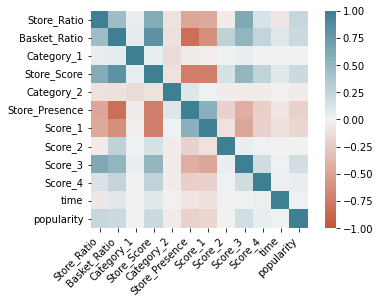

In [ ]:
#perfom correlation matrix Using seaborn
ax = sns.heatmap(
    corr,
    vmin = -1, vmax=1, center=0,
    cmap=sns.diverging_palette(20,220, n=200),
    square=True
    )
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right'
);


# SCATTER PLOT
1. A scatter plot is a type of plot using Cartesian coordinates to display values for typically two variables for a set of data.

2. The data are displayed as a collection of points, each having the value of one variable determining the position on the horizontal axis and the value of the other variable determining the position on the vertical axis.

3. Scatter plot's are used to observe and show relationships between two numeric variables.

In [ ]:
var_list = ['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time', 'popularity']

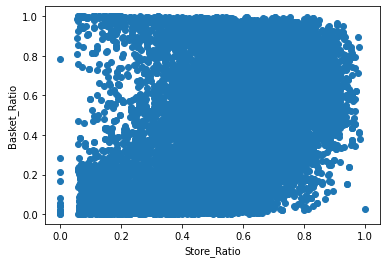

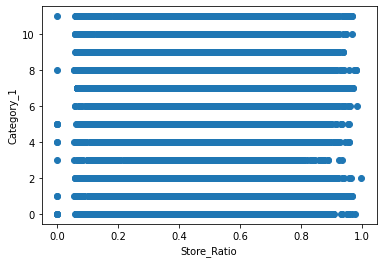

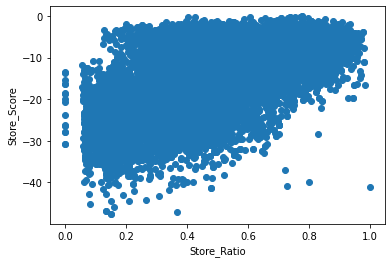

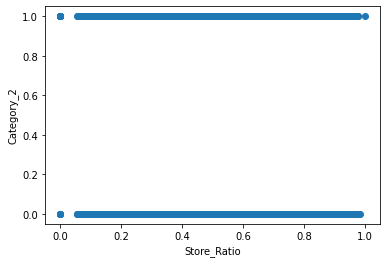

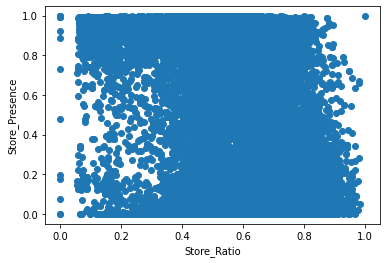

...

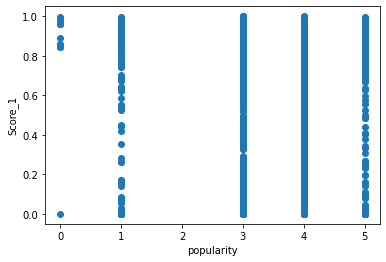

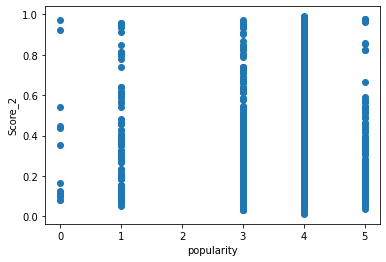

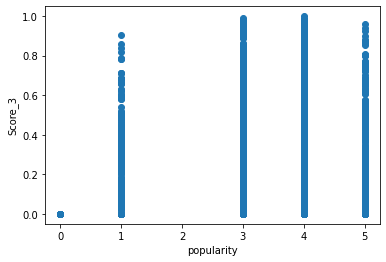

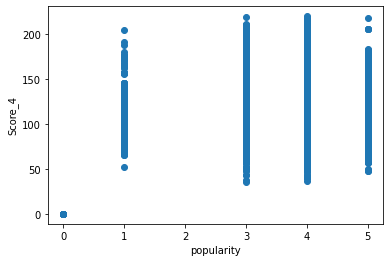

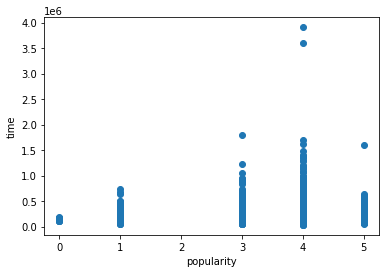

In [ ]:
# perform scatterplot 
# Make a list of all the columns of train dataset

def plot_scatter(x,y):
  plt.figure()
  plt.xlabel(x)
  plt.ylabel(y)
  plt.scatter(train_dataset[x],train_dataset[y])
  plt.show()


# Loop through numerical data list and use function to scatter plot between two columns
for i in var_list:
  for j in var_list:
    if i != j:
      plot_scatter(i,j)

** Observations from above scatter plot **

1. As value of store presence increases value of basket ratio decreases.
2. As value of store scrore increases value of basket ratio increases.
3. Increase in value of store ratio results in the increase of basket ratio's value

# HISTOGRAM
1. A histogram is an approximate representation of the distribution of numerical data.

2. To construct a histogram, the first step is to "bin" (or "bucket") the range of values—that is, divide the entire range of values into a series of intervals—and then count how many values fall into each interval.

3. The words used to describe the patterns in a histogram are: "symmetric", "skewed left" or "right", "unimodal", "bimodal" or "multimodal".

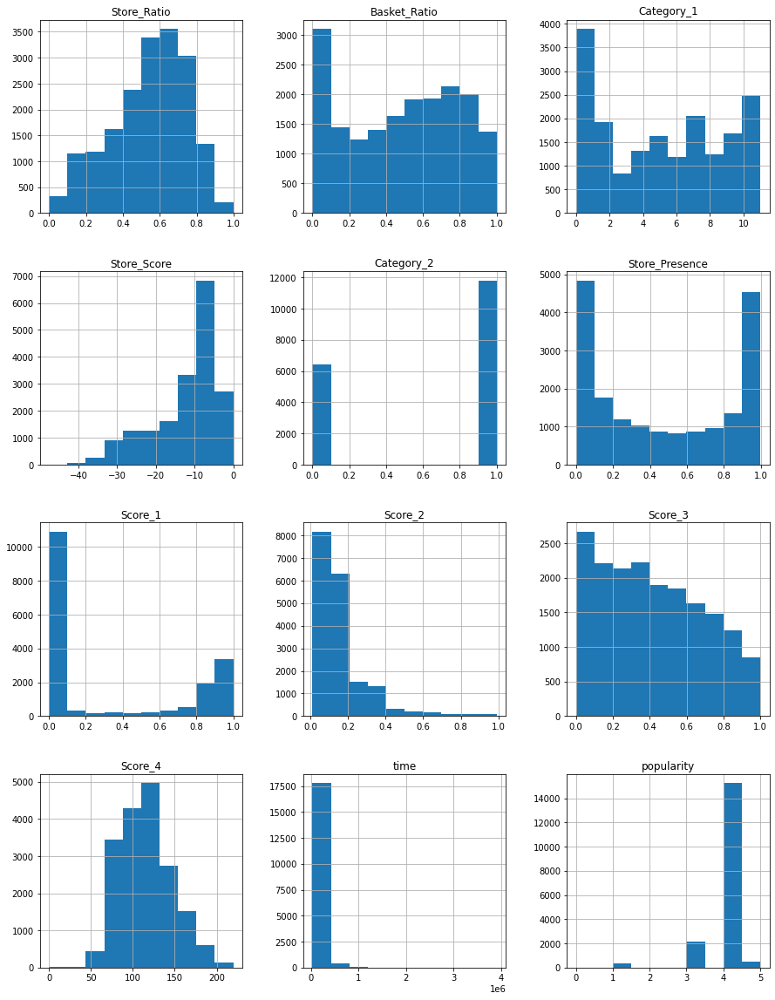

In [ ]:
# perform histogram using pandas for all columns of train dataset

train_dataset.hist(figsize = (15,20))
plt.show()

**observation from above histogram**
1. The data distribution of store presence is bimodal
2. Score_2, score 1, score3 and time data distribution is skewed left.
3. Store score and popularity data distribution is skewed right.
4. distribution of basket ratio, carwgort 1  is multimodal.
5. distribution of store eatio is bimodal and skewed



# VIF - Variance inflation factor

1. The variance inflation factor (VIF) quantifies the extent of correlation between one predictor and the other predictors in a model.
2. It is used for diagnosing collinearity/multicollinearity.
3. Higher values signify that it is difficult to impossible to assess accurately the contribution of predictors to a model.

In [ ]:
#import statsmodel.api
from statsmodels.stats.outliers_influence import variance_inflation_factor

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# creating a dataframe of just numerical values
train_for_vif  = train_dataset.drop(['popularity'],axis=1)

# target values
target = train_dataset['popularity']

# numerical values column names
names = ['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time']

#print names
print(names)

['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score', 'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3', 'Score_4', 'time']


In [ ]:
# Calculating VIF for each feature.

import numpy as np
import pandas as pd
import statsmodels.api as sm




names = list(train_dataset[names]) # Name for all the attributes

df1 = pd.DataFrame(train_for_vif, columns=names) # Make the pandas dataframe for Data analysis
df1.head() # See first 5 samples from the dataframe

for index in range(0, len(names)):
            y = df1.loc[:, df1.columns == names[index]]
            x = df1.loc[:, df1.columns != names[index]]
            model = sm.OLS(y, x)                       #Fit ordinary least squares method
            results = model.fit()
            rsq = results.rsquared
            vif = round(1 / (1 - rsq), 2)
            print("R Square value of {} column is {} keeping all other columns as independent features".format(
              names[index], (round(rsq, 2))
                    )
            )
            print("Variance Inflation Factor of {} column is {} n".format(names[index], vif))
  

R Square value of Store_Ratio column is 0.91 keeping all other columns as independent features
Variance Inflation Factor of Store_Ratio column is 11.74 n
R Square value of Basket_Ratio column is 0.92 keeping all other columns as independent features
Variance Inflation Factor of Basket_Ratio column is 12.13 n
R Square value of Category_1 column is 0.68 keeping all other columns as independent features
Variance Inflation Factor of Category_1 column is 3.11 n
R Square value of Store_Score column is 0.9 keeping all other columns as independent features
Variance Inflation Factor of Store_Score column is 9.87 n
R Square value of Category_2 column is 0.65 keeping all other columns as independent features
Variance Inflation Factor of Category_2 column is 2.83 n
R Square value of Store_Presence column is 0.85 keeping all other columns as independent features
Variance Inflation Factor of Store_Presence column is 6.69 n
R Square value of Score_1 column is 0.72 keeping all other columns as indepen

Observations:

there is colinearity/multicolinearity between variables as the VIF value is almost upto 2.5

Store_Ratio, Basket_Ratio, Category_1, Store_Score, Category_2, Store_Presence, Score_1, Score_2, Score_3, Score_4, time they all have colinearity with all the variables.

# BOX PLOT

A boxplot is a standardized way of displaying the dataset based on a five-number summary:

    1. Minimum (Q0 or 0th percentile): the lowest data point excluding any outliers.

    2. Maximum (Q4 or 100th percentile): the largest data point excluding any outliers.

    3. Median (Q2 or 50th percentile): the middle value of the dataset.

    4. First quartile (Q1 or 25th percentile): also known as the lower quartile qn(0.25), is the median of the lower half of the dataset.

    5. Third quartile (Q3 or 75th percentile): also known as the upper quartile qn(0.75), is the median of the upper half of the dataset

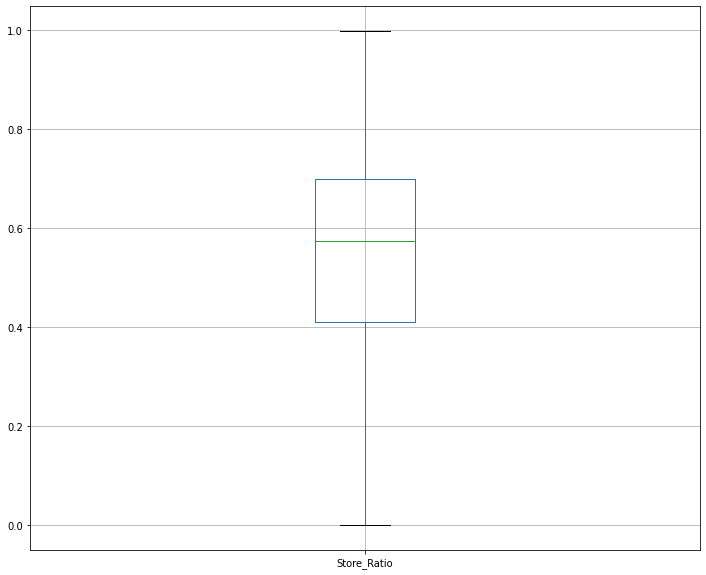

In [ ]:
# Perform a box plot on Store_Ratio 
train_dataset.boxplot(column = 'Store_Ratio',figsize=(12,10))

from above box plot graph:

Store ratio

1. 25% of  store ratio have value between range 0 to 0.4.

2. 25% of store ratio have value between range 0.4 to 0.6.
3. 25% of store ratio have value between range 0.6 to 0.7.
4. 25% of store ratio have value between range 0.7 to 1.

The mean store ratio is around 6.

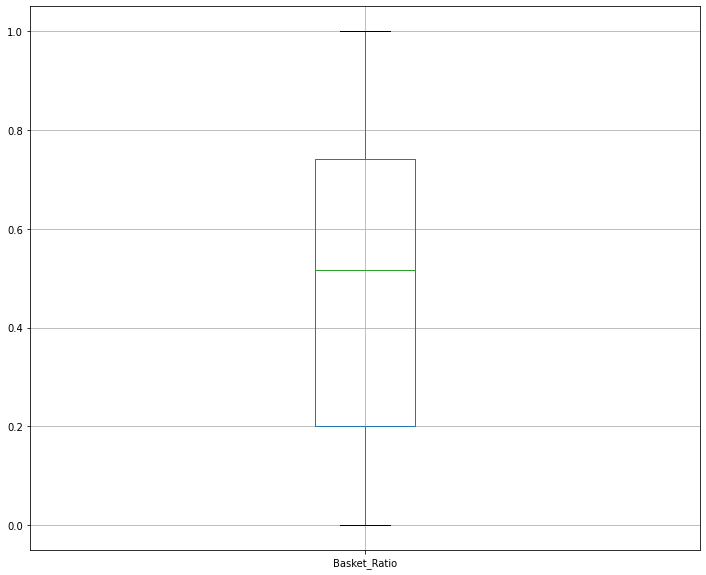

In [ ]:

# Perform a box plot on Basket_Ratio 
train_dataset.boxplot(column = 'Basket_Ratio',figsize=(12,10))

from above box plot graph:

basket ratio

1. 25% of  basket ratio have value between range 0 to 0.2.
2. 25% of basket ratio have value between range 0.4 to 0.52
3. 25% of basket ratio have value between range 0.52 to 0.78.
4. 25% of basket ratio have value between range 0.78 to 1.

The mean basket ratio is around 0.52

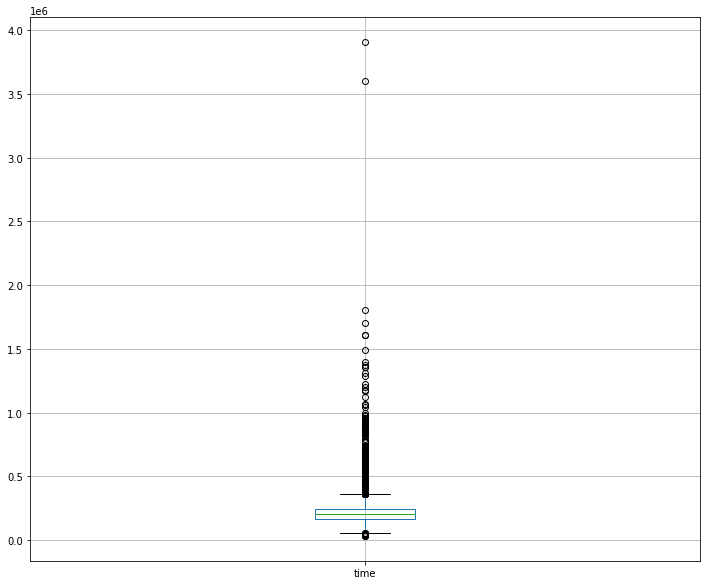

In [ ]:
# Perform a box plot on time
train_dataset.boxplot(column = 'time',figsize=(12,10))


from above box plot graph:

time

1. 25% of  time have value between range 0 to 0.2.

2. 25% of time have value between range 0.2 to 0.25
3. 25% of time have value between range 0.25 to 0.3.
4. 25% of time have value between range 0.3 to 0.4

The mean time is around 0.25

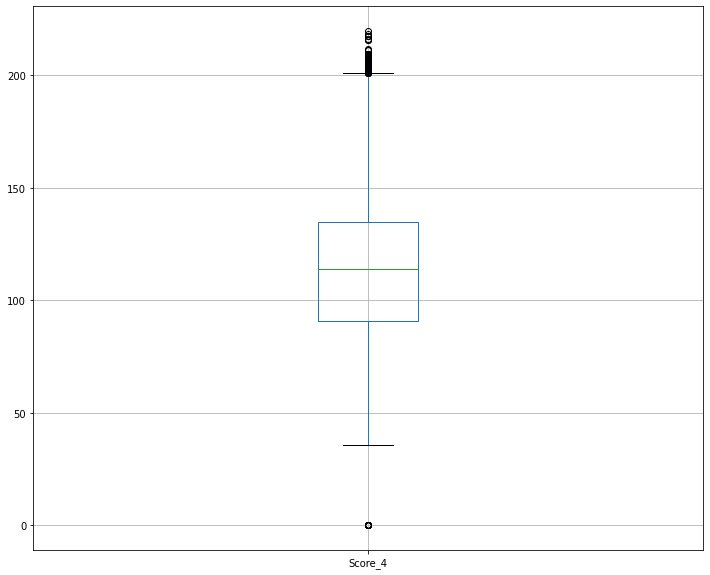

In [ ]:
# Perform a box plot on Score_4 
train_dataset.boxplot(column = 'Score_4',figsize=(12,10))


from above box plot graph:

score 4

1. 25% of  score 4 have value between range 40 to 90.

2. 25% of score 4 have value between range 90 to 125
3. 25% of score 4 have value between range 125 to 140.
4. 25% of score 4 have value between range 140 to 200.

The mean score 4 is around 125

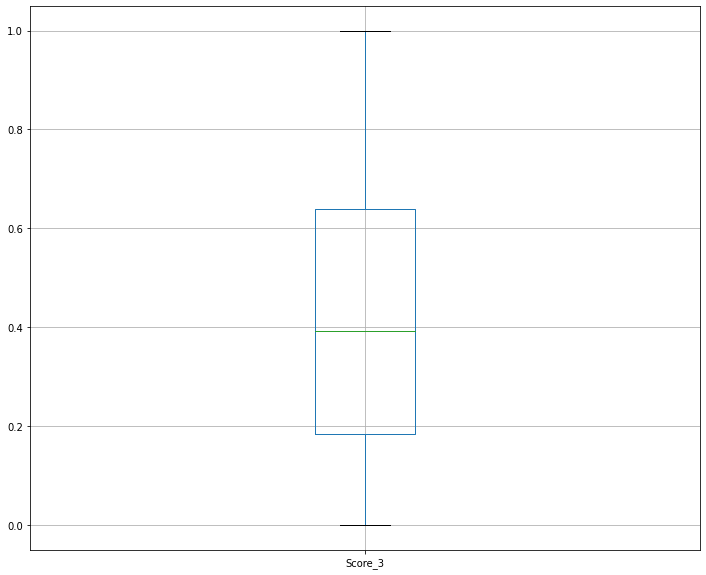

In [ ]:
# Perform a box plot on Score_3 

train_dataset.boxplot(column = 'Score_3',figsize=(12,10))

from above box plot graph:

score3

1. 25% of  score3 have value between range 0 to 0.2.

2. 25% of score3 have value between range 0.2 to 0.4
3. 25% of score3 have value between range 0.4 to 0.62.
4. 25% of score3 have value between range 0.62 to 1.

The mean score3 is around 0.4

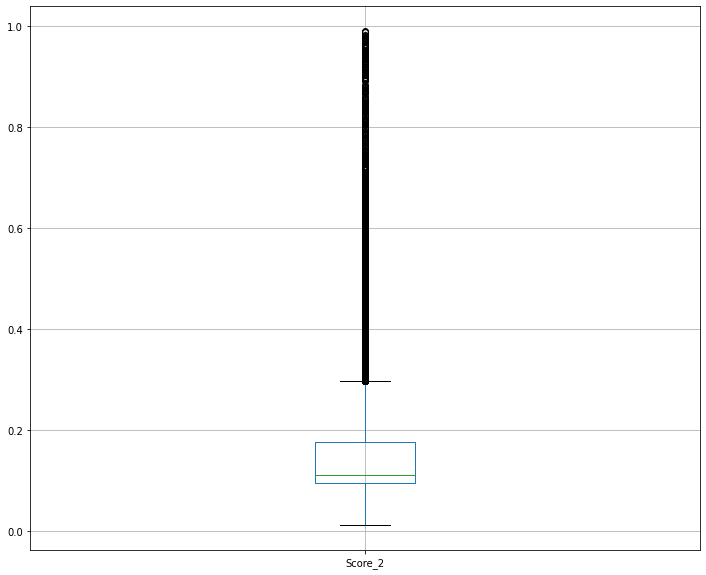

In [ ]:
# Perform a box plot on Score_2 
train_dataset.boxplot(column = 'Score_2',figsize=(12,10))


from above box plot graph:

score2

1. 25% of  score2 have value between range 0 to 0.1.

2. 25% of score2 have value between range 0.1 to 0.12
3. 25% of score2 have value between range 0.12 to 0.18.
4. 25% of score2 have value between range 0.18 to 1.

The mean score2 is around 0.12

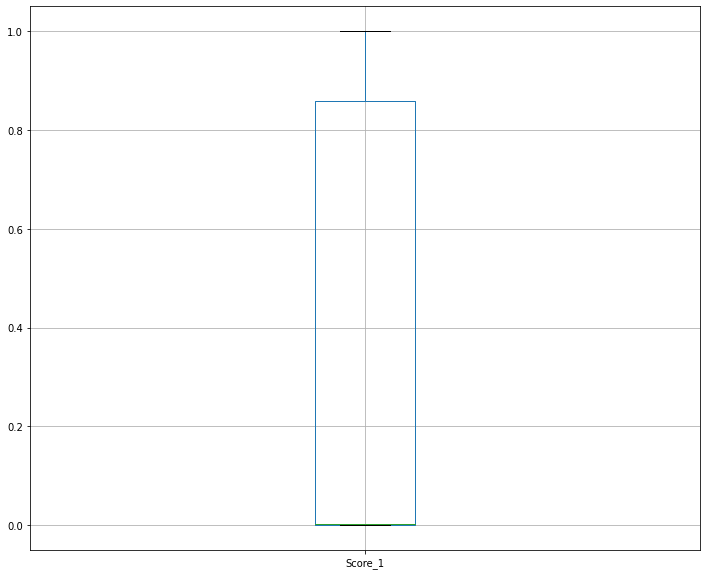

In [ ]:
# Perform a box plot on Score_1 
train_dataset.boxplot(column = 'Score_1',figsize=(12,10))


from above box plot graph:

score1

1. 25% of  score1 have value between range 0 to 0.0.

2. 25% of score1 have value between range 0.0 to 0.0
3. 25% of score1 have value between range 0.0 to 0.9
4. 25% of score1 have value between range 0.9 to 1.

The mean score1 is around 0.0

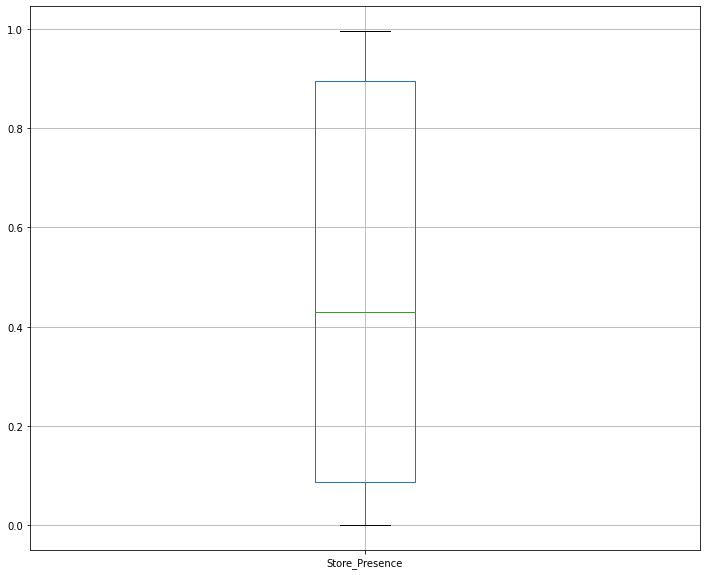

In [ ]:
# Perform a box plot on Store_Presence 
train_dataset.boxplot(column = 'Store_Presence',figsize=(12,10))


from above box plot graph:

store presence

1. 25% of  store presence have value between range 0 to 0.35.

2. 25% of store presence have value between range 0.35 to 0.42
3. 25% of store presence have value between range 0.42 to 0.95.
4. 25% of store presence have value between range 0.95 to 1.

The mean store presence is around 0.42

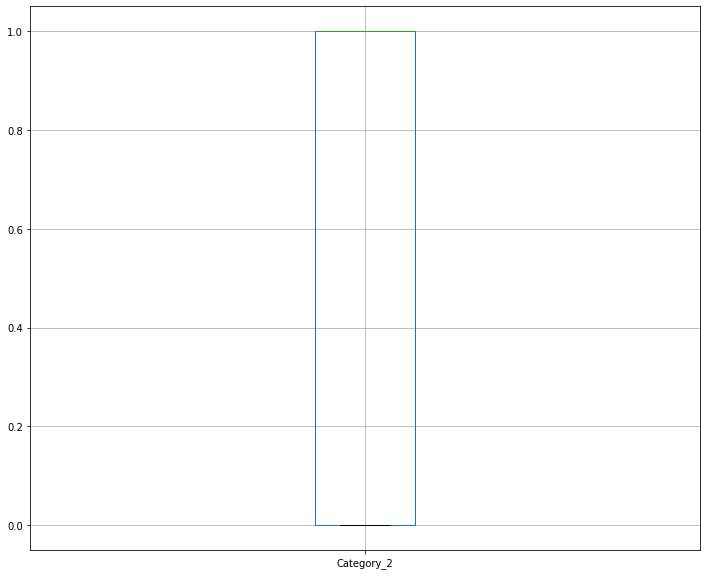

In [ ]:
# Perform a box plot on Category_2
train_dataset.boxplot(column = 'Category_2',figsize=(12,10))


from above box plot graph:

category 2

1. 25% of  category2 have value between range 0 to 0.0.

2. 25% of category2 have value between range 0.0 to 0.1
3. 25% of category2 have value between range 0.1 to 0.1
4. 25% of category2 have value between range 0.1 to 1.

The mean category2 is around 0.1

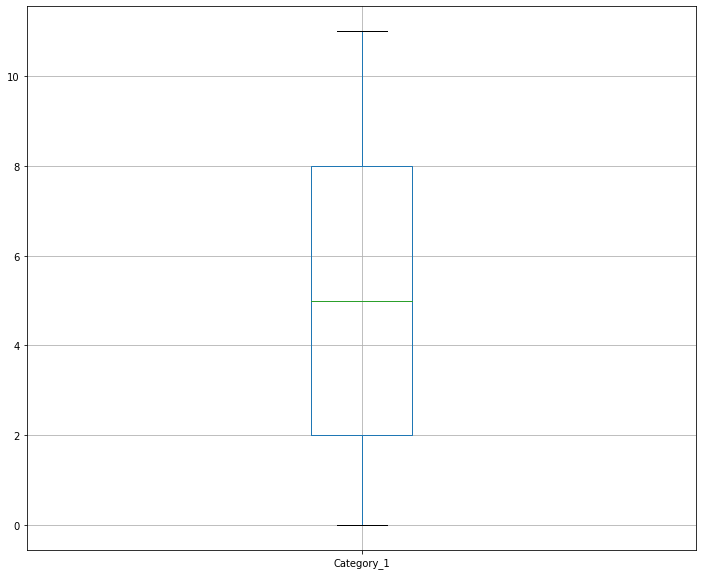

In [ ]:

# Perform a box plot on Category_1 
train_dataset.boxplot(column = 'Category_1',figsize=(12,10))

from above box plot graph:

category1

1. 25% of  category1 have value between range 0 to 0.2.

2. 25% of category1 have value between range 0.2 to 0.5
3. 25% of category1 have value between range 0.5 to 0.8.
4. 25% of category1 have value between range 0.8 to 1.

The mean category1 is around 0.5

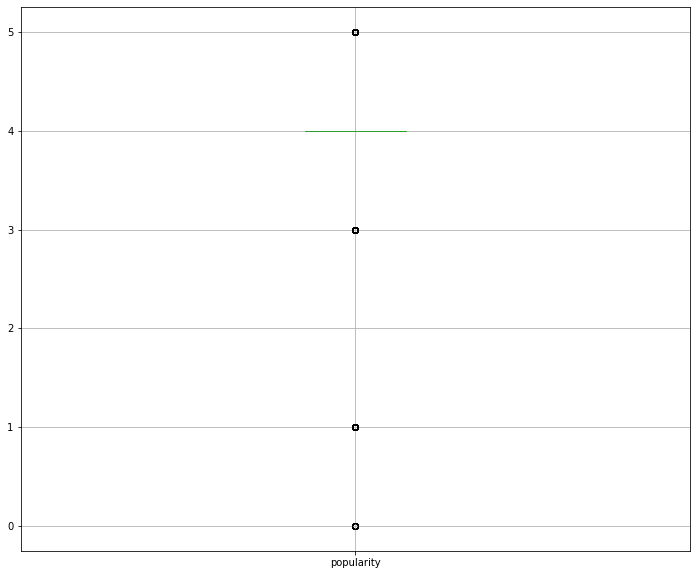

In [ ]:
# Perform a box plot on popularity

train_dataset.boxplot(column = 'popularity',figsize=(12,10))

#COUNT PLOT
1. A countplot is kind of like a histogram or a bar graph for some categorical area.

2. It simply shows the number of occurrences of an item based on a certain type of category.


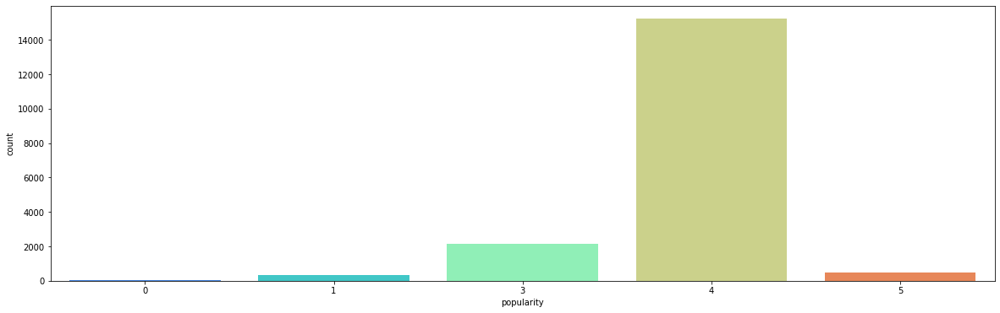

In [ ]:
# Perform the countplot on the popularity
plt.figure(figsize=(20,6))
sns.countplot(x= 'popularity', data =train_dataset, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed right

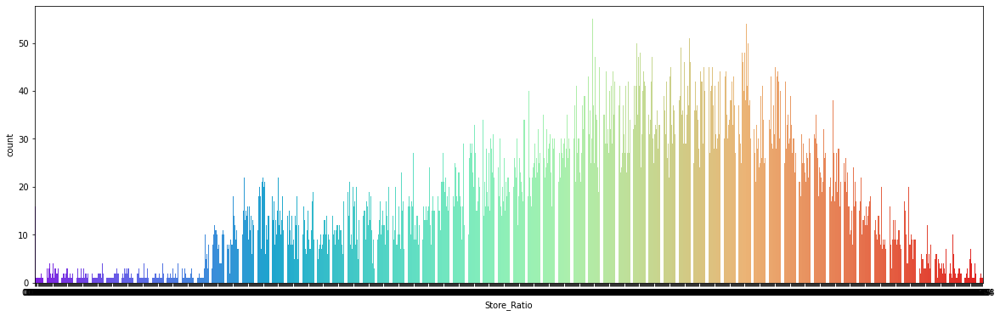

In [ ]:
# Perform the countplot on the Store Ratio
plt.figure(figsize=(20,6))
sns.countplot(x= 'Store_Ratio', data =train_dataset, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed right.

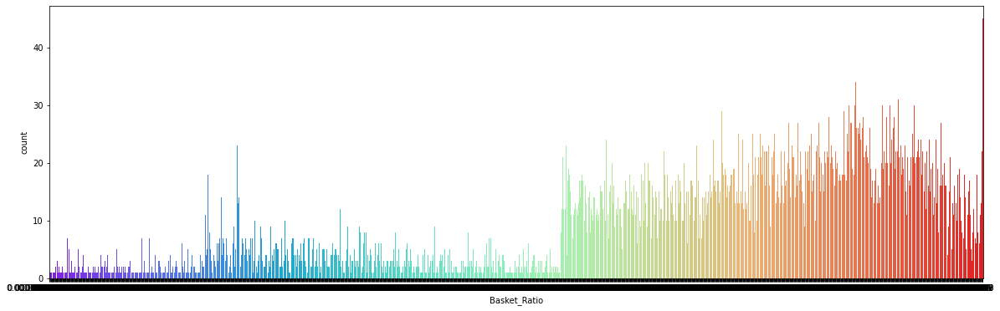

In [ ]:
# Perform the countplot on the Basket ratio
plt.figure(figsize=(20,6))
sns.countplot(x= 'Basket_Ratio', data =train_dataset, palette='rainbow')

From above count plot

distribution of values over complete dataset are skewed right

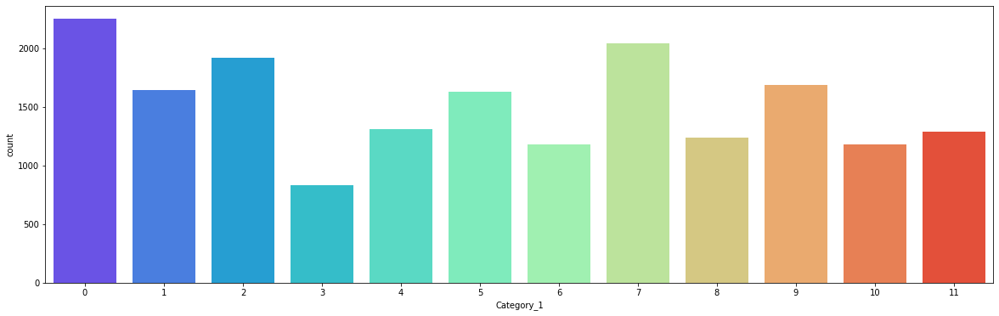

In [ ]:
# Perform the countplot on the category 1
plt.figure(figsize=(20,6))
sns.countplot(x= 'Category_1', data =train_dataset, palette='rainbow')

distribution of values over complete dataset is multimodal

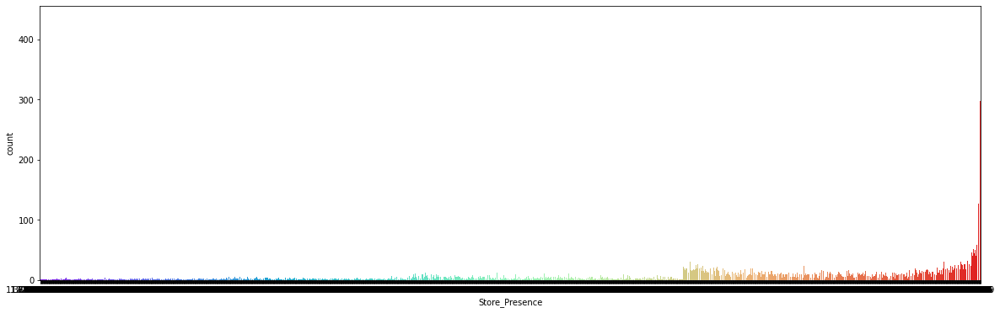

In [ ]:
# Perform the countplot on the store presence
plt.figure(figsize=(20,6))
sns.countplot(x= 'Store_Presence', data =train_dataset, palette='rainbow')

distribution of values over complete dataset is skewed to right

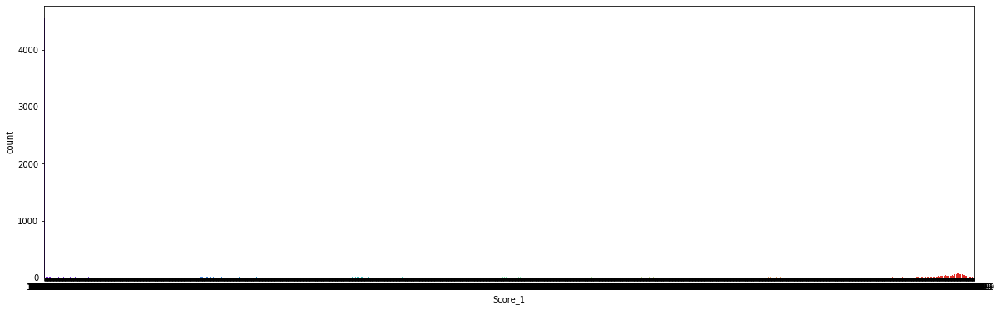

In [ ]:
# Perform the countplot on the score 1
plt.figure(figsize=(20,6))
sns.countplot(x= 'Score_1', data =train_dataset, palette='rainbow')

All the values are round zero very few are above zero

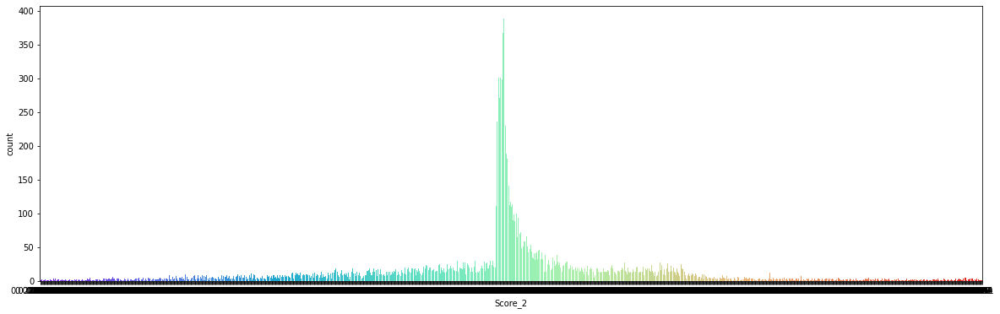

In [ ]:
# Perform the countplot on the Score 2
plt.figure(figsize=(20,6))
sns.countplot(x= 'Score_2', data =train_dataset, palette='rainbow')

distribution of values over complete dataset is unimodal.

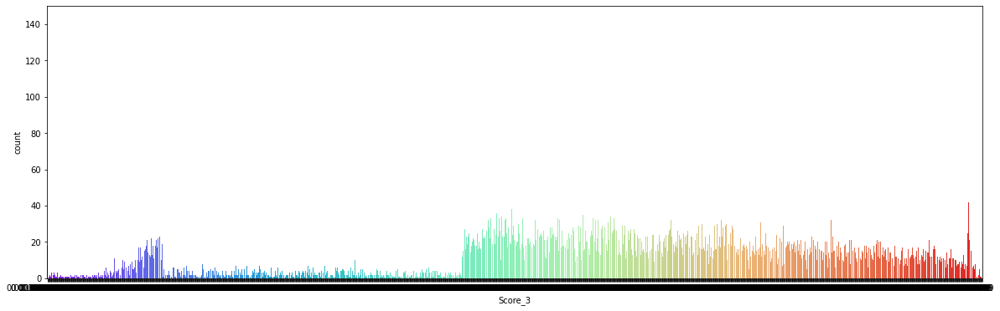

In [ ]:
# Perform the countplot on the Score 3
plt.figure(figsize=(20,6))
sns.countplot(x= 'Score_3', data =train_dataset, palette='rainbow')

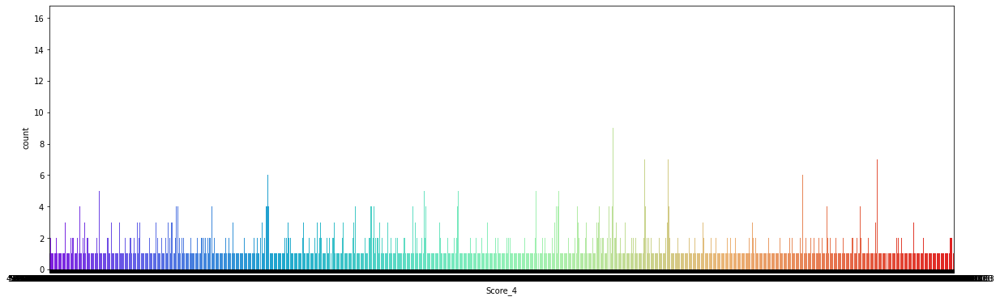

In [ ]:
# Perform the countplot on the Score 4
plt.figure(figsize=(20,6))
sns.countplot(x= 'Score_4', data =train_dataset, palette='rainbow')

From above count plot

distribution of values over complete dataset are multi model that is more than one peak.

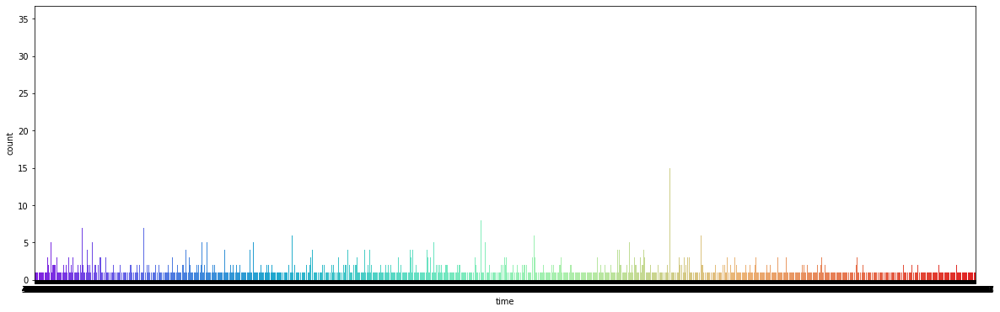

In [ ]:
# Perform the countplot on time
plt.figure(figsize=(20,6))
sns.countplot(x= 'time', data =train_dataset, palette='rainbow')

distribution of values over complete dataset are multi model

# point PLOT

1. A point plot uses scatter plot glyphs to visualize features like point estimates and confidence intervals.

2. A point plot uses scatter plot points to represent the central tendency of numeric data.

3. These plots make use of error bars to indicate any uncertainty around the numeric

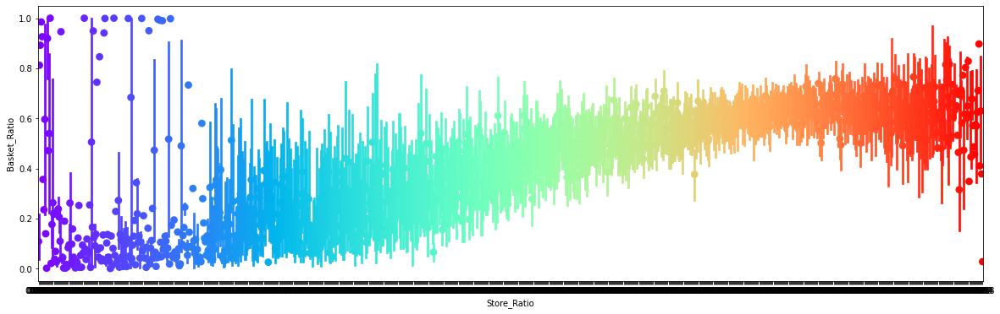

In [ ]:
# Perform point plot between Store Ratio and Basket Ratio
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Basket_Ratio', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a increase in basket ratio when there is a increase in store ratio. That is both are correlated

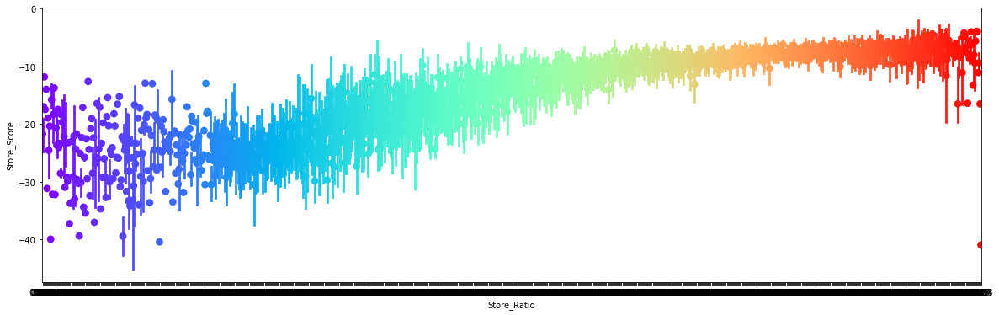

In [ ]:
# Perform point plot between Store Ratio and Store Score
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Store_Score', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a increase in store score when there is a increase in store ratio. That is both are correlated

increase decrease increase decrease

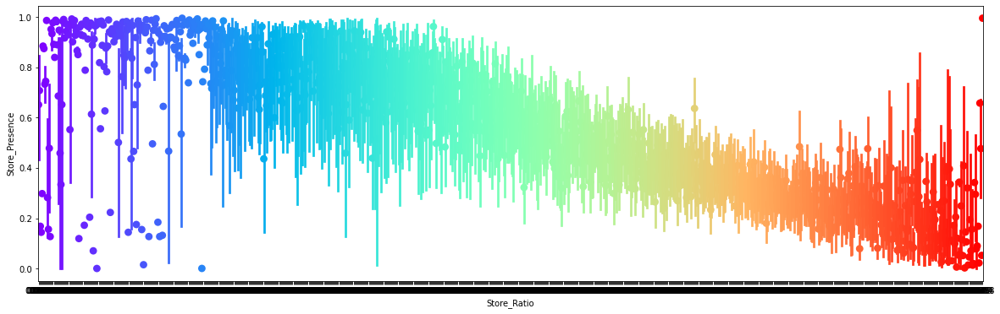

In [ ]:
# Perform point plot between Store Ratio and Store Presence
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Store_Presence', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a increase in store ratio when there is a decrease in store presence.

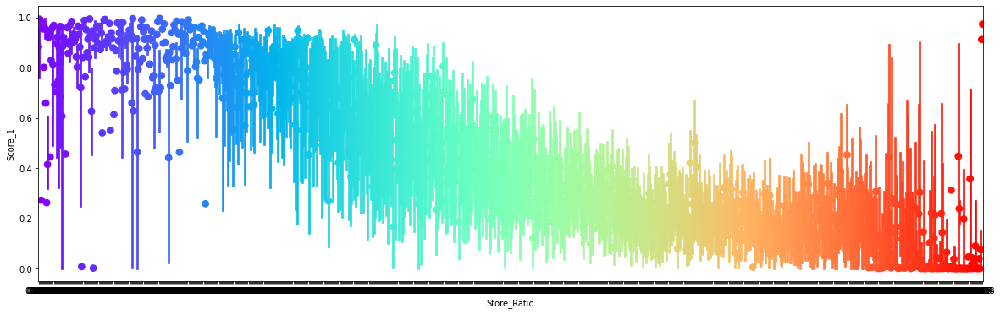

In [ ]:
# Perform point plot between Store Ratio and Score 1
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Score_1', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a decrease in score3 when there is a increase in store ratio.

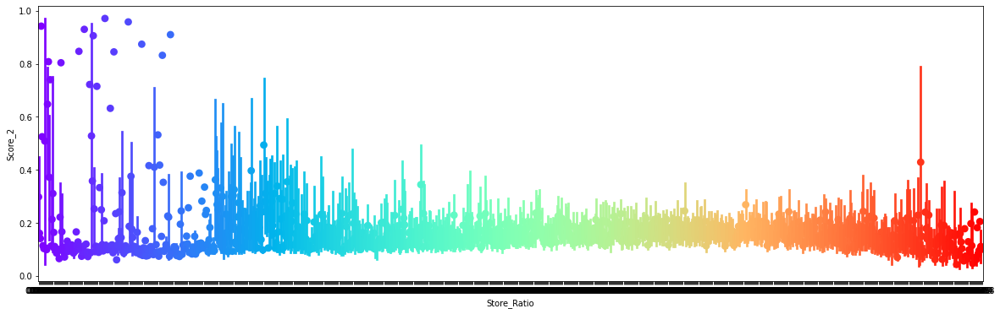

In [ ]:
# Perform point plot between Store Ratio and Score 2 
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Score_2', data = train_dataset , join=False,palette='rainbow')

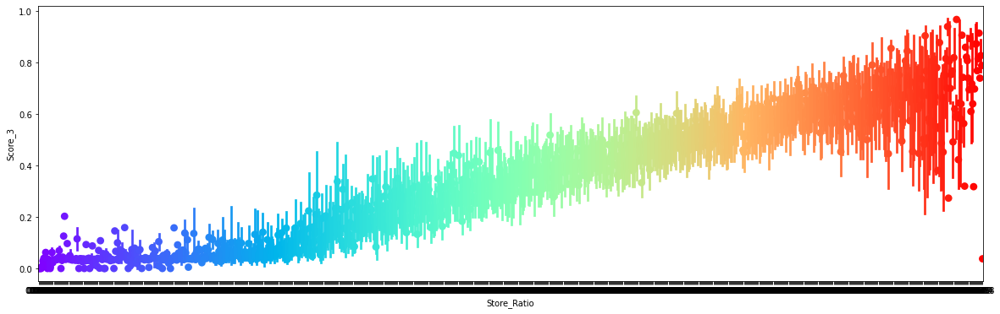

In [ ]:
# Perform point plot between Store ratio and Score 3
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='Score_3', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a increase in store ratio when there is a increase in score3. That is both are correlated

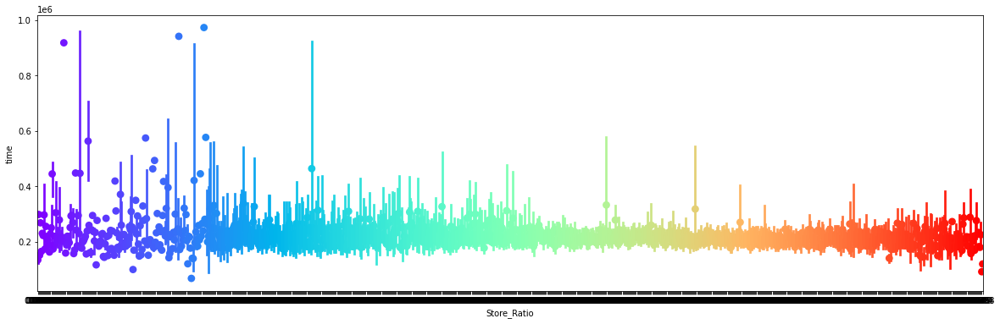

In [ ]:
# Perform point plot between Store Ratio and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Ratio', y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are between 0.2 to 0.3
2. Very few points above 0.3

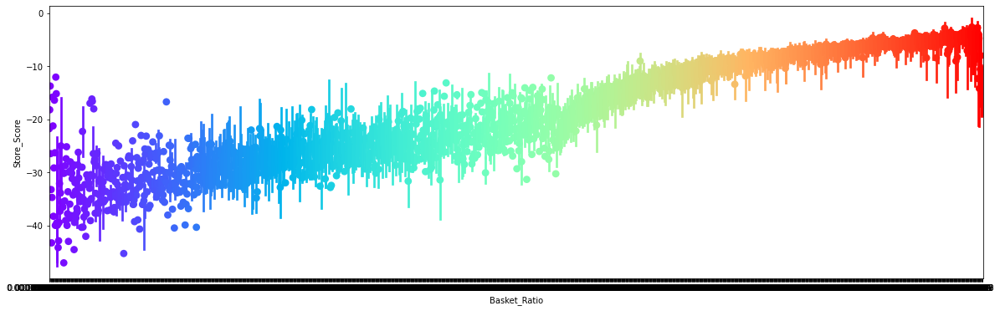

In [ ]:
# Perform point plot between Basket Ratio and Store Score
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio', y='Store_Score', data = train_dataset , join=False,palette='rainbow')

From above point plot

There is a increase in store score when there is a increase in basket ratio. 

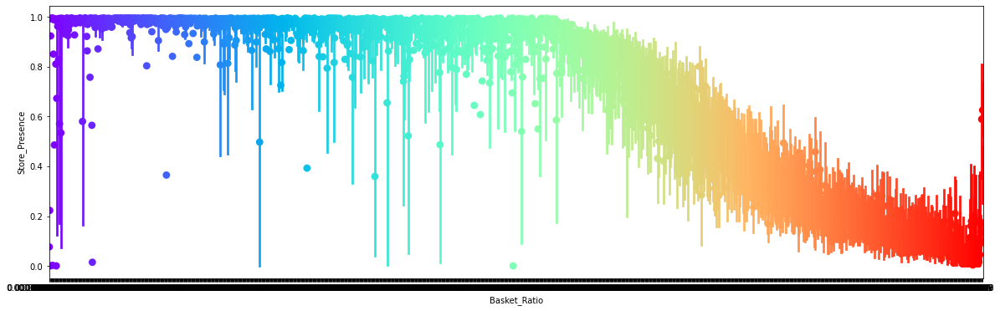

In [ ]:
# Perform point plot between Basket Ratio and Store Presence
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio', y='Store_Presence', data = train_dataset , join=False,palette='rainbow')

observation from above point plot 

there is decrease in value on store presence as value of basket ratio is increasing

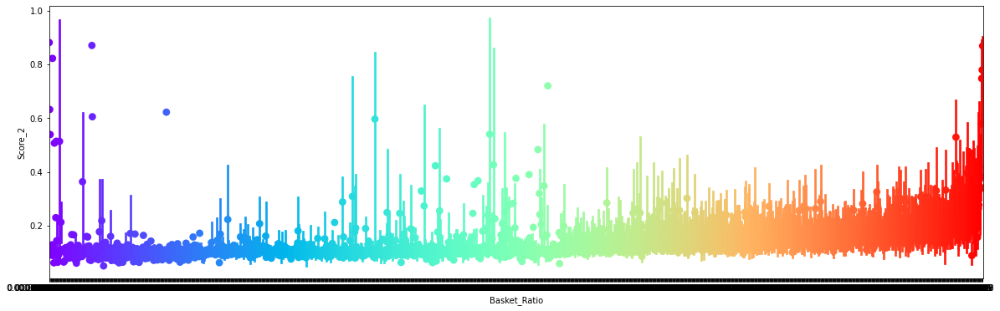

In [ ]:
# Perform point plot between Basket Ratio and Score 2
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio', y='Score_2', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are between 0.0 to 0.2
2. Very few points above 0.2

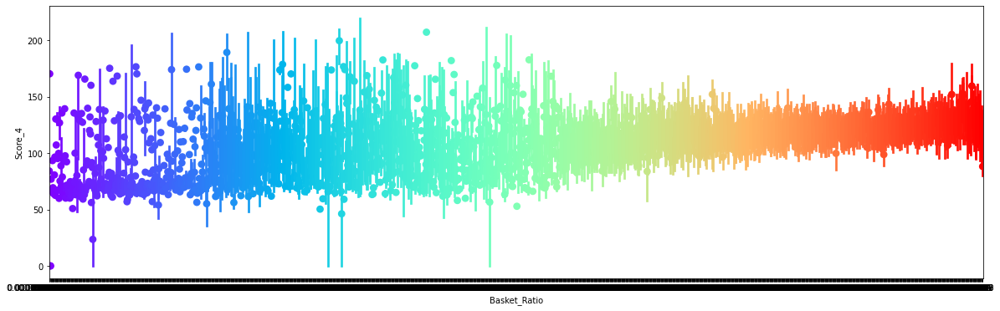

In [ ]:
# Perform point plot between Basket Ratio and Score 4
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio', y='Score_4', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 50 to 150

Very few points above 150 and below 50

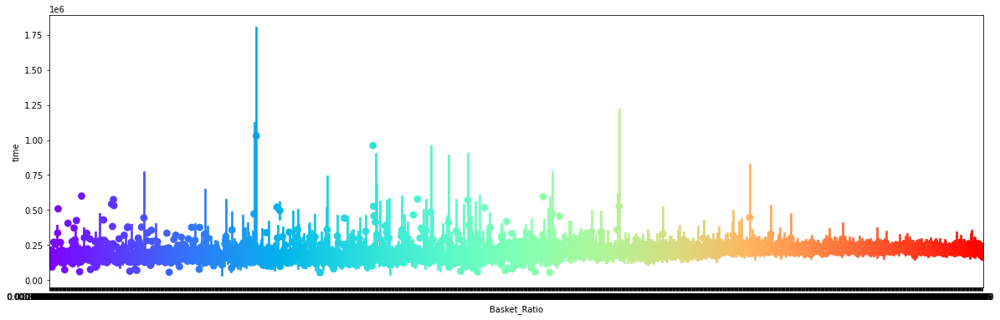

In [ ]:
# Perform point plot between Basket Ratio and Time
plt.figure(figsize=(20,6))
sns.pointplot(x='Basket_Ratio', y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 0.0 to 0.50

Very few points above 0.50



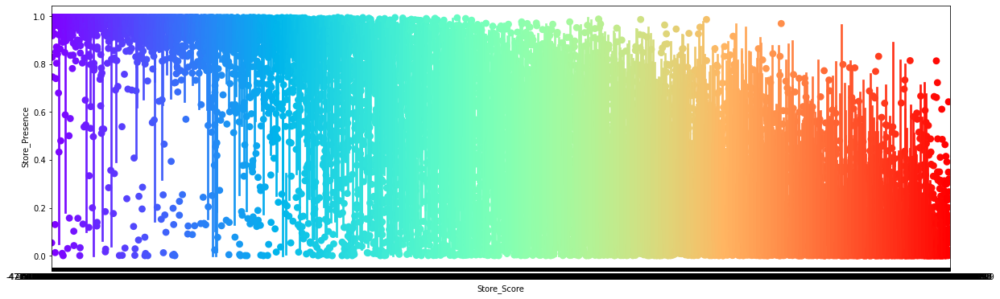

In [ ]:
# Perform point plot between Store Score and Store Presence
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score', y='Store_Presence', data = train_dataset , join=False,palette='rainbow')

as the value of store score increasing value of store presence decreasing

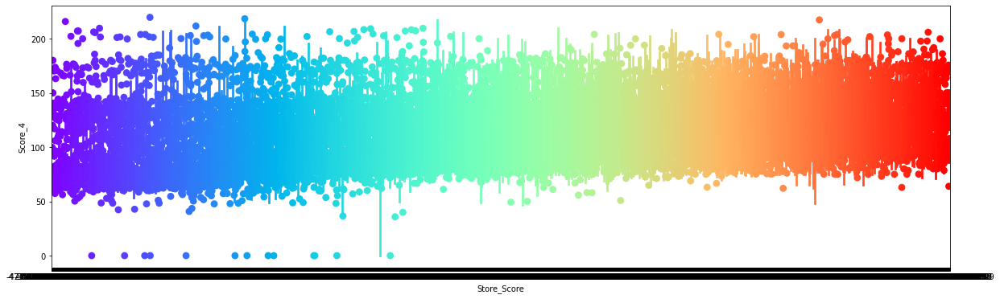

In [ ]:
# Perform point plot between Store Score and Score 4 
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score', y='Score_4', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 50 to 200

Very few points above 200 and below 50

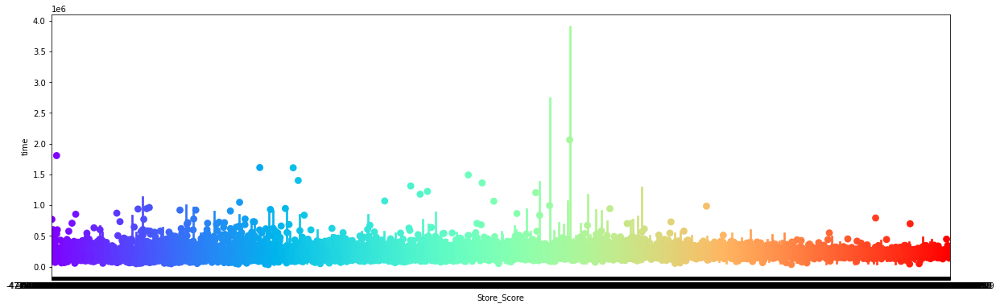

In [ ]:
# Perform point plot between Store Score and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Score', y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 0.0 and 0.5

Very few points above 0.5

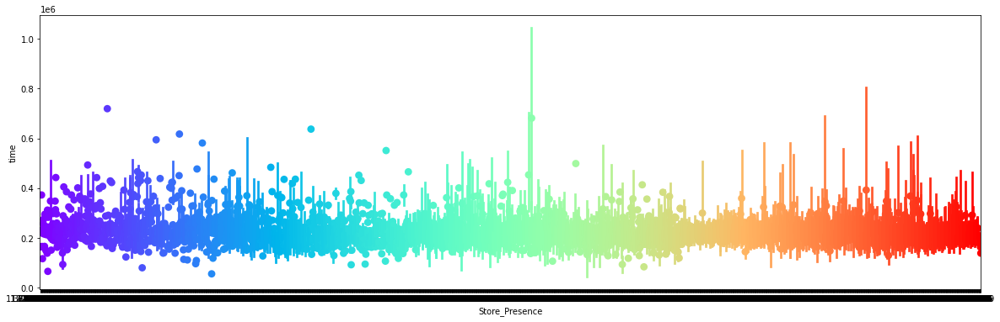

In [ ]:
# Perform point plot between Store Presence and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence', y= 'time',data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 0.1 and 0.4

Very few points above 0.4 and below 0,1

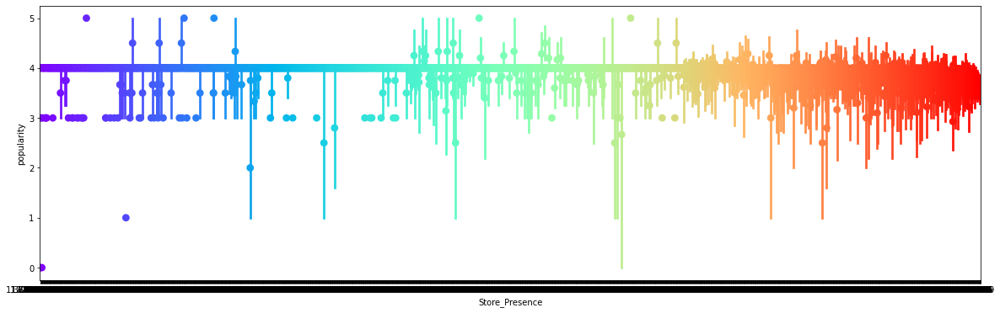

In [ ]:
# Perform point plot between Store presence and popularity
plt.figure(figsize=(20,6))
sns.pointplot(x='Store_Presence',y='popularity', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 3 to 4

Very few points above 4 and below 3

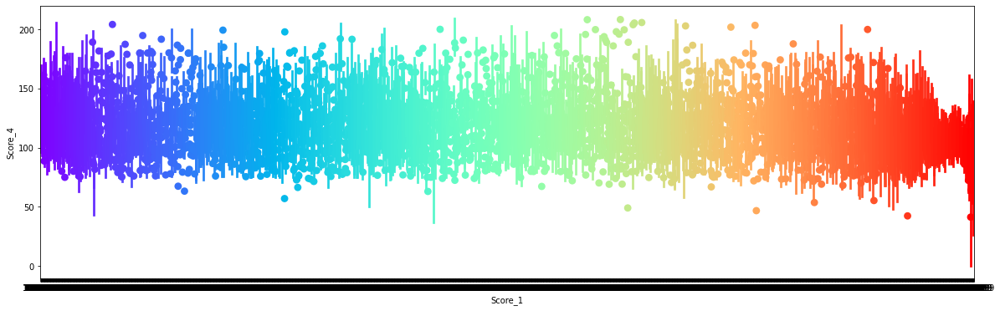

In [ ]:
# Perform point plot between Score 1 and score 4
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y='Score_4', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 75 to 175
Very few points above 175 and below 75

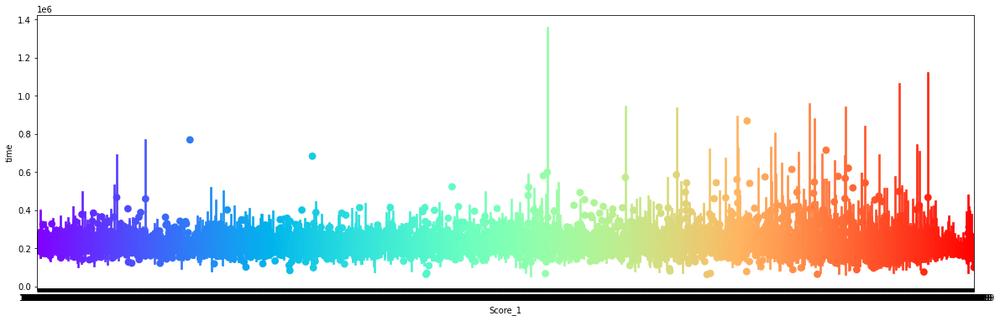

In [ ]:
# Perform point plot between Score 1 and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_1',y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are between 0.1 to 0.4
2. Very few points above 0.4

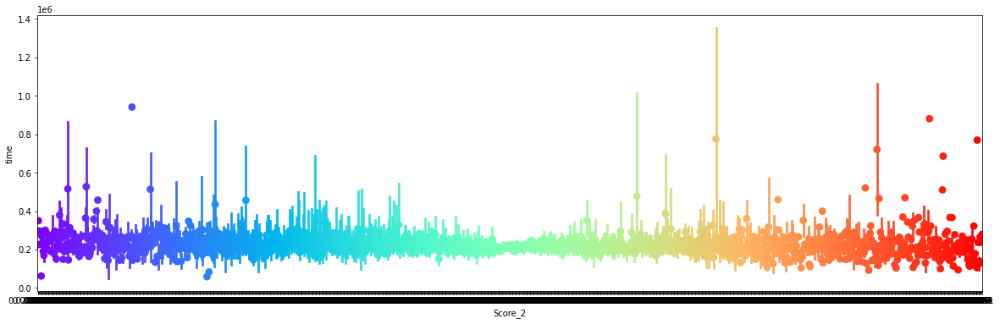

In [ ]:
# Perform point plot between Score 2 and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are between 1 to 3

2. Very few points above 3

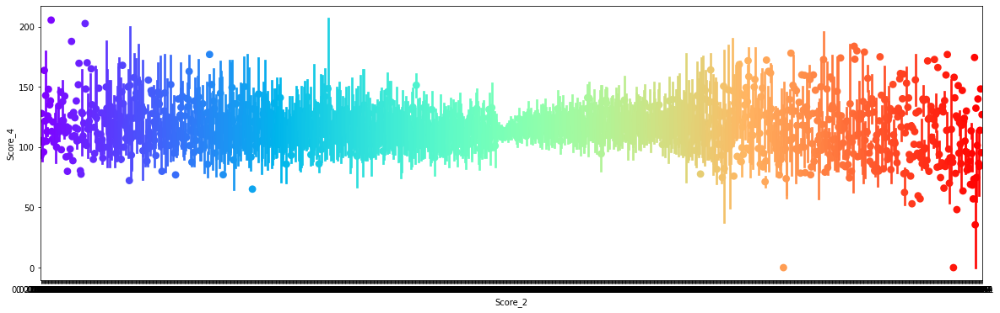

In [ ]:
# Perform point plot between Score 2 and Score 4
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y='Score_4', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 75 to 150

Very few points above 150 and below 75

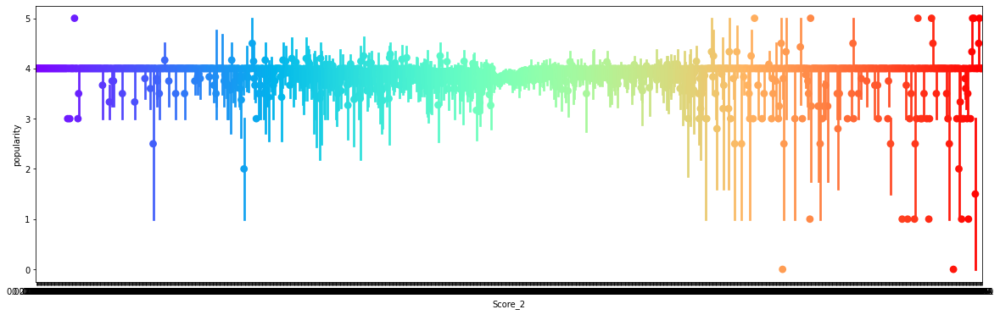

In [ ]:
# Perform point plot between Score 2 and popularity
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_2',y='popularity', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are around 4
2. few points are between 3 and 4
3. very few are below 3

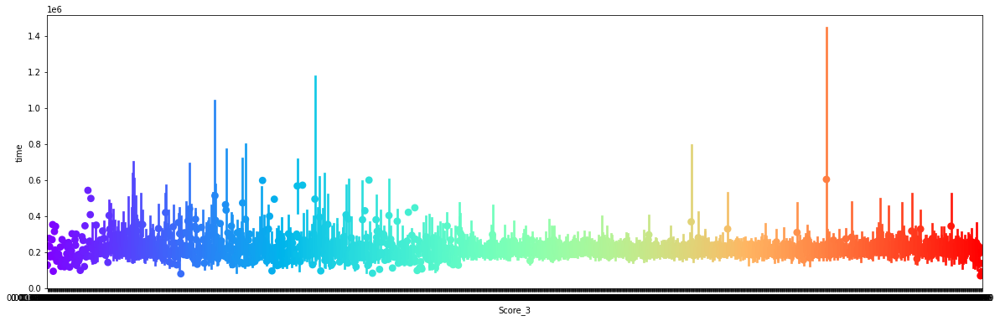

In [ ]:
# Perform point plot between Score 3 and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_3',y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between o.0 to 0.4

Very few points above 0.4

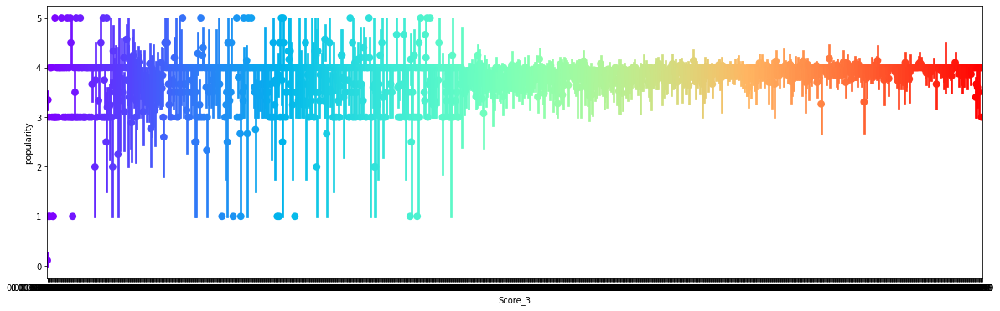

In [ ]:
# Perform point plot between Score 3 and popularity
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_3',y='popularity', data = train_dataset , join=False,palette='rainbow')

From above pointplot

Most of the points are between 3 to 4

Very few points above 4 and below 3

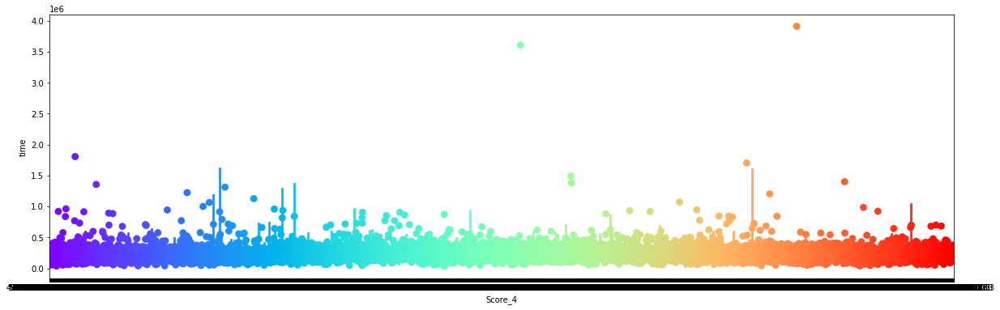

In [ ]:
# Perform point plot between Score 4 and time
plt.figure(figsize=(20,6))
sns.pointplot(x='Score_4',y='time', data = train_dataset , join=False,palette='rainbow')

From above pointplot

1. Most of the points are between o to 0.5
2. Very few points above 0.5

# DISTPLOT

The distplot represents the univariate distribution of data i.e. data distribution of a variable against the density distribution

Store_Ratio


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


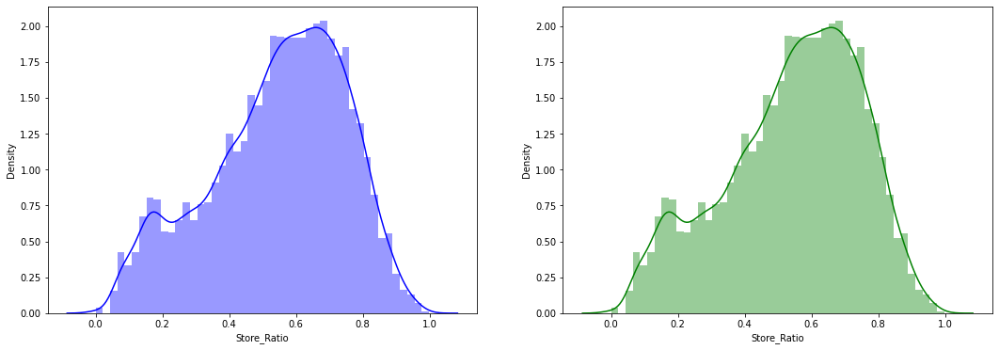

Basket_Ratio


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


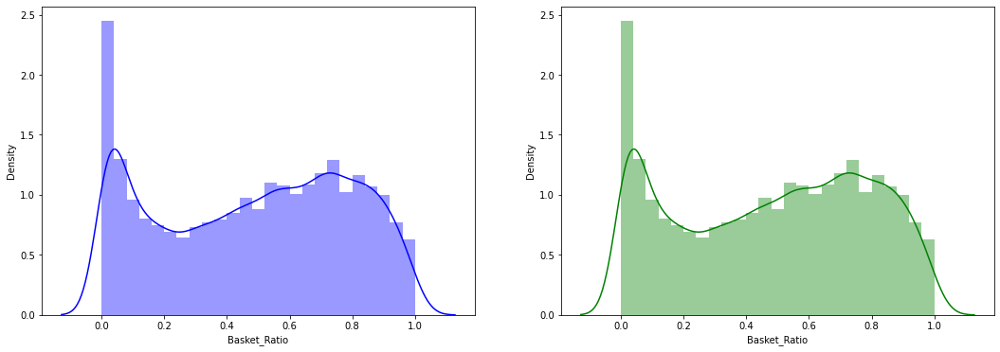

Category_1


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


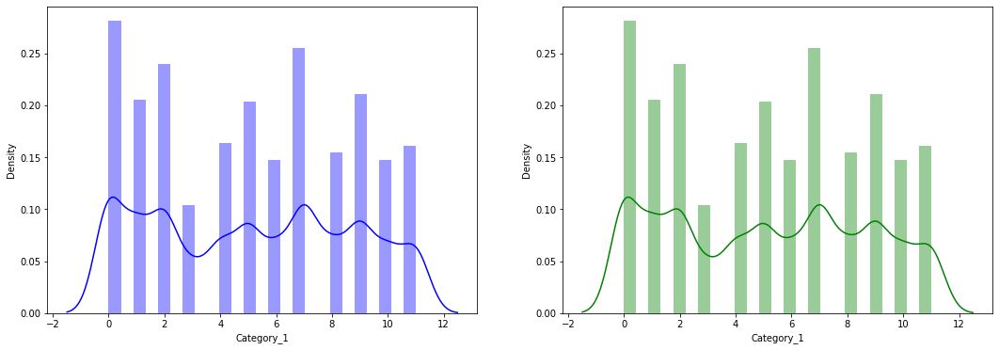

Store_Score


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


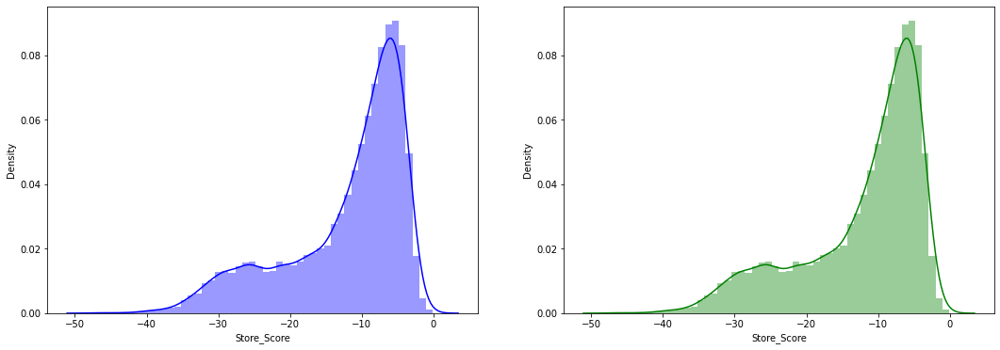

Category_2


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


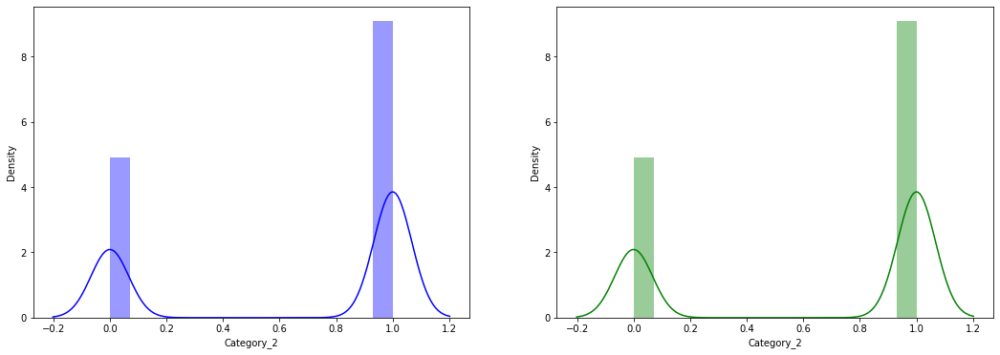

Store_Presence


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


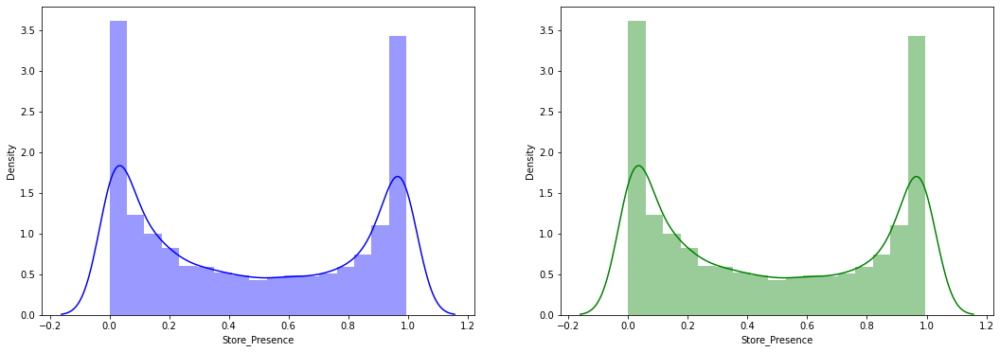

Score_1


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


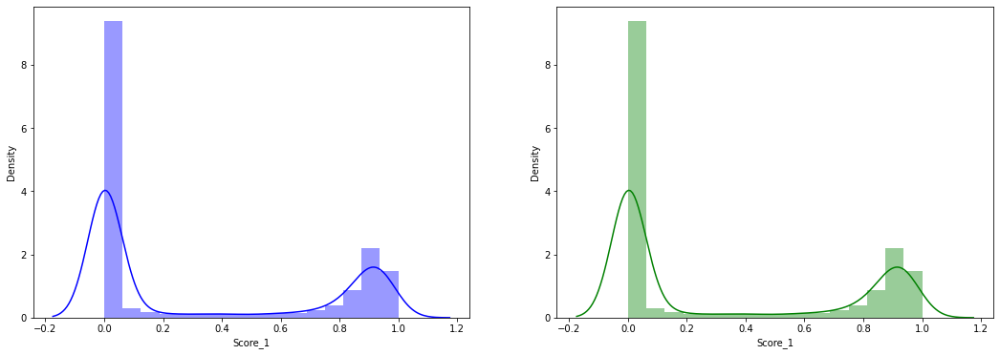

Score_2


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


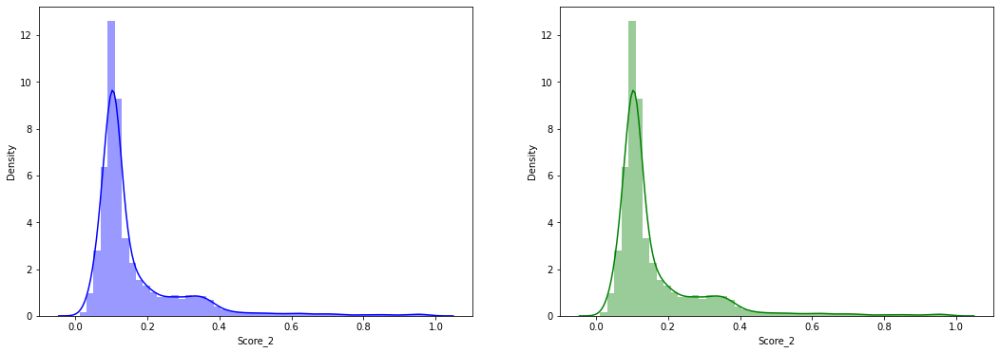

Score_3


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


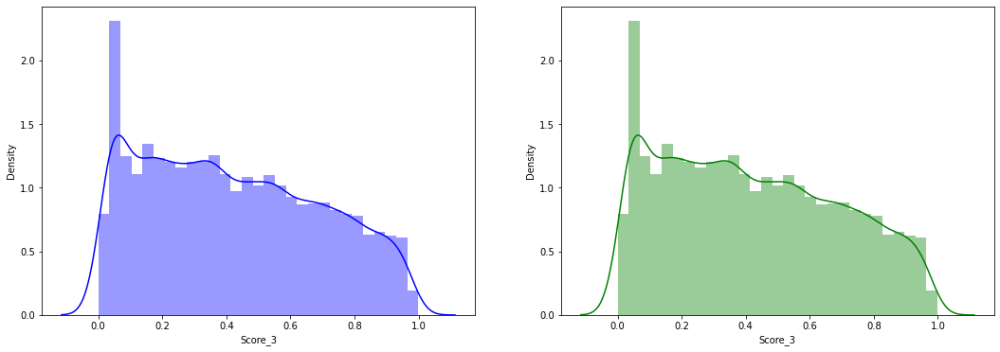

Score_4


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


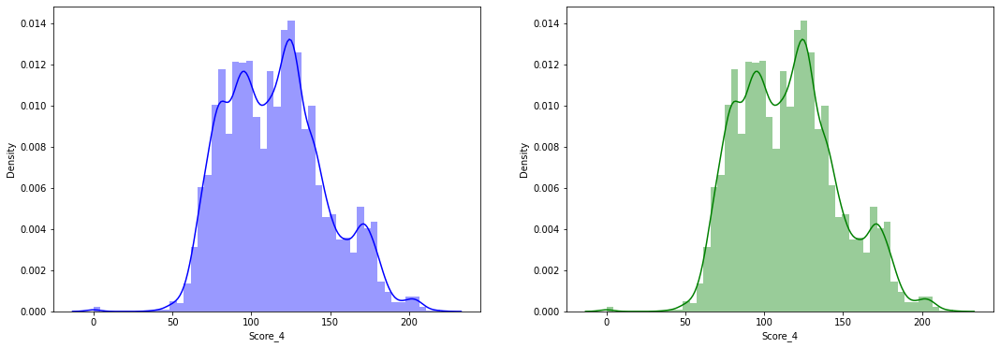

time


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


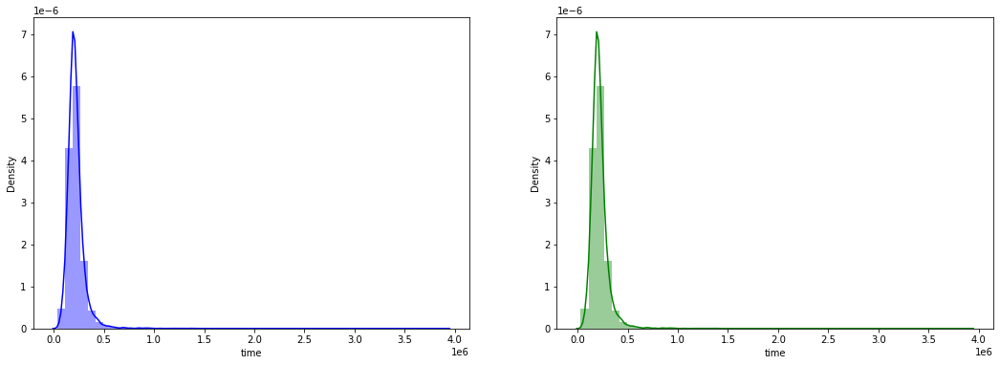

popularity


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


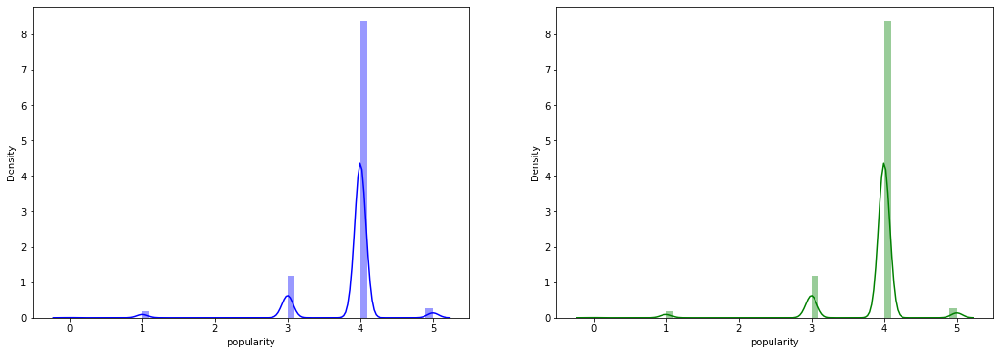

In [ ]:
#Perform distplot for all the columns in dataset
for column in train_dataset.columns:
  print(column)
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,6))
  sns.distplot(train_dataset[column],ax=ax[0],color='blue')
  sns.distplot(train_dataset[column],ax=ax[1],color='green')
  plt.show()
  
plt.show()

OBSERVATIONS
1. distribution of store ratio, store presence, score3 and popularity are right skewed
2. distribution of basket ratio, score2 and time are skewed left
3. distribution of category 1 is multimodal
4. distribution of category2 and score1 are bimodal

# dendrogram

The dendrogram is a visual representation of the compound correlation data. The individual compounds are arranged along the bottom of the dendrogram and referred to as leaf nodes. Compound clusters are formed by joining individual compounds or existing compound clusters with the join point referred to as a node.

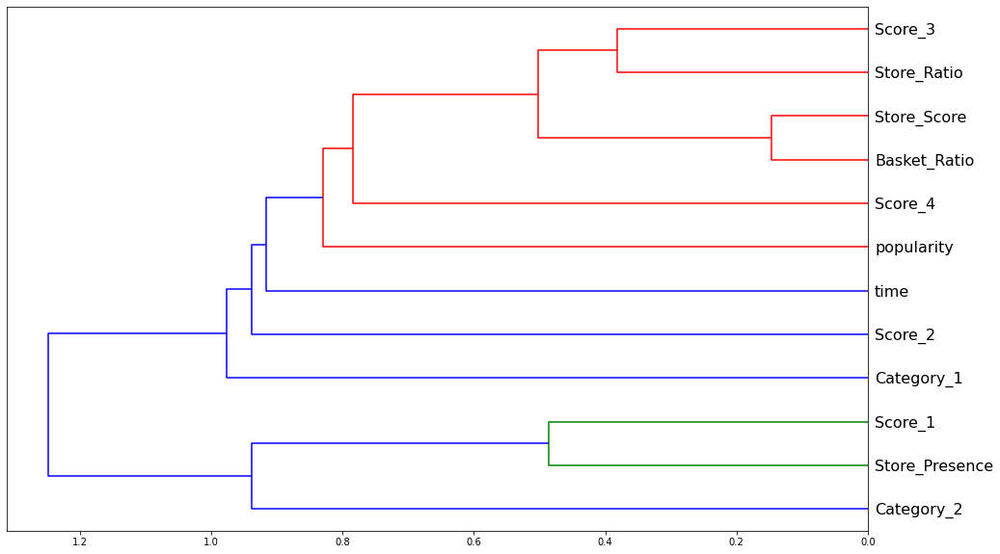

In [ ]:
# Plot a Dendrogram on the columns of the dataset
X = train_dataset.dropna()
import scipy
from scipy.cluster import hierarchy as hc

corr = np.round(scipy.stats.spearmanr(X).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(16,10))
dendrogram = hc.dendrogram(z, labels= X.columns, orientation='left', leaf_font_size=16)
plt.show()



strongly correlated variables
1. score3 and store ratio
2. store score and basket ratio
3. score1 and store presence

# Boxen plot

The boxen plot, otherwise known as a Letter-value plot, is a box plot meant for large data sets (n > 10,000).

The Boxen plot is very similar to box plot, except for the fact that it plots different quartile values.

By plotting different quartile values, we are able to understand the shape of the distribution particularly in the head end and tail end.

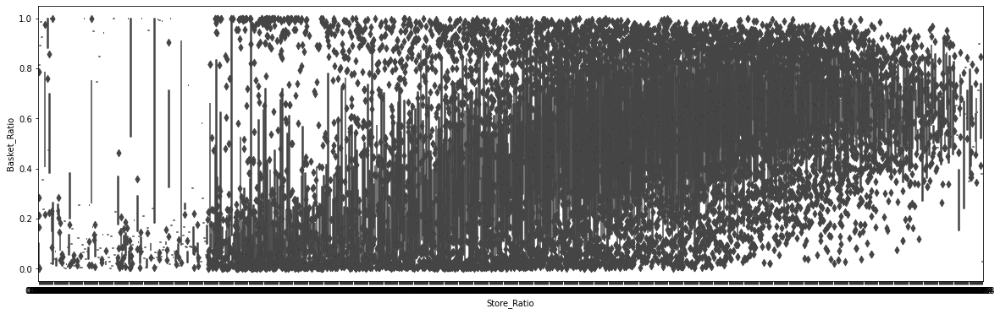

In [ ]:
#Perform boxen plot between Store ratio and Basket ratio 
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Basket_Ratio', 
              data = train_dataset)

there is positive correlation betwwen store ratio and basket ratio.

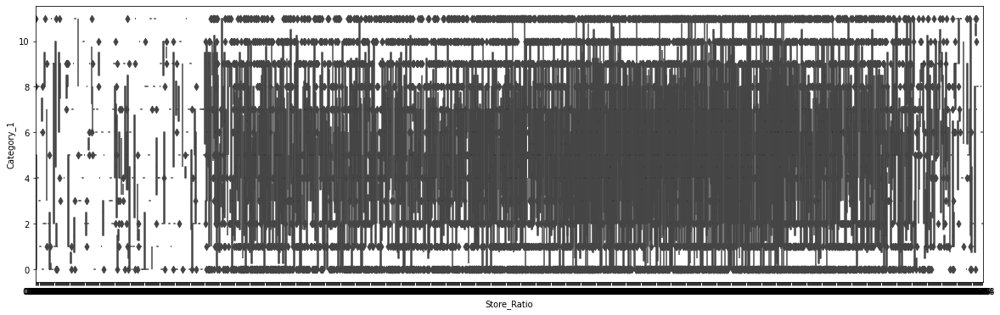

In [ ]:
#Perform boxen plot between Store ratio and Category 1  
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Category_1', 
              data = train_dataset)


there is no relation between store ratio and category 1

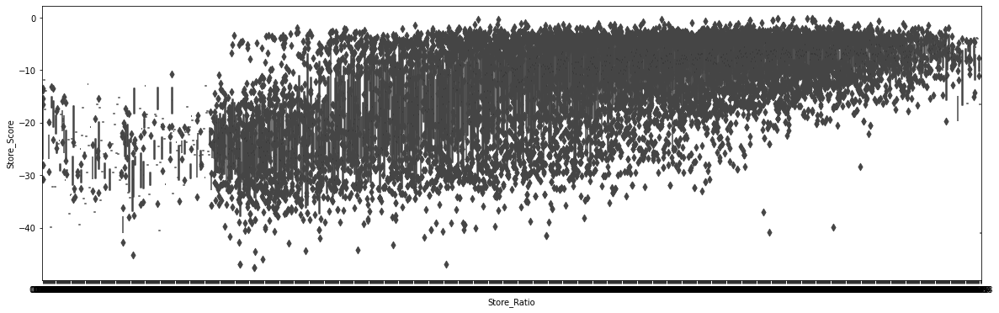

In [ ]:
#Perform boxen plot between Store ratio and Store Score
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Store_Score', 
              data = train_dataset)

there is positive correlation between store ratio and store score.

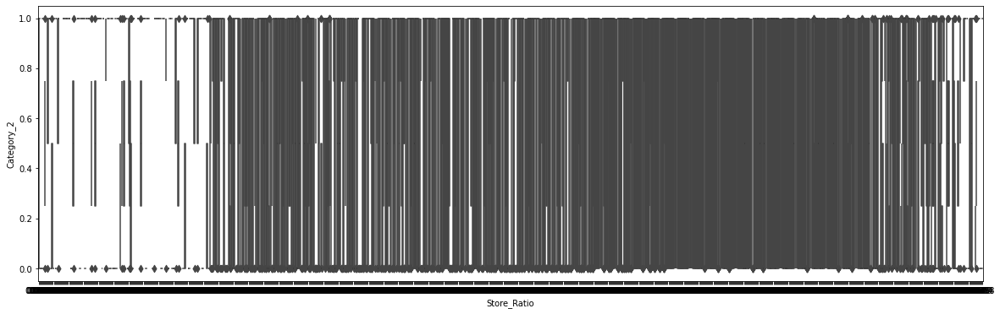

In [ ]:
#Perform boxen plot between Store ratio and Category 2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Category_2', 
              data = train_dataset)

there is weak correlation between store ratio and category 2

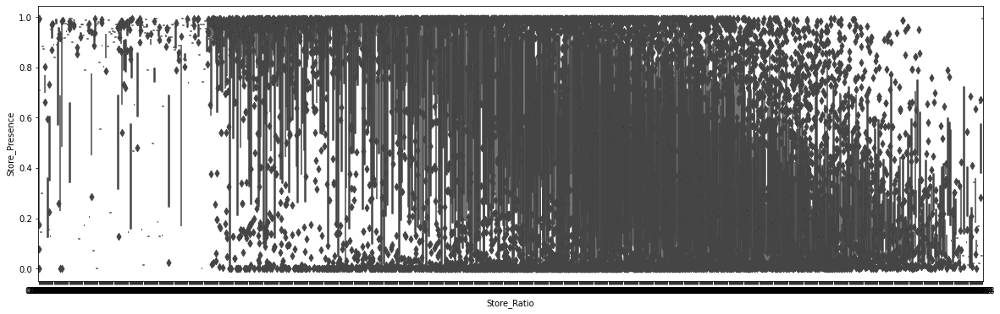

In [ ]:
#Perform boxen plot between Store ratio and Store presence
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Store_Presence', 
              data = train_dataset)

there is strong negative correlation between store presence and store ratio

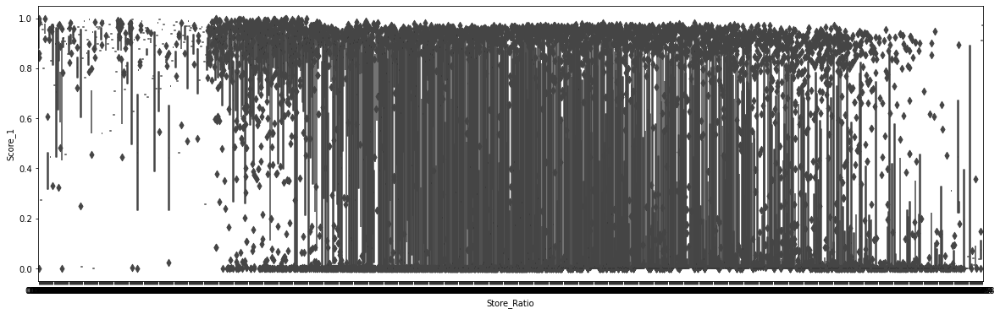

In [ ]:
#Perform boxen plot between Store ratio and Score 1  
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Score_1', 
              data = train_dataset)

there is weak correlation between store ratio and score1

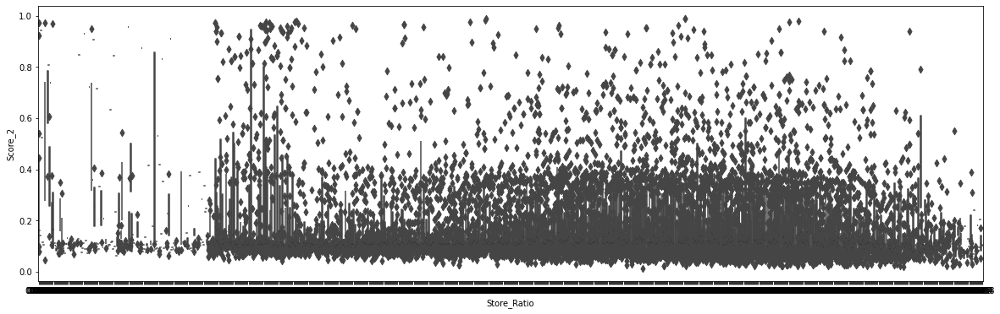

In [ ]:
#Perform boxen plot between Store ratio and Score 2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Score_2', 
              data = train_dataset)

there is no relation between store ratio and score 2

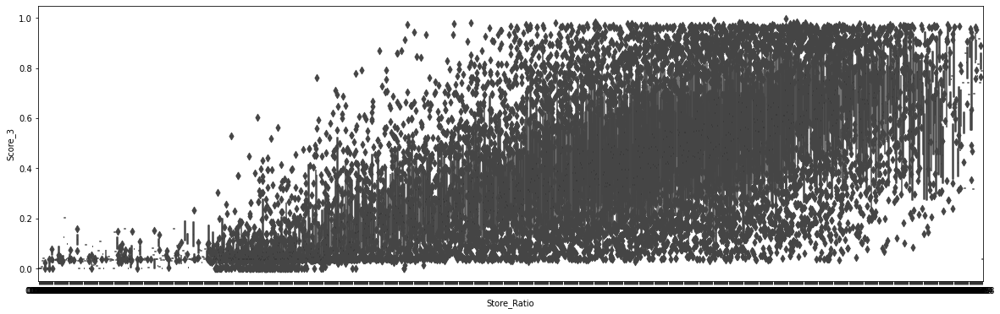

In [ ]:
#Perform boxen plot between Store ratio and Score 3
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'Score_3', 
              data = train_dataset)

there is positive correlation with store ratio and score 3

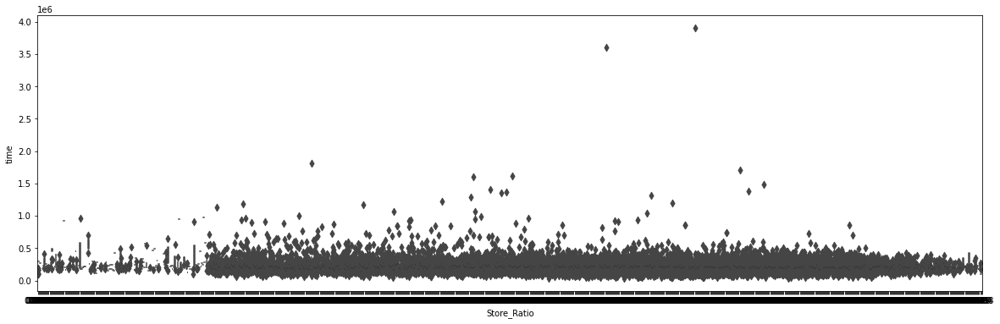

In [ ]:
#Perform boxen plot between Store ratio and time
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Ratio', y = 'time', 
              data = train_dataset)

there is no relation between store ratio and time

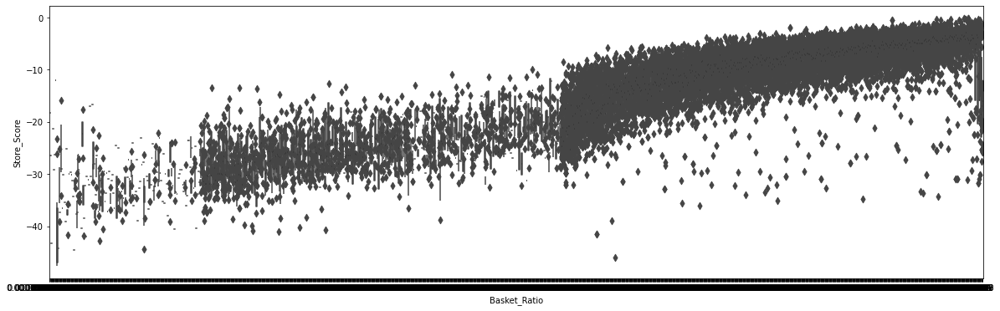

In [ ]:
#Perform boxen plot between Basket Ratio and Score Score
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Basket_Ratio', y = 'Store_Score', 
              data = train_dataset)

there is a positive correlation between store score and basket ratio

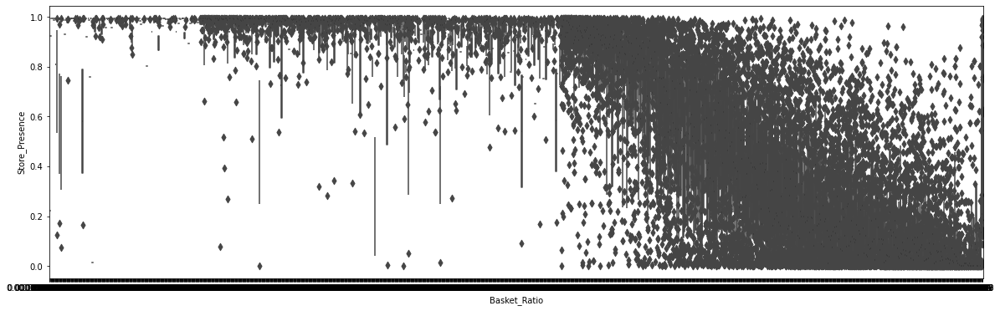

In [ ]:
#Perform boxen plot between Basket Ratio and Store presence 
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Basket_Ratio', y = 'Store_Presence', 
              data = train_dataset)

after a certain point as the value ok basket ratio is increasing value of store presence is decreasing

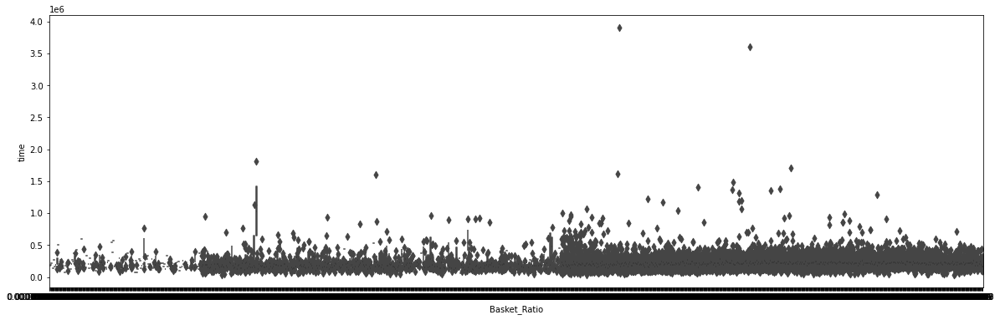

In [ ]:
#Perform boxen plot between Basket ratio and time
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Basket_Ratio', y = 'time',
              data = train_dataset)

there is no relation between time and basker ratio

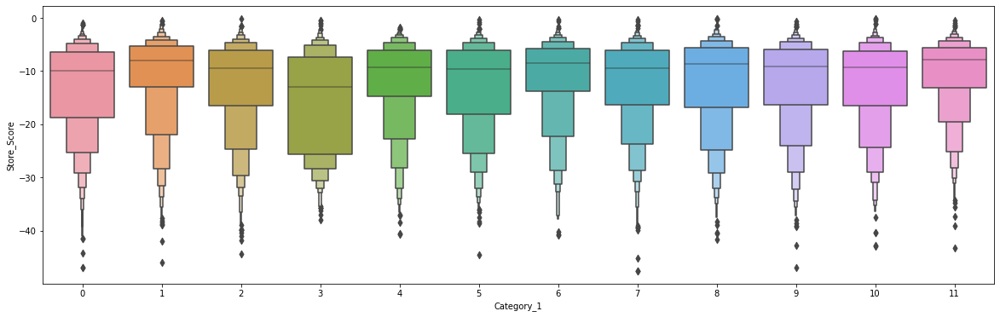

In [ ]:
#Perform boxen plot between Category 1 and Store score
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Store_Score',
              data = train_dataset)


there is no relation between between store score and category1

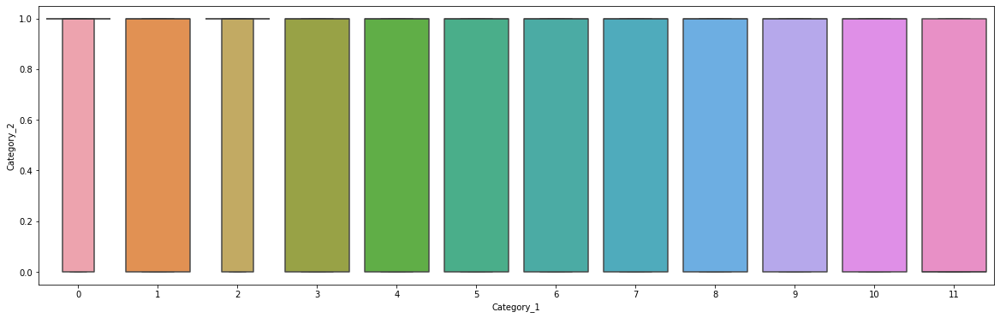

In [ ]:
#Perform boxen plot between Category 1 and Category 2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Category_2',
              data = train_dataset)

there is weak relation between category1 and category2

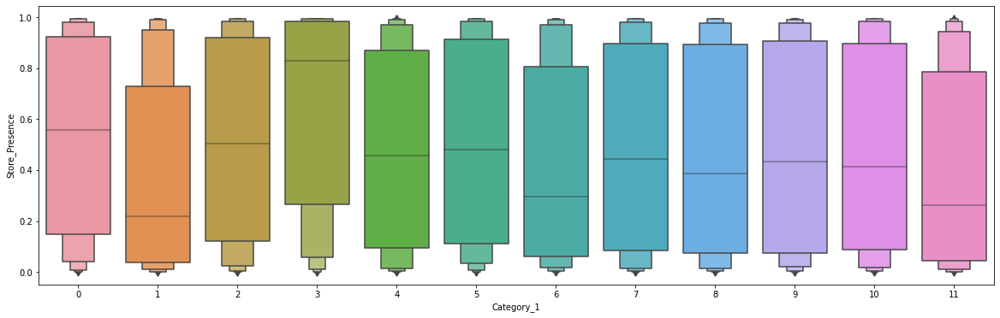

In [ ]:
#Perform boxen plot between Category 1 and Store presence
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Store_Presence',
              data = train_dataset)

there is weak relation between category1 and store presence

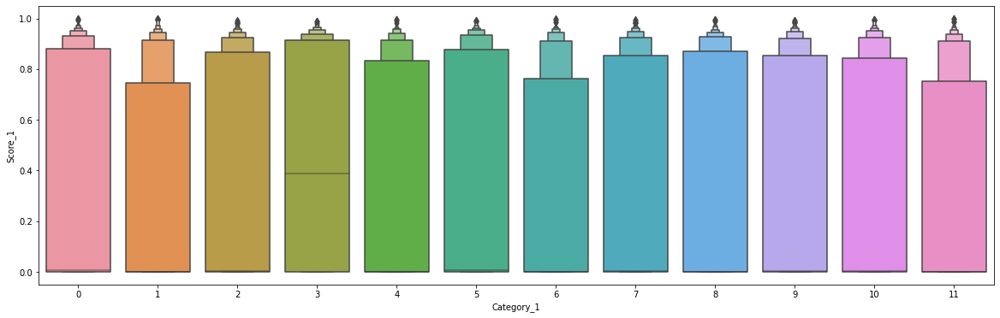

In [ ]:
#Perform boxen plot between Category 1 and Score 1
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Score_1',
              data = train_dataset)

there is weak relation between category1 and score1

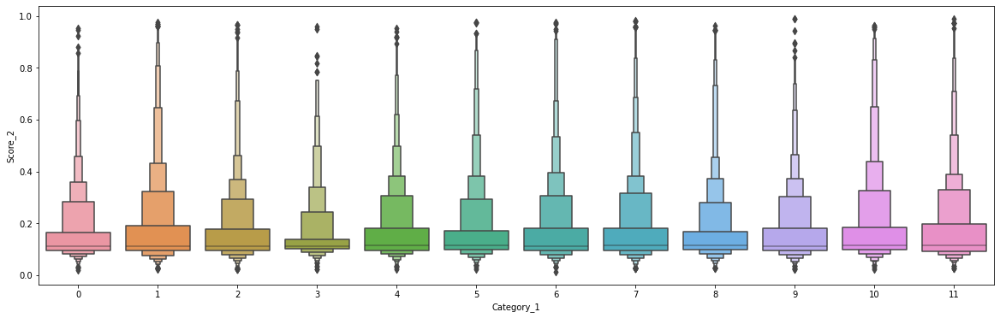

In [ ]:
#Perform boxen plot between Category 1 and Score 2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Score_2',
              data = train_dataset)

there is no relation between category1 and score2

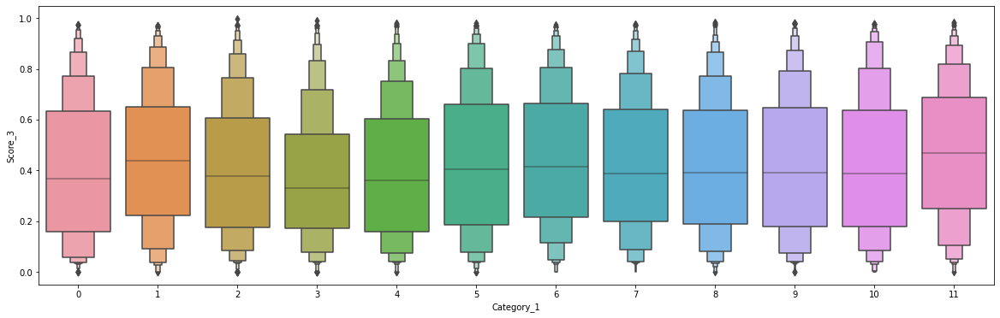

In [ ]:
#Perform boxen plot between Category 1 and Score 3
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Score_3',
              data = train_dataset)

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.

there is no relation between category1 and score3

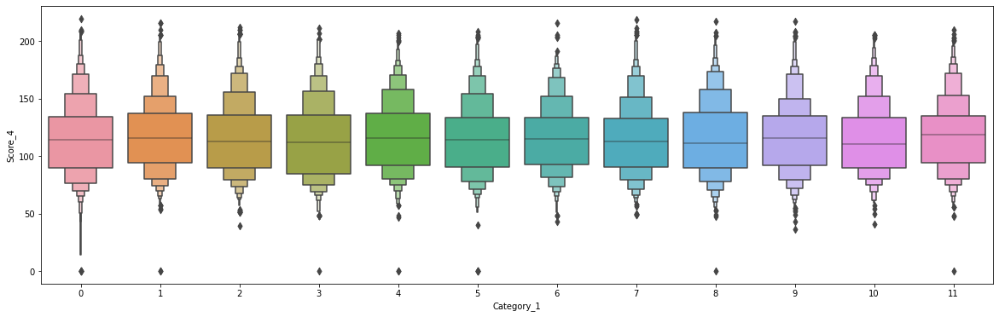

In [ ]:
#Perform boxen plot between Category 1 and Score 4
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'Score_4',
              data = train_dataset)

from above boxen plot:

The distribution between lower adjacent value and upper adjacent value is symmetrical.

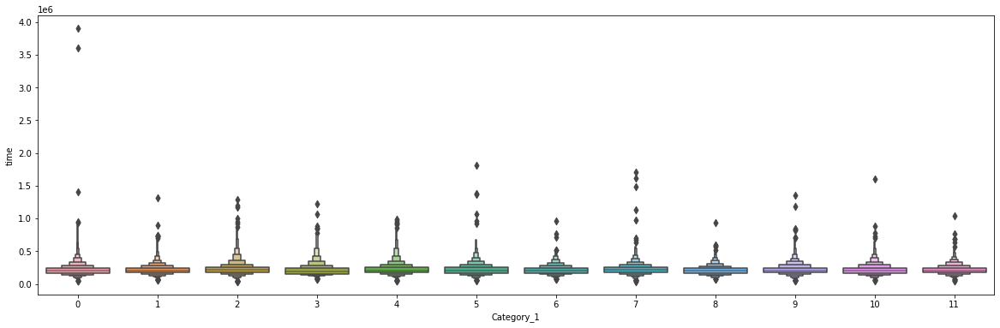

In [ ]:
#Perform boxen plot between Category 1 and time
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'time',
              data = train_dataset)

from above boxen plot:

There is no relation between time and category1

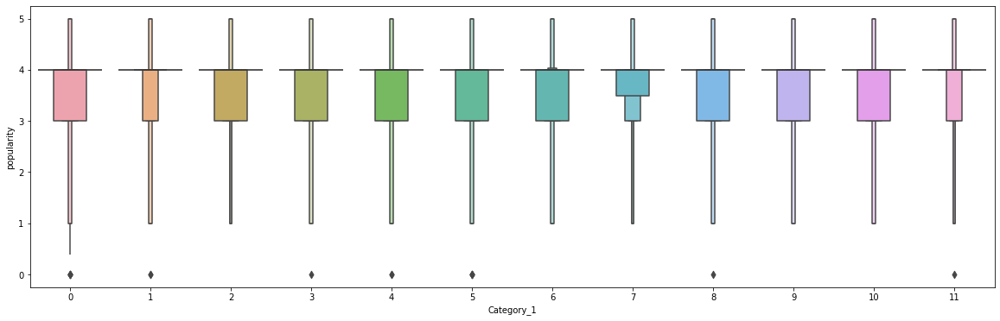

In [ ]:
#Perform boxen plot between Category 1 and popularity
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_1', y = 'popularity',
              data = train_dataset)

there is no relation between category1 and popularity

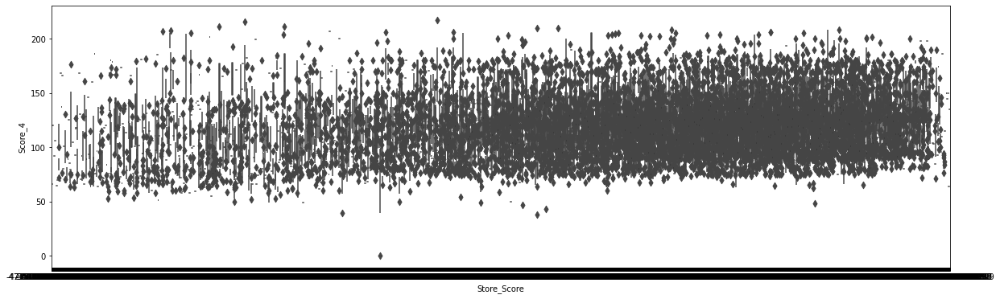

In [ ]:
#Perform boxen plot between Store score and Score 4 
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Score', y = 'Score_4',
              data = train_dataset)

there is weak relation between store score and score2

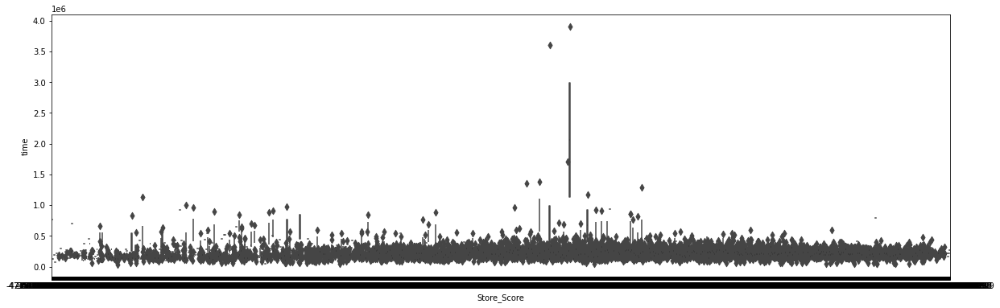

In [ ]:
#Perform boxen plot between Store score and time
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Score', y = 'time',
              data = train_dataset)

there is no relation between time and store score

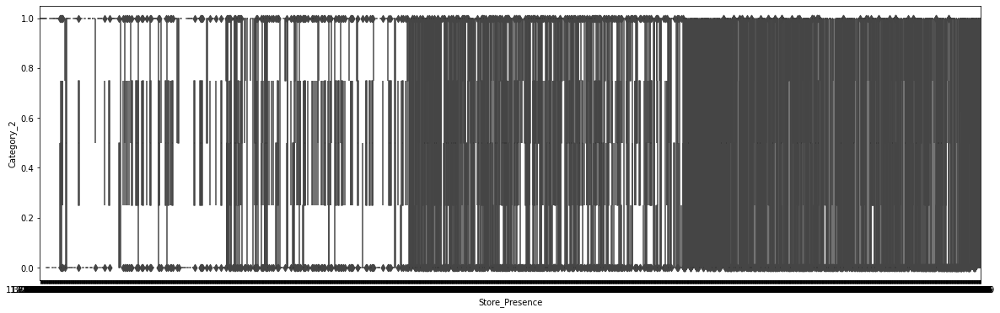

In [ ]:
#Perform boxen plot between Store presence and category2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Presence', y = 'Category_2',
              data = train_dataset)

there is no relation between store presence and category2

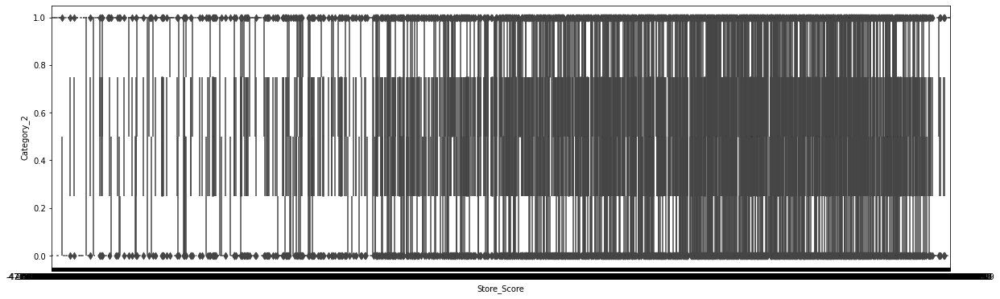

In [ ]:
#Perform boxen plot between score1  and categort2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Store_Score', y = 'Category_2',
              data = train_dataset)

there is no relation between score1 and category2

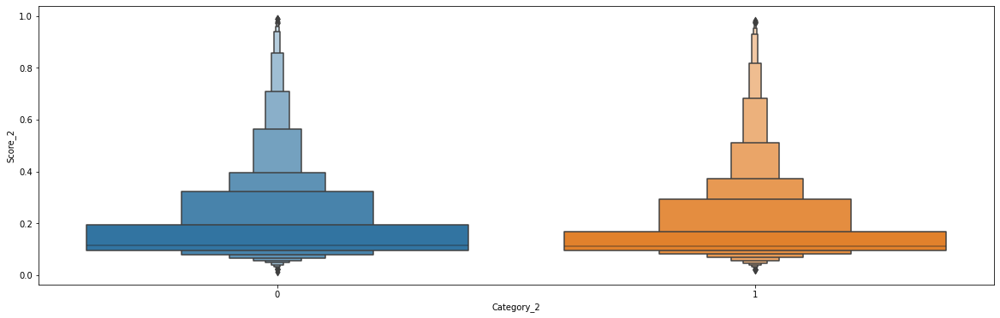

In [ ]:
#Perform boxen plot between category2  and score2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_2', y = 'Score_2',
              data = train_dataset)

there is no relation between score2 and category2

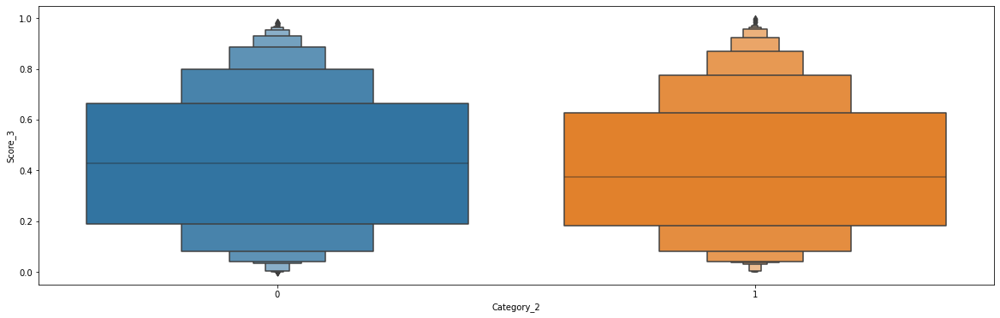

In [ ]:
#Perform boxen plot between category2  and score3
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_2', y = 'Score_3',
              data = train_dataset)

there is no relation between score3 and category2

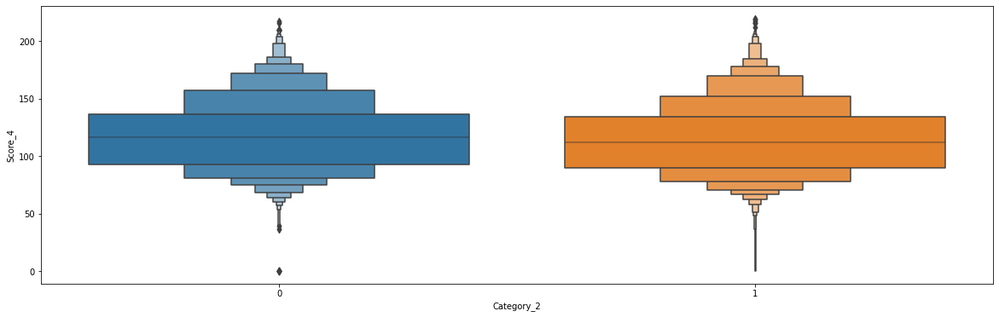

In [ ]:
#Perform boxen plot between category2  and score4
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_2', y = 'Score_4',
              data = train_dataset)

there is no relation between score4 and category2

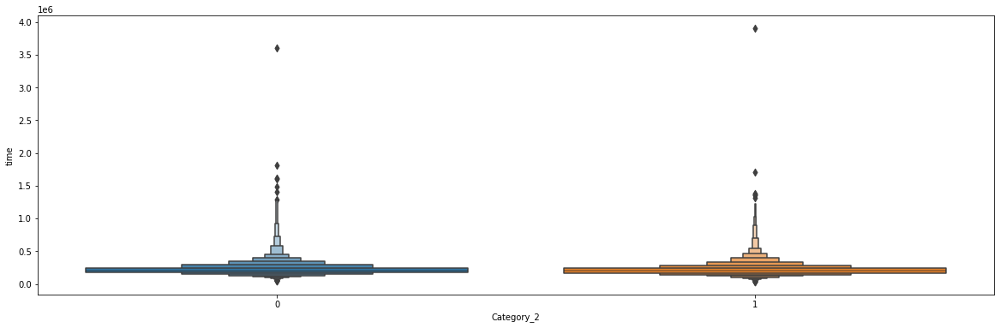

In [ ]:
#Perform boxen plot between category2  and time
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_2', y = 'time',
              data = train_dataset)

there is no relation between time and category2

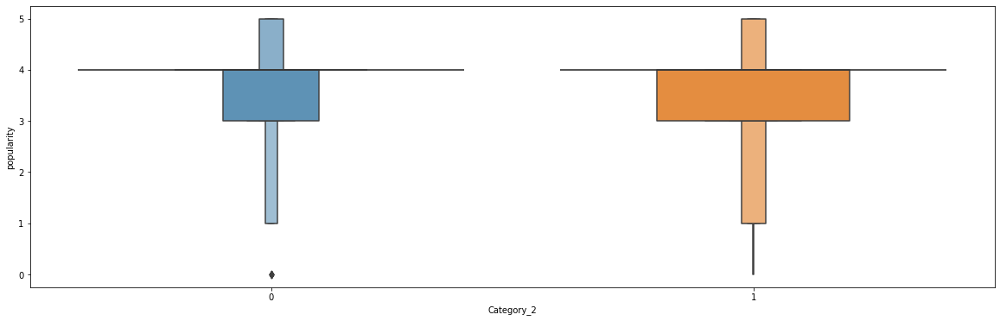

In [ ]:
#Perform boxen plot between category2  and popularity
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'Category_2', y = 'popularity',
              data = train_dataset)

there is no relation between popularity and category2

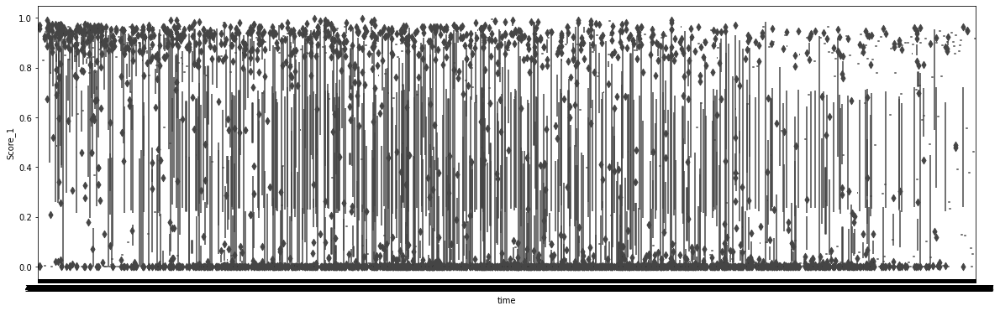

In [ ]:
#Perform boxen plot between time  and score1
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'time', y = 'Score_1',
              data = train_dataset)

there is no relation between score1 and time

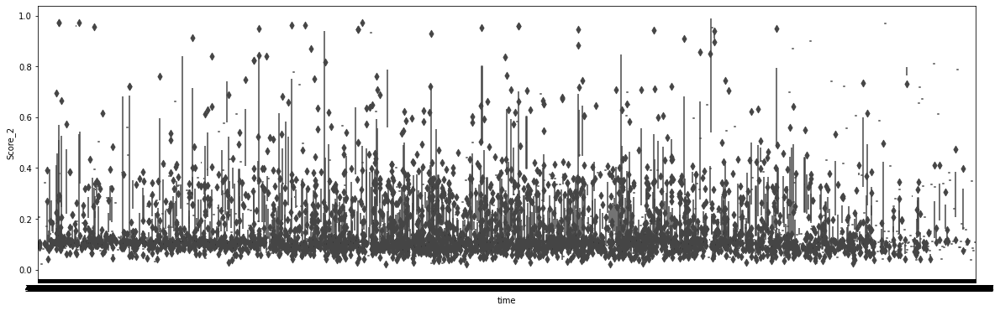

In [ ]:
#Perform boxen plot between time  and score2
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'time', y = 'Score_2',
              data = train_dataset)

there is no relation between score2 and time

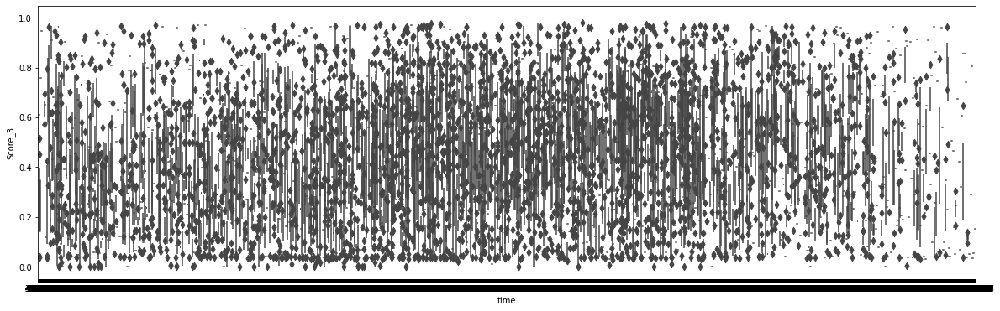

In [ ]:
#Perform boxen plot between time  and score3
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'time', y = 'Score_3',
              data = train_dataset)

there is no relation between score3 and time

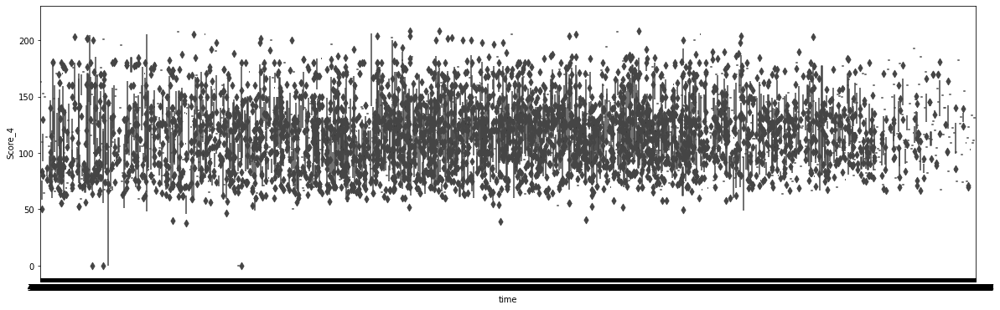

In [ ]:
#Perform boxen plot between time  and score4
plt.figure(figsize=(20,6))
sns.boxenplot(x = 'time', y = 'Score_4',
              data = train_dataset)

there is no relation between score4 and time

# Voilin Plot


1. A violin plot is a method of plotting numeric data.

1. Violin plots are similar to box plots, except that they also show the probability density of the data at different values, usually smoothed by a kernel density estimator.

3. It has:

    1. Median (a white dot on the violin plot)
    2. Interquartile range (the black bar in the center of violin)
    3. The lower/upper adjacent values (the black lines stretched from the bar) — defined as first quartile — 1.5 IQR and third quartile + 1.5 IQR respectively.

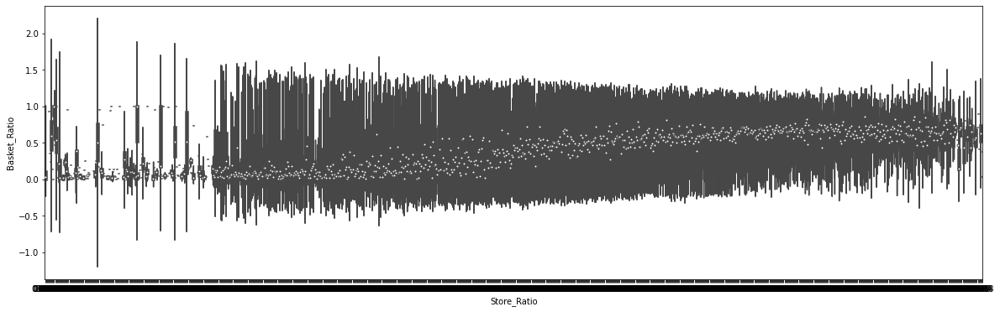

In [ ]:
# perform a violin plot between store ratio and basket ratio
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Basket_Ratio', data=train_dataset, palette='rainbow')

there is a positive correlation between basket ratio and store ratio

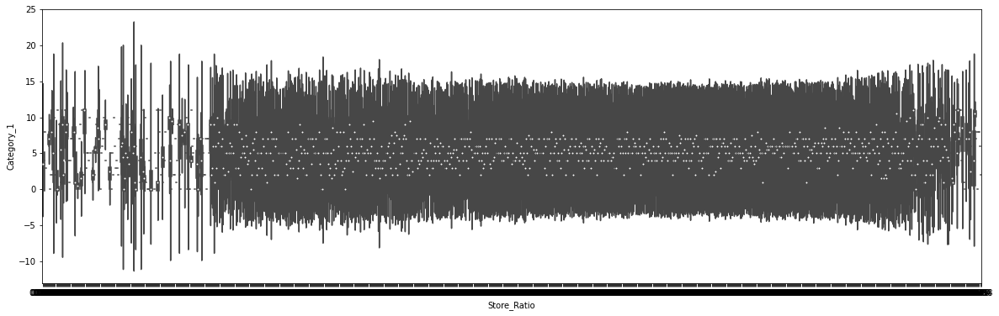

In [ ]:
# perform a violin plot between store ratio and category1
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Category_1', data=train_dataset, palette='rainbow')

there is a weak relation between store ratio and category1

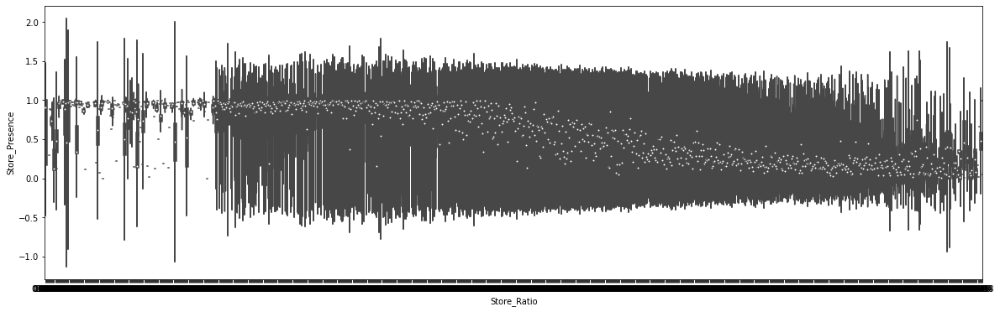

In [ ]:
# perform a violin plot between store ratio and store presence

plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Store_Presence', data=train_dataset, palette='rainbow')

store score and store ratio are correlated to each other

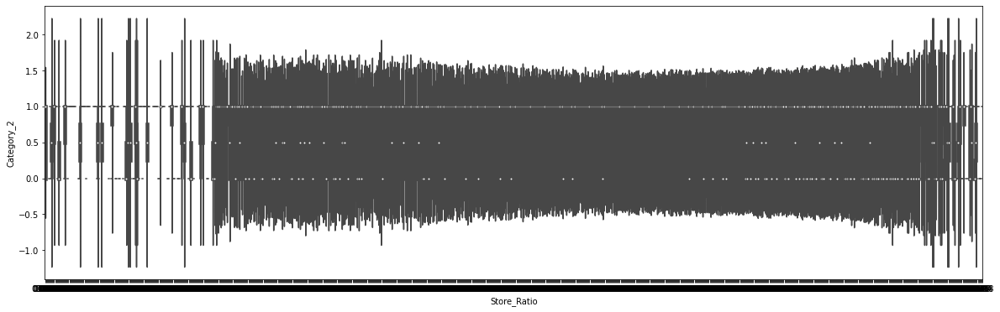

In [ ]:
# perform a violin plot between store ratio and category2

plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Category_2', data=train_dataset, palette='rainbow')

there is a week correlation between store ratio and category2

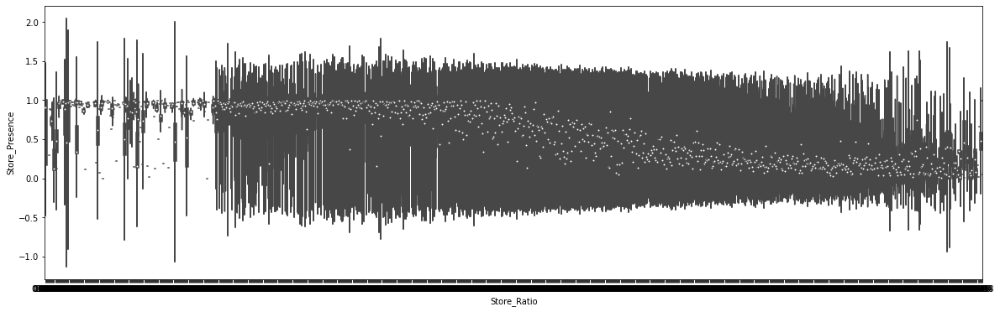

In [ ]:
# perform a violin plot between store ratio and store presence

plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Store_Presence', data=train_dataset, palette='rainbow')

there is strong negative correlation between store ratio and store presence

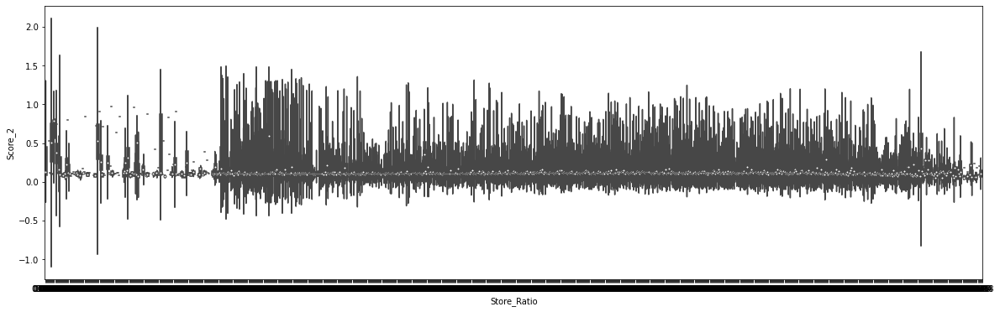

In [ ]:
# perform a violin plot between store ratio and score2

plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Score_2', data=train_dataset, palette='rainbow')

there is no relation between score2 and store ratio

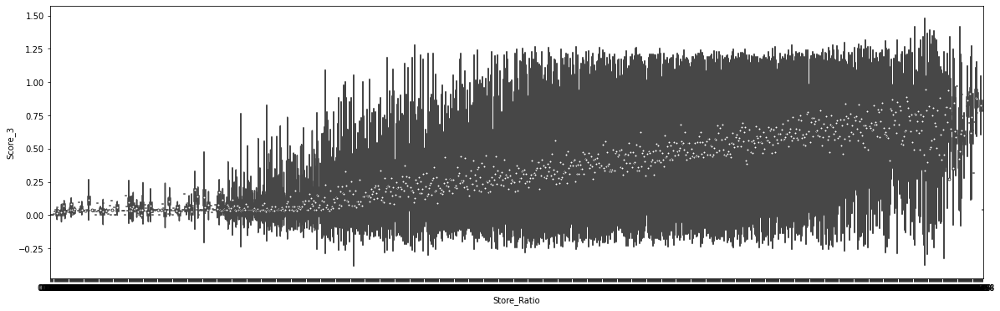

In [ ]:
# perform a violin plot between store ratio and score3
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Score_3', data=train_dataset, palette='rainbow')


there is positive correlation between store ratio and score3

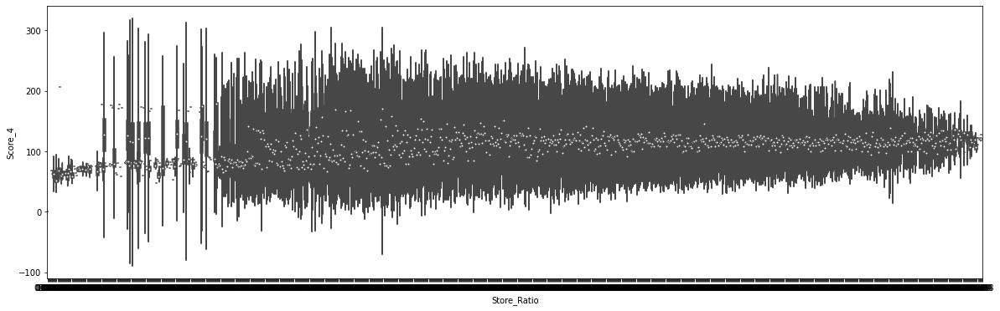

In [ ]:
# perform a violin plot between store ratio and score4
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='Score_4', data=train_dataset, palette='rainbow')

there is no relation between score4 and store ratio

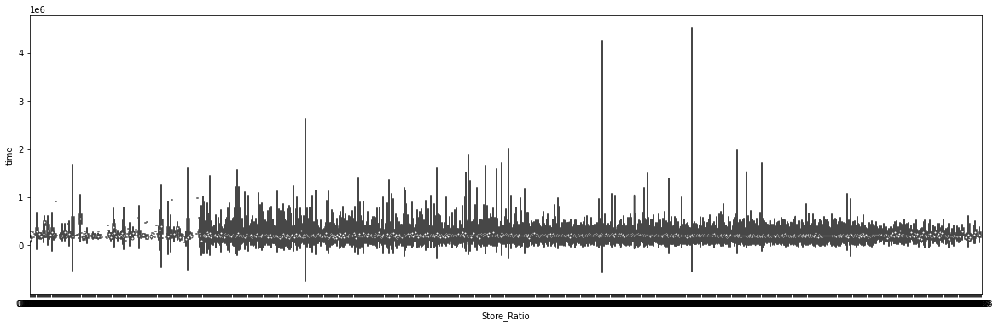

In [ ]:
# perform a violin plot between store ratio and time
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='time', data=train_dataset, palette='rainbow')

there is no relation between time and store ratio

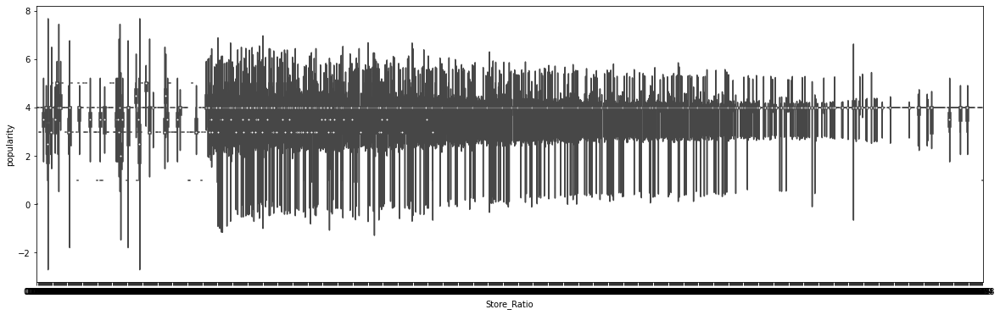

In [ ]:
# perform a violin plot between store ratio and popularuty
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Ratio', y='popularity', data=train_dataset, palette='rainbow')


there is weak relation between popularity and store ratio

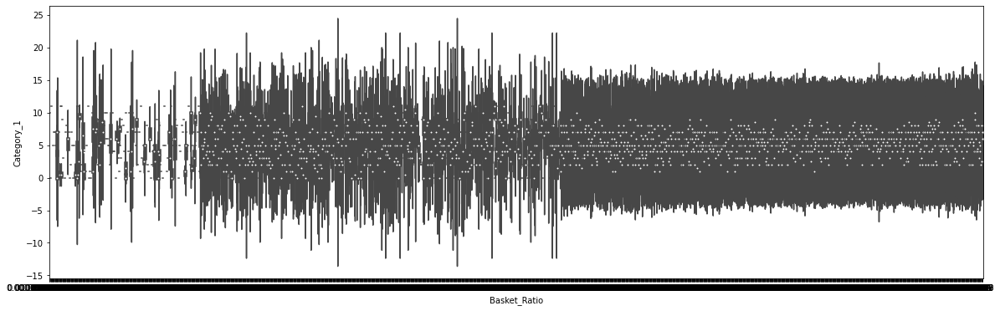

In [ ]:
# perform a violin plot between basket ratio and category1
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio', y='Category_1', data=train_dataset, palette='rainbow')

there is no relation between category1 and basket ratio

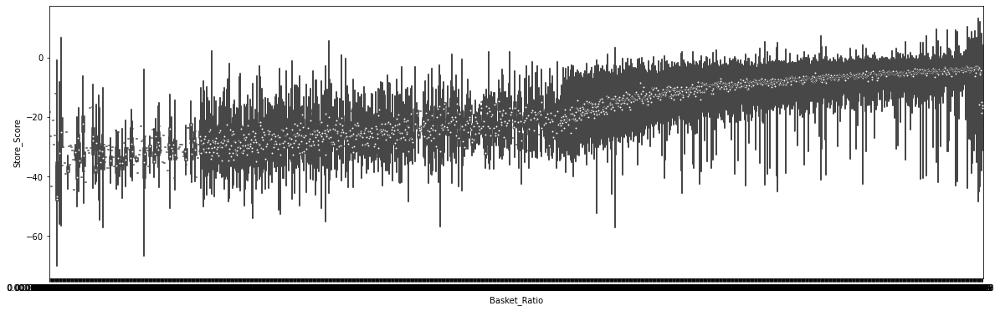

In [ ]:
# perform a violin plot between basket ratio and store score
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio', y='Store_Score', data=train_dataset, palette='rainbow')


there is positive correlation between basket ratio and store score

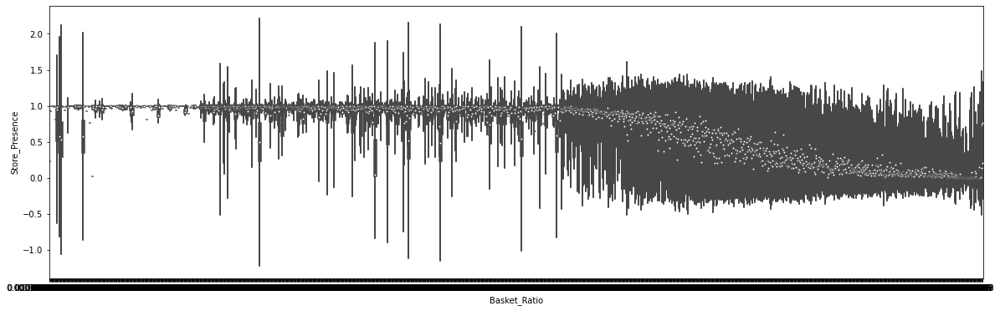

In [ ]:
# perform a violin plot between basket ratio and store presence
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio', y='Store_Presence', data=train_dataset, palette='rainbow')


there is weak relation between basket ratio and store presence

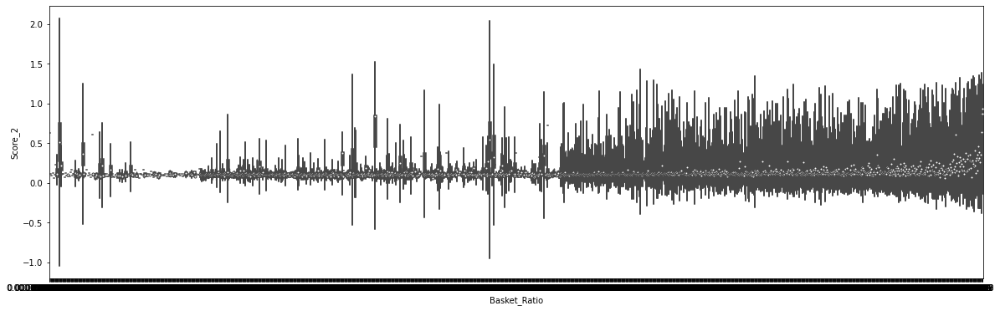

In [ ]:
# perform a violin plot between basket ratio and score2
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio', y='Score_2', data=train_dataset, palette='rainbow')

there is very weak relation between score2 and basket ratio

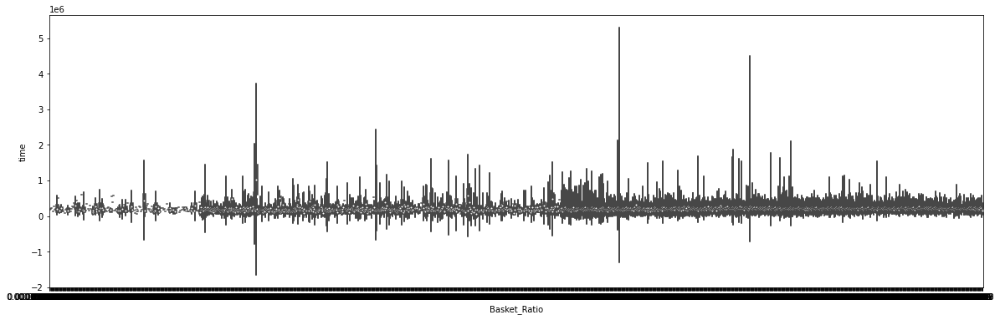

In [ ]:
# perform a violin plot between time and basket ratio
plt.figure(figsize=(20,6))
sns.violinplot(y= 'time', x= 'Basket_Ratio', data=train_dataset, palette='rainbow')


there is no relation between time and basket ratio

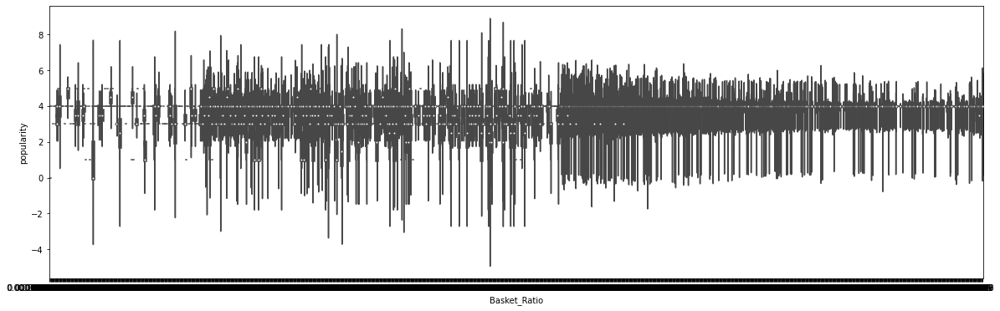

In [ ]:
# perform a violin plot between basket ratio and popularity
plt.figure(figsize=(20,6))
sns.violinplot(x='Basket_Ratio', y='popularity', data=train_dataset, palette='rainbow')


there is weak relation between basket ratio and popularity

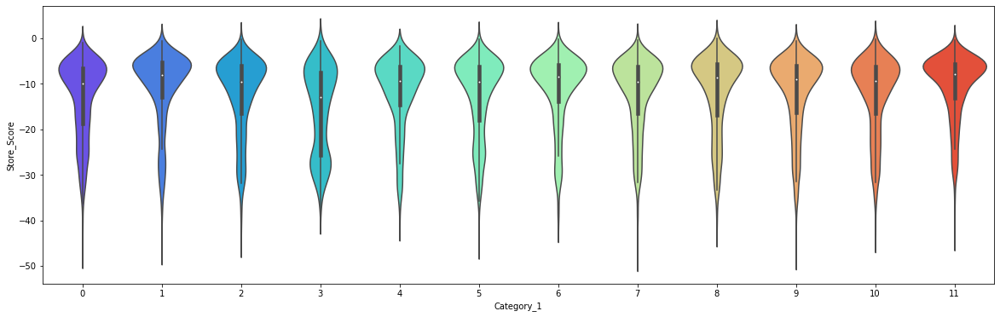

In [ ]:
# perform a violin plot between category1 and store score
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Store_Score', data=train_dataset, palette='rainbow')


there is no relation between store score and category1

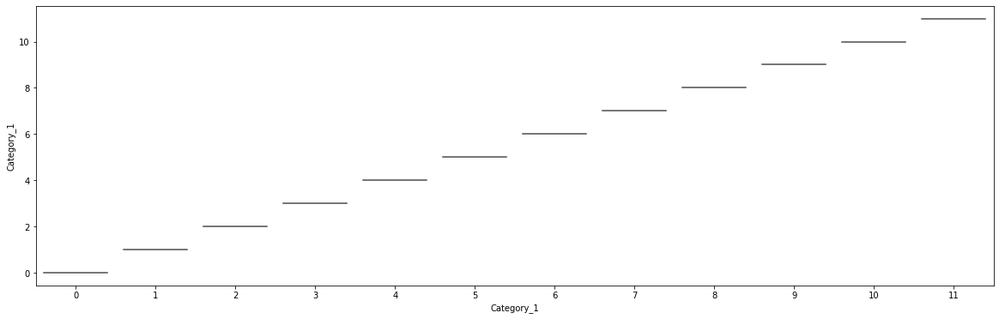

In [ ]:
# perform a violin plot between category2 and category1
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Category_1', data=train_dataset, palette='rainbow')


there is no relation between  category2 and category1

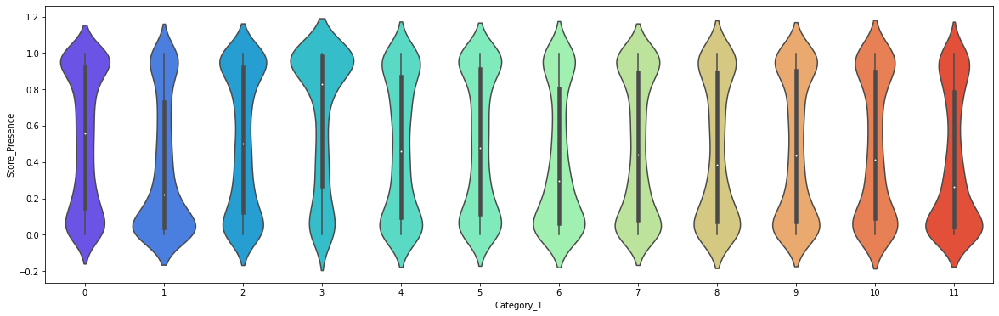

In [ ]:
# perform a violin plot between categort1 and store prsence
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Store_Presence', data=train_dataset, palette='rainbow')



there is no relation between  store presence and category1

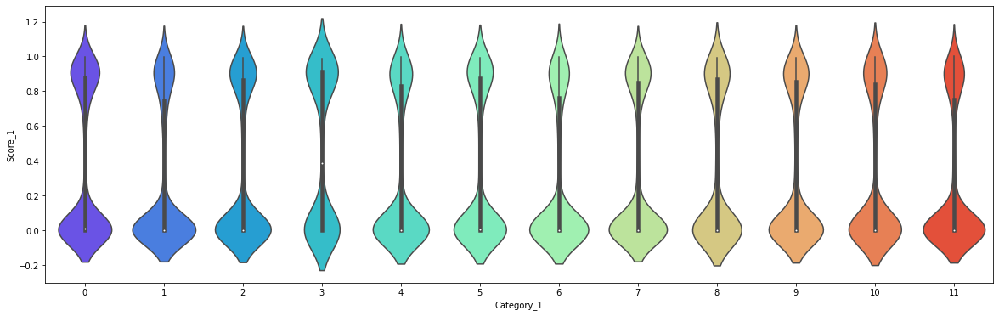

In [ ]:
# perform a violin plot between category1 and score1
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Score_1', data=train_dataset, palette='rainbow')


there is no relation between  score1 and category1

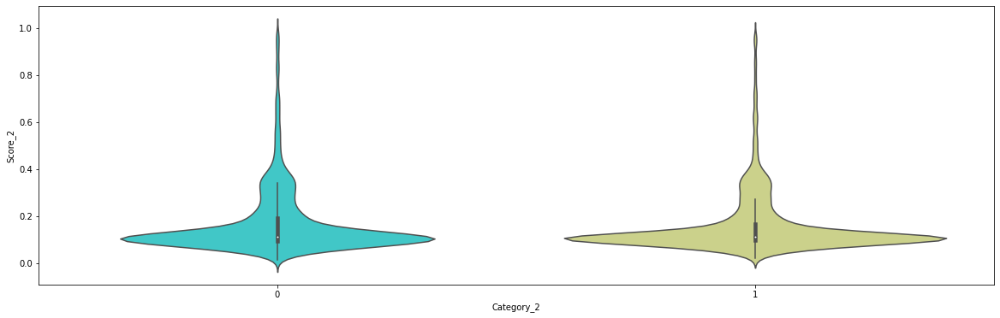

In [ ]:
# perform a violin plot between category2 and score2 
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2', y='Score_2', data=train_dataset, palette='rainbow')

there is no relation between  score2 and category1

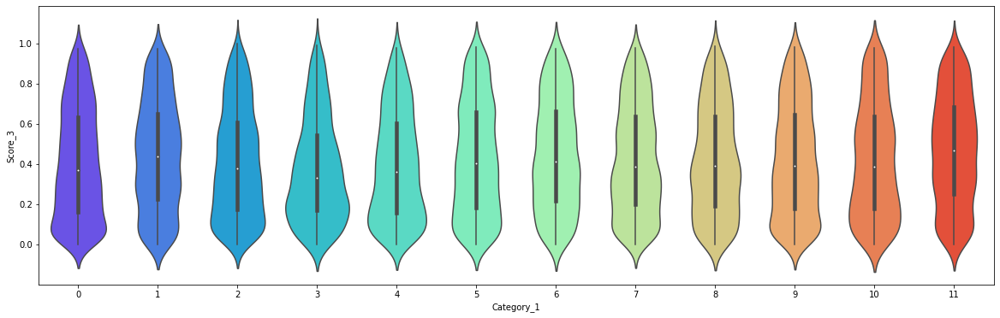

In [ ]:
# perform a violin plot between category1 and score3

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Score_3', data=train_dataset, palette='rainbow')

there is no relation between  score3 and category1

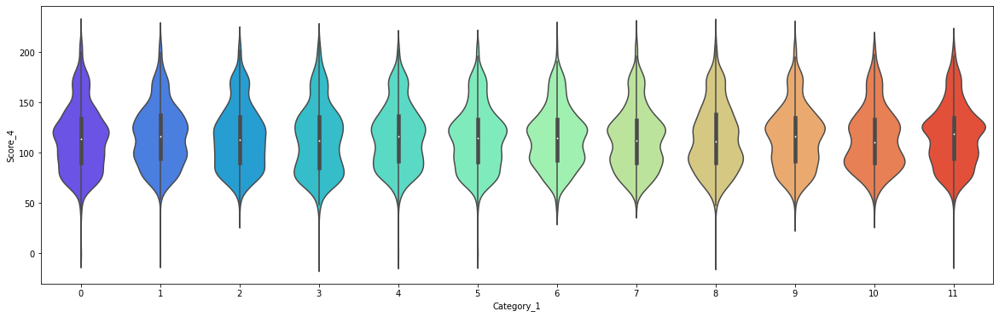

In [ ]:
# perform a violin plot between score4 and category1
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Score_4', data=train_dataset, palette='rainbow')


there is no relation between  score4 and category1

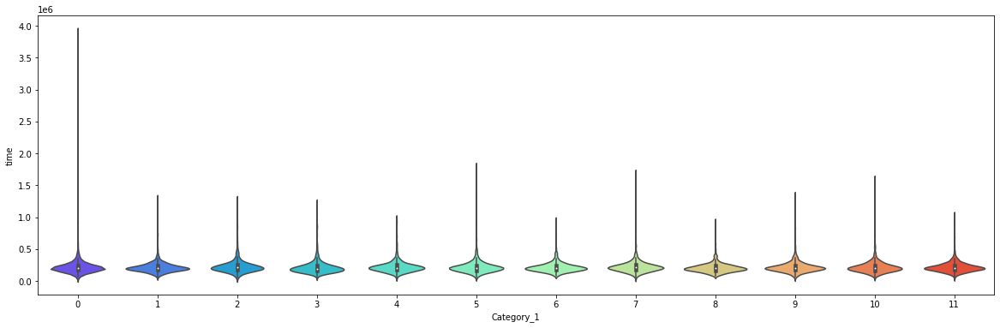

In [ ]:
# perform a violin plot between category1 and time

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='time', data=train_dataset, palette='rainbow')

there is no relation between  time and category1

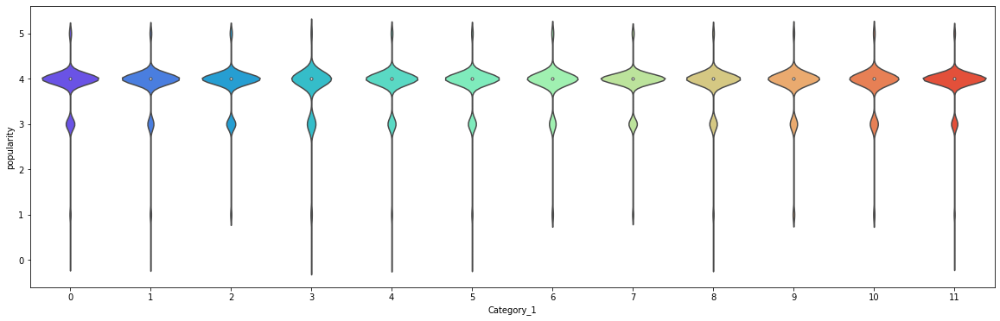

In [ ]:
# perform a violin plot between popularity and category1

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='popularity', data=train_dataset, palette='rainbow')

there is no relation between  popularity and category1

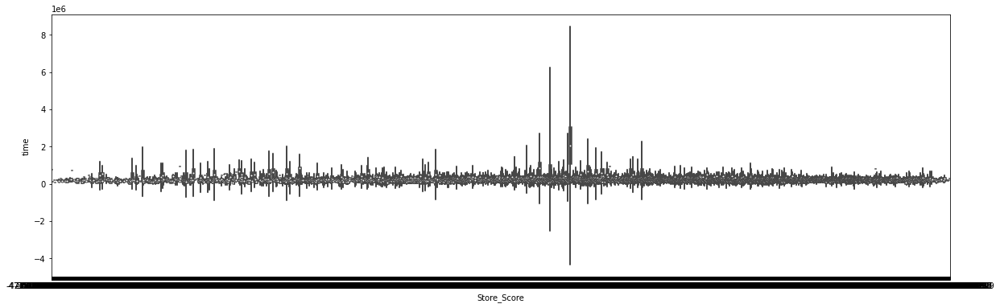

In [ ]:
# perform a violin plot between store score and time

plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score', y='time', data=train_dataset, palette='rainbow')

there is no relation between time and store score

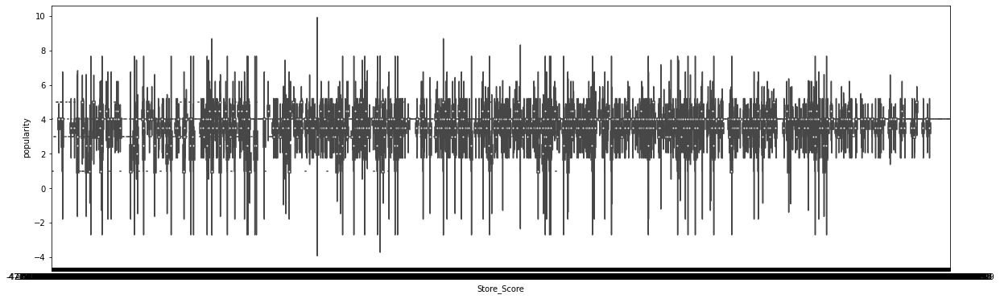

In [ ]:
# perform a violin plot between store score and popularity
plt.figure(figsize=(20,6))
sns.violinplot(x='Store_Score', y='popularity', data=train_dataset, palette='rainbow')

there is weak relation between  store score and popularity

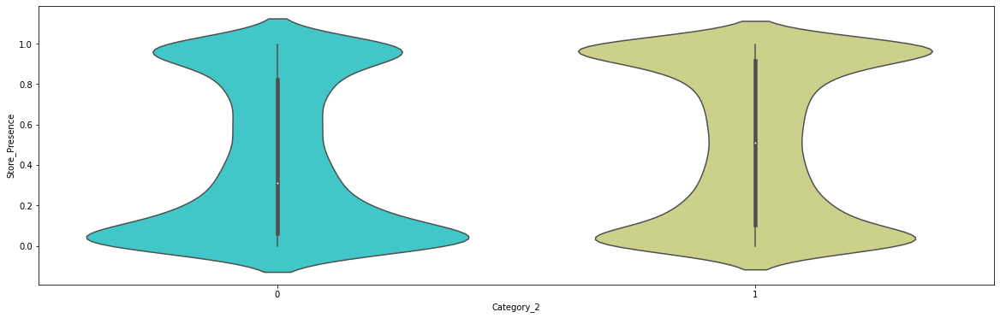

In [ ]:
# perform a violin plot between category2 and store presence 
plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2', y='Store_Presence', data=train_dataset, palette='rainbow')


there is no relation between  category2 and store presence

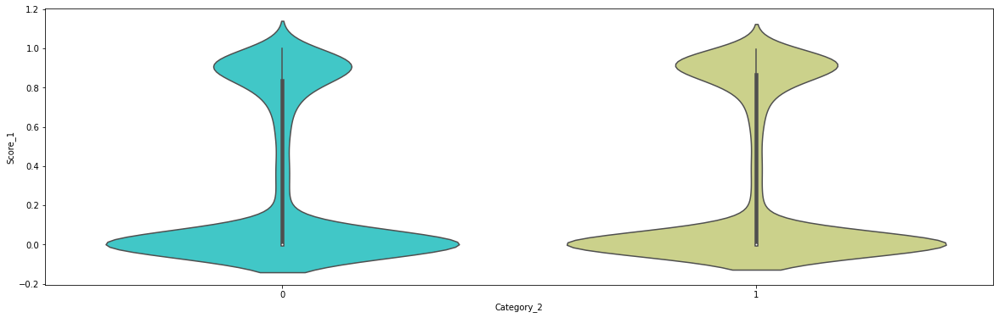

In [ ]:
# perform a violin plot between category2 and score1

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2', y='Score_1', data=train_dataset, palette='rainbow')

there is no relation between  category2 and score1

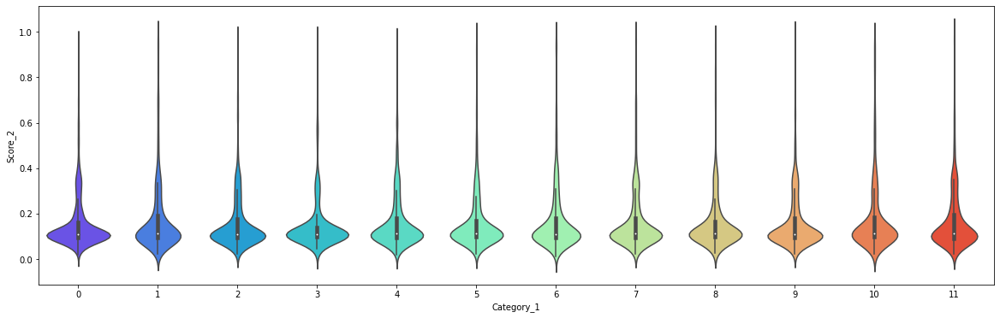

In [ ]:
# perform a violin plot between category2 and score2

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_1', y='Score_2', data=train_dataset, palette='rainbow')

there is no relation between  category2 and score2

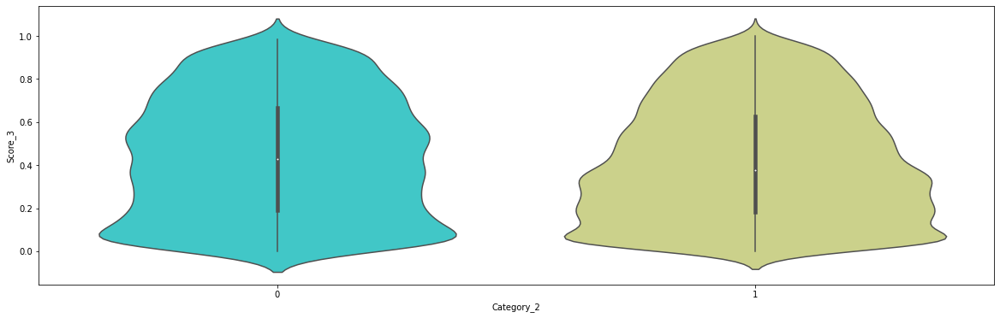

In [ ]:
# perform a violin plot between category2 and score3

plt.figure(figsize=(20,6))
sns.violinplot(x='Category_2', y='Score_3', data=train_dataset, palette='rainbow')

there is no relation between  category2 and score3

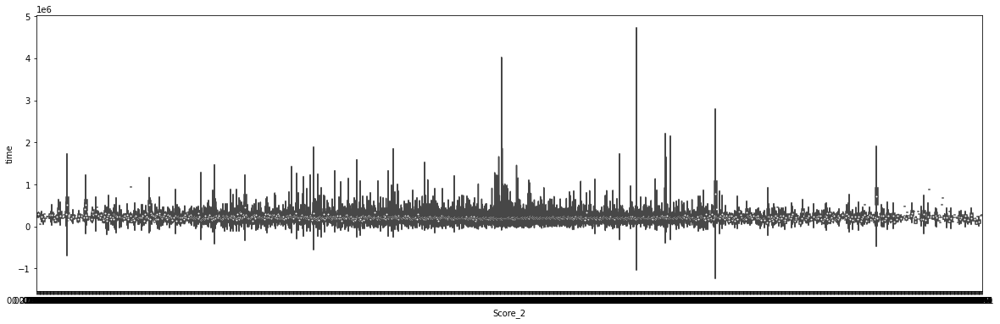

In [ ]:
# perform a violin plot between score2 and time
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2', y='time', data=train_dataset, palette='rainbow')

there is no relation between time and score

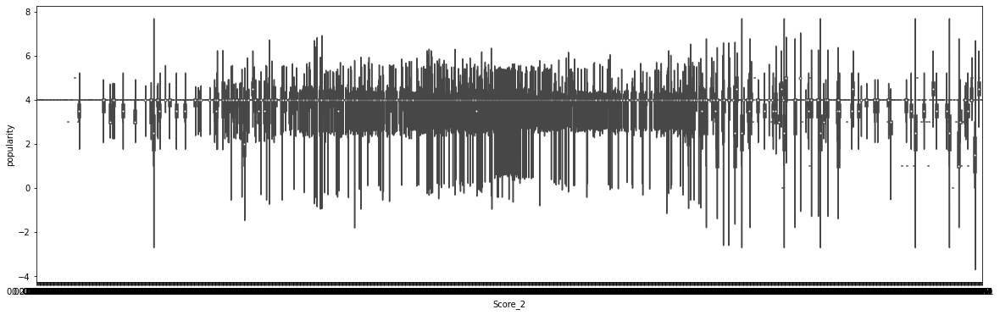

In [ ]:
# perform a violin plot between score2 and popularity
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_2', y='popularity', data=train_dataset, palette='rainbow')


there is no relation between score and popularity

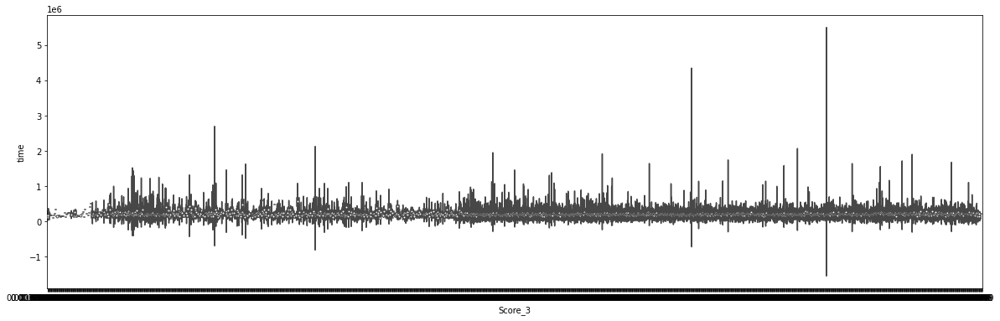

In [ ]:
# perform a violin plot between score3 and time
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_3', y='time', data=train_dataset, palette='rainbow')



there is no relation between time and score 3

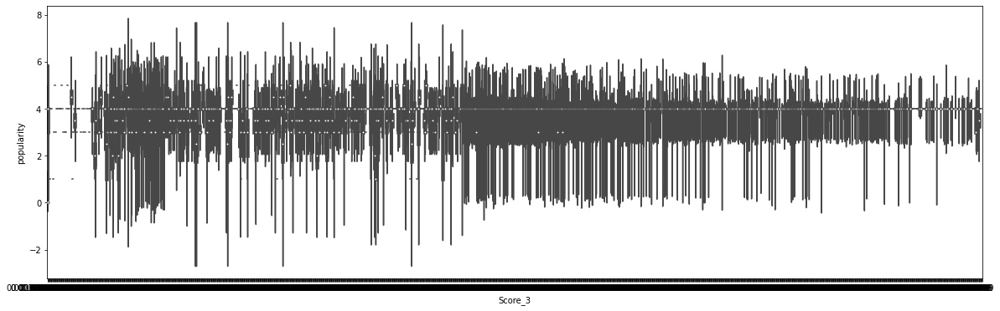

In [ ]:
# perform a violin plot between score3 and popularity
plt.figure(figsize=(20,6))
sns.violinplot(x='Score_3', y='popularity', data=train_dataset, palette='rainbow')



there is weak relation between popularity and score 3



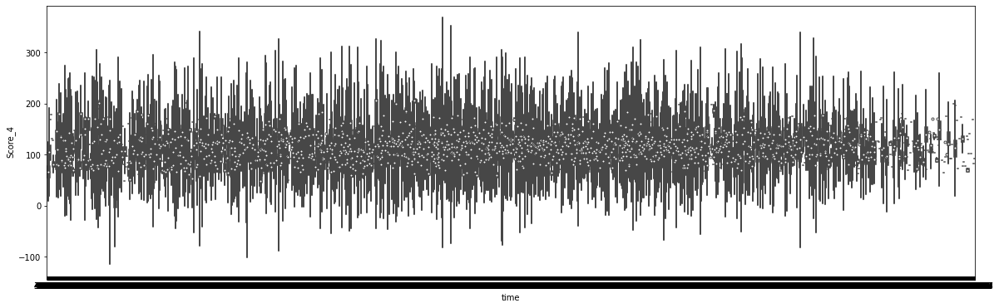

In [ ]:
# perform a violin plot between time and score4
plt.figure(figsize=(20,6))
sns.violinplot(x='time', y='Score_4', data=train_dataset, palette='rainbow')



there is no relation between time and score4

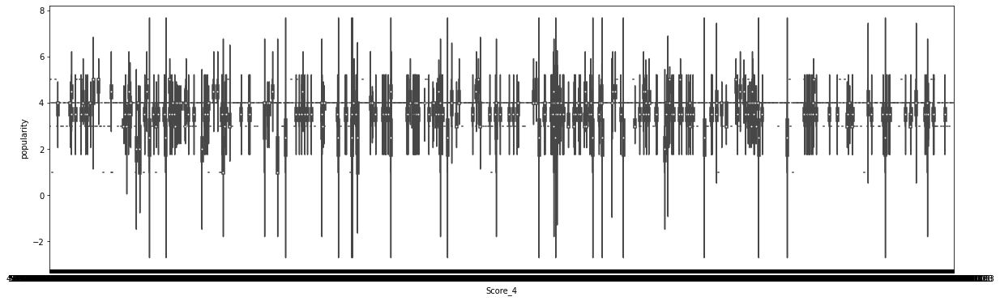

In [ ]:
# perform a violin plot between popularity and score4

plt.figure(figsize=(20,6))
sns.violinplot(x='Score_4', y='popularity', data=train_dataset, palette='rainbow')


there is no relation between popularity and score 4

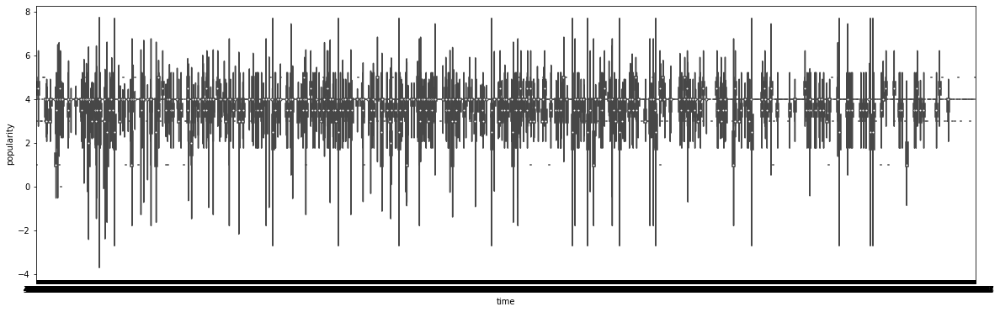

In [ ]:
# perform a violin plot between popularity and time

plt.figure(figsize=(20,6))
sns.violinplot(x='time', y='popularity', data=train_dataset, palette='rainbow')


there is on relation between time and popularity

# Preprocessing

In [ ]:
#convert the time column into more columns like hour, month, day, year , minute
train_dataset['hour'] = pd.to_datetime(train_dataset['time'].astype(int), unit='s').dt.hour
train_dataset['month'] = pd.to_datetime(train_dataset['time'].astype(int), unit='s').dt.month
train_dataset['day'] = pd.to_datetime(train_dataset['time'].astype(int), unit='s').dt.day
train_dataset['year'] = pd.to_datetime(train_dataset['time'].astype(int), unit='s').dt.year
train_dataset['minute'] = pd.to_datetime(train_dataset['time'].astype(int), unit='s').dt.minute

In [ ]:
train_df = train_dataset.copy()

In [ ]:
# drop popularity from train_df and name that variable as y
y = train_df['popularity']
#drop popularity n time from train dataset
dp = train_dataset.drop(['popularity','time'],axis=1)

In [ ]:
dp.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'hour', 'month', 'day', 'year', 'minute'],
      dtype='object')

# Scaling

##Why scaling is necessary?

1. Most of the times, your dataset will contain features highly varying in magnitudes, units and range. But since, most of the machine learning algorithms use Euclidean distance between two data points in their computations, this is a problem.
2. If left alone, these algorithms only take in the magnitude of features neglecting the units.
3. The results would vary greatly between different units, 5kg and 5000gms.
4. The features with high magnitudes will weigh in a lot more in the distance calculations than features with low magnitudes.
5. To suppress this effect, we need to bring all features to the same level of magnitudes. This can be achieved by scaling.

#min max scaling


Variables that are measured at different scales do not contribute equally to the model fitting & model learned function and might end up creating a bias. Thus, to deal with this potential problem feature-wise normalization such as MinMax Scaling is usually used prior to model fitting.

In [ ]:
# Helper function for scaling all the numerical data using MinMaxScalar
def scale_data(df,col):

  from sklearn.preprocessing import MinMaxScaler
  scaler = MinMaxScaler()
  
  df[col] = scaler.fit_transform(df[col])
  return df

In [ ]:
# Making a list of the column names to be scaled 
col = ['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'hour', 'month', 'day', 'year', 'minute']
# passing data and column name for scaling
X = scale_data(dp, col)

#Splitting the data into train and test set

In [ ]:
# Import train_test_split from sklearn
# split data into 95% train , 5% test and random state 42
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2,  random_state = 42)

In [ ]:
# check shape of X_train
X_train.shape, y_train.shape

((14566, 15), (14566,))

In [ ]:
# check for nan value in X_train
X_train.isnull().values.any()

False

# Modelling

In [ ]:
# importing necessary libraries for geting metrics of models

from sklearn.metrics import classification_report

# Function for calculating all the relevant metrics 
def print_score(m):
  y_pred = m.predict(X_test)
  res = classification_report(y_test, y_pred)
  print("Classification Report \n", res)

In [ ]:
# Helper function for Visualizing importance of all the features in the dataset for the prediction

def visualize_importance(feature_importances, feat_train_df):
    feature_importance_df = pd.DataFrame()
     # creating dataframe for feature name and feature importance
    _df = pd.DataFrame()
    _df['feature_importance'] = feature_importances
    _df['column'] = feat_train_df.columns
    feature_importance_df = pd.concat([feature_importance_df, _df], 
                                      axis=0, ignore_index=True)
    # grouping all data and sorting in descending order
    order = feature_importance_df.groupby('column')\
        .sum()[['feature_importance']]\
        .sort_values('feature_importance', ascending=False).index[:50]
    # ploting feature importance data using boxenplot
    fig, ax = plt.subplots(figsize=(8, max(6, len(order) * .25)))
    sns.boxenplot(data=feature_importance_df, 
                  x='feature_importance', 
                  y='column', 
                  order=order, 
                  ax=ax, 
                  palette='viridis', 
                  orient='h')
    ax.tick_params(axis='x', rotation=0)
    ax.set_title('Importance')
    ax.grid()
    fig.tight_layout()
    # return fig, ax
    return fig, ax






# LOGISTIC REGRESSION

1. Logistic regression is one of the most popular Machine Learning algorithms, which comes under the Supervised Learning technique.

2. Logistic Regression is much similar to the Linear Regression except that how they are used. Linear Regression is used for solving Regression problems, whereas Logistic regression is used for solving the classification problems.

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00        74
           3       0.36      0.05      0.09       444
           4       0.84      0.99      0.91      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.83      3642
   macro avg       0.24      0.21      0.20      3642
weighted avg       0.74      0.83      0.77      3642

CPU times: user 1.62 s, sys: 1.21 s, total: 2.82 s
Wall time: 1.56 s


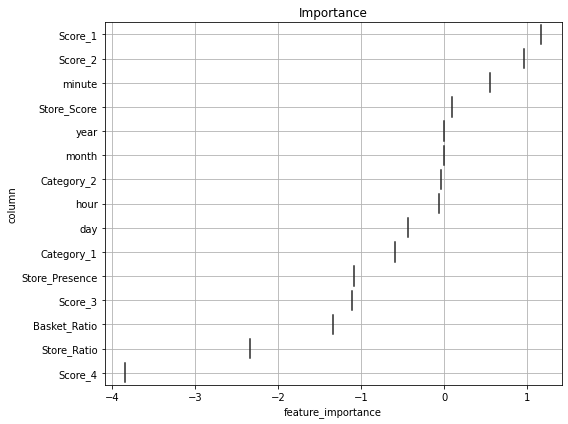

In [ ]:
%%time
# Fit a logistic Regression model to the train dataset

# Import logisticRegressor
from sklearn.linear_model import LogisticRegression

# Instantiate the model
lr = LogisticRegression()

# fitting the model on train data
lr.fit(X_train, y_train)
# print score of the model by calling function
print_score(lr)
# visualizing importance of features
importance = lr.coef_[0]
feat = pd.Series(importance)
fig, ax= visualize_importance(feat ,X)



#RANDOM FOREST CLASSIFIER

 random forest algorithm creates decision trees on data samples and then gets the prediction from each of them and finally selects the best solution by means of voting. It is an ensemble method which is better than a single decision tree because it reduces the over-fitting by averaging the result.

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      0.35      0.52        74
           3       0.88      0.33      0.48       444
           4       0.88      1.00      0.94      3030
           5       1.00      0.32      0.48        91

    accuracy                           0.88      3642
   macro avg       0.95      0.60      0.68      3642
weighted avg       0.89      0.88      0.86      3642

CPU times: user 3.35 s, sys: 34.5 ms, total: 3.39 s
Wall time: 3.57 s


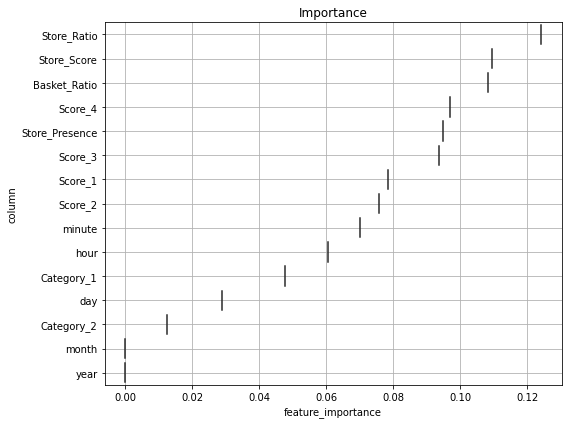

In [ ]:
%%time
# Fit a RandomForestClassifier model to the train dataset

#import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
# Instantiate the model
rfc = RandomForestClassifier()
# fitting the model on train data
rfc.fit(X_train, y_train)
# print score of the model
print_score(rfc)
# visualizing importance of features
fig, ax= visualize_importance(rfc.feature_importances_,X)


# ADA BOOST CLASSIFIER

An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.01      0.18      0.01        74
           3       0.00      0.00      0.00       444
           4       0.69      0.34      0.45      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.29      3642
   macro avg       0.34      0.30      0.29      3642
weighted avg       0.57      0.29      0.38      3642

CPU times: user 1.27 s, sys: 3.95 ms, total: 1.28 s
Wall time: 1.27 s


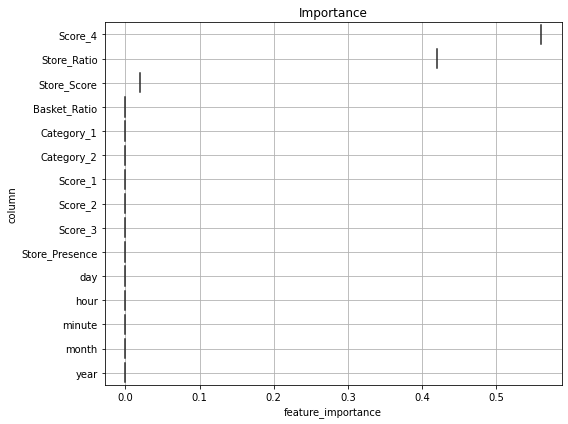

In [ ]:
%%time
# Fit a AdaBoost classifier model to the train dataset

# Import AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
# Instantiate the model
abc = AdaBoostClassifier()
# fitting the model on train data
abc.fit(X_train, y_train)
# print score of the model by calling function
print_score(abc)
# visualizing importance of features
fig, ax= visualize_importance(abc.feature_importances_,X)




#SUPORT VECTOR CLASSIFIER

1. A support vector machine (SVM) is a supervised machine learning model that uses classification algorithms for two-group classification problems. After giving an SVM model sets of labeled training data for each category, they’re able to categorize new text.



In [ ]:
%%time
# Fit a support vector classifier model to the train dataset

#import SVC
from sklearn.svm import SVC
# Instantiate the model
svc = SVC()
#fit the model on train data
svc.fit(X_train, y_train)
# print score of the model by calling function

print_score(svc)

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00        74
           3       0.00      0.00      0.00       444
           4       0.83      1.00      0.91      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.83      3642
   macro avg       0.17      0.20      0.18      3642
weighted avg       0.69      0.83      0.76      3642

CPU times: user 15.5 s, sys: 267 ms, total: 15.8 s
Wall time: 15.8 s


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# DECISION TREE CLASSICIFIER

Decision Tree Classifier is a simple and widely used classification technique. It applies a straitforward idea to solve the classification problem. Decision Tree Classifier poses a series of carefully crafted questions about the attributes of the test record. Each time time it receive an answer, a follow-up question is asked until a conclusion about the calss label of the record is reached.

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.35      0.41      0.38        74
           3       0.45      0.48      0.47       444
           4       0.91      0.89      0.90      3030
           5       0.29      0.35      0.32        91

    accuracy                           0.82      3642
   macro avg       0.60      0.63      0.61      3642
weighted avg       0.83      0.82      0.82      3642

CPU times: user 305 ms, sys: 6.78 ms, total: 311 ms
Wall time: 311 ms


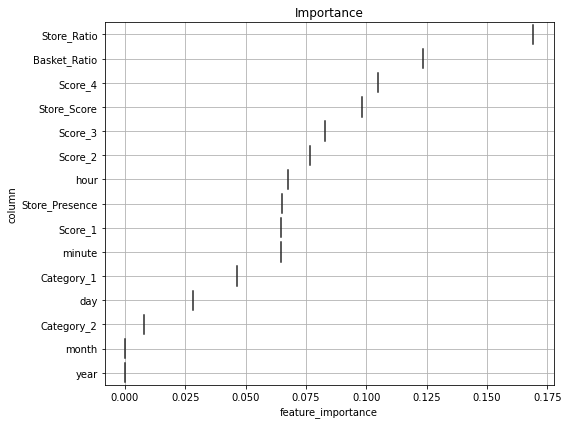

In [ ]:
%%time
# Fit a DecisionTreeClassifier model to the train dataset

#import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
# Instantiate the model
dtc = DecisionTreeClassifier()
# fitting the model on train data
dtc.fit(X_train, y_train)
# print score of the model by calling function
print_score(dtc)
# visualizing importance of features

fig, ax= visualize_importance(dtc.feature_importances_,X)

# K NEIGHBOUR CLASSIFIER

In [ ]:
%%time
# Fit a K-Neighbour classifier model to the train dataset

# Import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

# Instantiate the model
knc = KNeighborsClassifier()
# fitting the model on train data
knc.fit(X_train, y_train)
# print score of the model by calling function

print_score(knc)

Classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.22      0.09      0.13        74
           3       0.38      0.27      0.32       444
           4       0.87      0.94      0.90      3030
           5       0.37      0.11      0.17        91

    accuracy                           0.82      3642
   macro avg       0.37      0.28      0.30      3642
weighted avg       0.78      0.82      0.80      3642

CPU times: user 433 ms, sys: 6.72 ms, total: 439 ms
Wall time: 442 ms


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# GRADIENT BOOSTING CLASSIFIER

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.67      0.16      0.26        74
           3       0.54      0.11      0.18       444
           4       0.85      0.99      0.91      3030
           5       0.75      0.13      0.22        91

    accuracy                           0.84      3642
   macro avg       0.76      0.48      0.52      3642
weighted avg       0.81      0.84      0.79      3642

CPU times: user 22.9 s, sys: 32 ms, total: 22.9 s
Wall time: 22.9 s


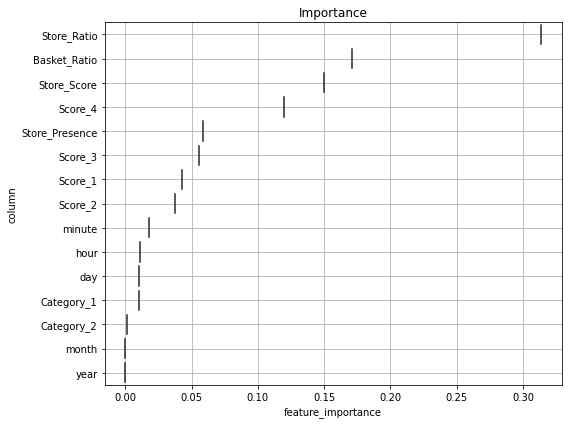

In [ ]:
%%time
# Fit a Gradient Boosting Classifier model to the train dataset

# Import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
# Instantiate the model
gbc = GradientBoostingClassifier()
# fitting the model on train data
gbc.fit(X_train, y_train)
# print score of the model
print_score(gbc)
# visualizing importance of features



fig, ax= visualize_importance(gbc.feature_importances_,X)

# BAGGING CLASSIFIER

In [ ]:
%%time
# Fit a Bagging Classifier model to the train dataset

# Import BaggingClassifier
from sklearn.ensemble import BaggingClassifier
# Instantiate the model
bc = BaggingClassifier()
# fitting the model on train data
bc.fit(X_train, y_train)
# print score of the model

print_score(bc)


Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.79      0.36      0.50        74
           3       0.59      0.40      0.47       444
           4       0.89      0.96      0.93      3030
           5       0.88      0.33      0.48        91

    accuracy                           0.87      3642
   macro avg       0.83      0.61      0.68      3642
weighted avg       0.85      0.87      0.85      3642

CPU times: user 1.44 s, sys: 4.48 ms, total: 1.44 s
Wall time: 1.44 s


# VOTING CLASSIFIER

In [ ]:
%%time
# Fit a VotingClassifier model to the train dataset

# Import VotingClassifier
from sklearn.ensemble import VotingClassifier
# list of classifier objects
g = [('RFC',rfc),('SVC',svc),('KNC',knc),('DTC',dtc)]
vc = VotingClassifier(estimators = g)
# Instantiate the model
vc.fit(X_train, y_train)
# fitting the model on train data

# print score of the model
print_score(vc)


Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.96      0.35      0.51        74
           3       0.75      0.33      0.46       444
           4       0.88      0.99      0.93      3030
           5       0.93      0.15      0.26        91

    accuracy                           0.87      3642
   macro avg       0.91      0.56      0.63      3642
weighted avg       0.87      0.87      0.85      3642

CPU times: user 19.4 s, sys: 142 ms, total: 19.5 s
Wall time: 19.4 s


# XGB CLASSIFIER

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.83      0.07      0.13        74
           3       0.53      0.06      0.11       444
           4       0.84      0.99      0.91      3030
           5       1.00      0.01      0.02        91

    accuracy                           0.84      3642
   macro avg       0.84      0.43      0.43      3642
weighted avg       0.81      0.84      0.78      3642

CPU times: user 4.57 s, sys: 31.1 ms, total: 4.6 s
Wall time: 4.79 s


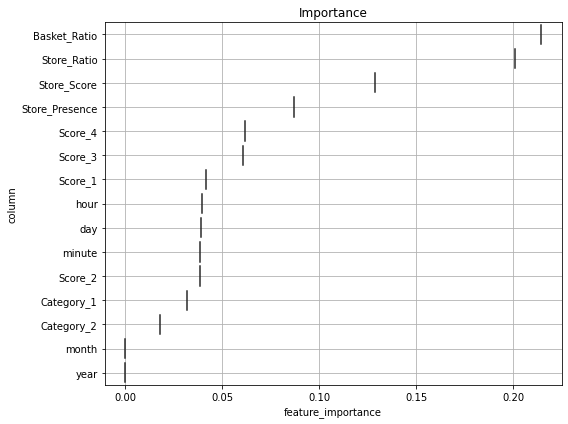

In [ ]:
%%time
# Fit a XGBClassifier model to the train dataset
from xgboost import XGBClassifier
# Import XGBClassifier
xgbc = XGBClassifier()
# Instantiate the model

# fitting the model on train data
xgbc.fit(X_train, y_train)
# print score of the model
print_score(xgbc)
# visualizing importance of features

fig, ax= visualize_importance(xgbc.feature_importances_,X)

#Comparing all the model based on metric

In [ ]:
from numpy.ma.core import default_fill_value
# helper function for comparing models matric
def compare_models(models,names,X_test,y_test):
  # the libraries we need
  import sklearn.metrics as metrics
  from sklearn.model_selection import train_test_split


  # now, create a list with the objects 
  data_ = pd.DataFrame()
  
  # create a dataframe with column matric and metric name as value
  for (model,name) in zip(models,names):
    print(name)
    y_pred = model.predict(X_test)
    res = classification_report(y_test, y_pred)
    print('classification Report \n',res)
    print("----------------------------------------------------------------------------")
    

In [ ]:
%%time
# list of model objects
models = [lr, rfc, abc, svc, dtc, knc, gbc, bc, vc, xgbc]
# list of models name
names =['Logistic','RandomForest classifier', 'Ada Boost Classifier', 'Support Vector Classifier', 'Decision Tree Classifier', 'KNeighbor', 'Gradient Boost', 'Bagging', 'Voting', 'XGB Classifier']
# use function for comparing models by passing list of models object, names, train and test data
compare_models(models,names, X_test, y_test)

Logistic
classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00        74
           3       0.36      0.05      0.09       444
           4       0.84      0.99      0.91      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.83      3642
   macro avg       0.24      0.21      0.20      3642
weighted avg       0.74      0.83      0.77      3642

----------------------------------------------------------------------------
RandomForest classifier
classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      0.35      0.52        74
           3       0.88      0.33      0.48       444
           4       0.88      1.00      0.94      3030
           5       1.00      0.32      0.48        91

    accuracy               

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.01      0.18      0.01        74
           3       0.00      0.00      0.00       444
           4       0.69      0.34      0.45      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.29      3642
   macro avg       0.34      0.30      0.29      3642
weighted avg       0.57      0.29      0.38      3642

----------------------------------------------------------------------------
Support Vector Classifier


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.00      0.00      0.00        74
           3       0.00      0.00      0.00       444
           4       0.83      1.00      0.91      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.83      3642
   macro avg       0.17      0.20      0.18      3642
weighted avg       0.69      0.83      0.76      3642

----------------------------------------------------------------------------
Decision Tree Classifier
classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.35      0.41      0.38        74
           3       0.45      0.48      0.47       444
           4       0.91      0.89      0.90      3030
           5       0.29      0.35      0.32        91

    accuracy                       

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


classification Report 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           1       0.22      0.09      0.13        74
           3       0.38      0.27      0.32       444
           4       0.87      0.94      0.90      3030
           5       0.37      0.11      0.17        91

    accuracy                           0.82      3642
   macro avg       0.37      0.28      0.30      3642
weighted avg       0.78      0.82      0.80      3642

----------------------------------------------------------------------------
Gradient Boost
classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.67      0.16      0.26        74
           3       0.54      0.11      0.18       444
           4       0.85      0.99      0.91      3030
           5       0.75      0.13      0.22        91

    accuracy                           0.84  

# Hyperparameter tuning

A hyperparameter is a parameter whose value is set before the learning process begins.

Hyperparameters tuning is crucial as they control the overall behavior of a machine learning model.

Every machine learning models will have different hyperparameters that can be set.



# grid search

One traditional and popular way to perform hyperparameter tuning is by using an Exhaustive Grid Search from Scikit learn.

This method tries every possible combination of each set of hyper-parameters.

Using this method, we can find the best set of values in the parameter search space.

This usually uses more computational power and takes a long time to run since this method needs to try every combination in the grid size.

In [ ]:
 # Helper function to perform hyper parameter tunning with GridSearchCV

def gird_Search(model,grid):
  from sklearn.model_selection import GridSearchCV, train_test_split
  from sklearn.model_selection import KFold
  from sklearn.model_selection import GridSearchCV

  cv = KFold(n_splits=5, shuffle=False,random_state=None)
  # search across 100 different combinations, and use all available cores
  clf = GridSearchCV(model,grid, cv = cv, n_jobs = -1,scoring='f1_macro',error_score='raise')# Fit the random search model
  clf.fit(X_train, y_train)
  print(clf.score(X_train,y_train))
  print(clf.best_params_)
  


In [ ]:
%%time
# create logistic regressor parameters dict in list for tunning
log_para_grid = {
    'C': 10.0 **np.arange(-2,3),
    'solver' : [ 'newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'penalty': ['l2']
    }


# passing data for hyper parameter tunning with Gridsearchcv    
gird_Search(lr,log_para_grid)

0.40375766657207857
{'C': 100.0, 'penalty': 'l2', 'solver': 'liblinear'}
CPU times: user 1.25 s, sys: 118 ms, total: 1.37 s
Wall time: 57.6 s


# NOTE : you can use any one of RandomizedSearchCv or GridSearchCV, both works fine.

# RamdomizedSearchCV

In [ ]:
# Helper function to perform hyper parameter tunning with RandomizedSearchCV
def random_Search(model,X_train, Y_train,param_grid):
  from sklearn.model_selection import RandomizedSearchCV

  #  
  # search across 100 different combinations, and use all available cores
  random = RandomizedSearchCV(estimator = model, param_distributions = param_grid, n_iter = 10, cv = 3,verbose=2, random_state=42, n_jobs = -1)# Fit the random search model
  random.fit(X_train, y_train)
  print("\n Best parameters: ",random.best_params_)
  print('\n best score :', random.best_score_)


  

In [ ]:
%%time
# create RandomForest classifier parameters dict for tunning
rf_para_grid ={'n_estimators':list(range(150,301,50)),
               'max_features':['auto','sqrt'],
               'max_depth': [int(x) for x in np.linspace(3,10,num=3)],
               'min_samples_split': [2,5],
               'min_samples_leaf':[1,2],
               'bootstrap':[True,False]}
# passing data for hyper parameter tunning with Randomized search cv
random_Search(RandomForestClassifier(),X_train,y_train, param_grid = rf_para_grid)

Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': False}

 best score : 0.8473156039138305
CPU times: user 6.66 s, sys: 101 ms, total: 6.76 s
Wall time: 59.2 s


In [ ]:
%%time
# create KNN classifier parameters dict for tunning
knn_para_grid={'leaf_size': list(range(3,15,2)),
               'n_neighbors':list(range(10,30)),
               }

# passing data for hyper parameter tunning with RandomSearchCV
random_Search(KNeighborsClassifier(),X_train,y_train, param_grid = knn_para_grid)


Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'n_neighbors': 25, 'leaf_size': 7}

 best score : 0.8371548661880984
CPU times: user 414 ms, sys: 37.6 ms, total: 452 ms
Wall time: 23.9 s


In [ ]:
%%time
# create GradientBoost classifier parameters dict for tunning
GBR_para_grid = {'n_estimators' : [x for x in range(200,351,50)],
                 'learning_rate':[0.01,0.1,0.2],
                 'max_depth':[x for x in range(5,7)],
                 'min_samples_split':[x for x in range(2,6)]
                 }
# passing data for hyper parameter tunning with RandomSearchCV
random_Search(GradientBoostingClassifier(),X_train, y_train, param_grid = GBR_para_grid)

Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'n_estimators': 350, 'min_samples_split': 5, 'max_depth': 5, 'learning_rate': 0.2}

 best score : 0.8587805842242157
CPU times: user 1min 54s, sys: 1.25 s, total: 1min 55s
Wall time: 23min 38s


In [ ]:
%%time
# create DecisionTree classifier parameters dict for tunning
DTR_para_grid= {
    'splitter':['best','random'],
    'max_depth':[3,5,7,9],
    'min_samples_leaf':[1,2,3,4],
    'max_features':['auto','log2','sqrt']}
# passing data for hyper parameter tunning with Randomized search cv
random_Search(DecisionTreeClassifier(),X_train,y_train,param_grid = DTR_para_grid)

Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'splitter': 'best', 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 3}

 best score : 0.8378415708483983
CPU times: user 118 ms, sys: 13 ms, total: 131 ms
Wall time: 507 ms


In [ ]:
%%time
# create AdaBoost classifier parameters dict for tunning
Ada_para_grid= {
    'n_estimators':[100,200,300],
    'learning_rate':[0.0001,0.01,0.1,1.0],

}
# passing data for hyper parameter tunning with RandomSearchCV
random_Search(AdaBoostClassifier(),X_train,y_train,param_grid = Ada_para_grid)

Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'n_estimators': 300, 'learning_rate': 0.01}

 best score : 0.838528077566281
CPU times: user 10.3 s, sys: 163 ms, total: 10.5 s
Wall time: 2min 6s


In [ ]:
%%time
# create XGBoost parameters dict in list for tunning
XGB_para_grid = {'learning_rate':[0.05,0.10],
                 'max_depth':[3,4,5],
                 'min_child_weight':[3,5,7],
                 'gamma':[0.0,0.1],
                 'colsample_bytree':[0.3,0.4]}
# passing data for hyper parameter tunning with RandomSearchCV
random_Search(XGBClassifier(),X_train,y_train,param_grid = Ada_para_grid)

Fitting 3 folds for each of 10 candidates, totalling 30 fits

 Best parameters:  {'n_estimators': 300, 'learning_rate': 1.0}

 best score : 0.8519839909828746
CPU times: user 14.2 s, sys: 158 ms, total: 14.3 s
Wall time: 3min 1s


#Gradient boosting classifier

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.70      0.38      0.49        74
           3       0.65      0.38      0.48       444
           4       0.89      0.97      0.93      3030
           5       0.66      0.32      0.43        91

    accuracy                           0.87      3642
   macro avg       0.78      0.61      0.66      3642
weighted avg       0.85      0.87      0.85      3642

CPU times: user 1min 47s, sys: 171 ms, total: 1min 47s
Wall time: 1min 48s


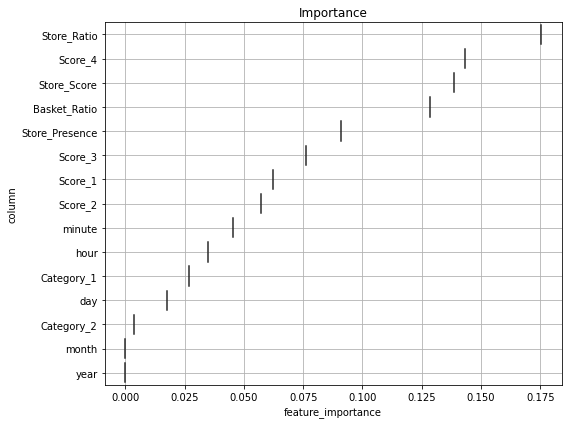

In [ ]:
%%time
# Fit a Gradient Boosting Classifier model to the train dataset

# Import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
# Instantiate the model
gbc = GradientBoostingClassifier(n_estimators= 350, min_samples_split= 5, max_depth= 5, learning_rate= 0.2)
# fitting the model on train data
gbc.fit(X_train, y_train)
# print score of the model
print_score(gbc)
# visualizing importance of features



fig, ax= visualize_importance(gbc.feature_importances_,X)

#Random Forest Classifier

Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      0.05      0.10        74
           3       0.93      0.09      0.16       444
           4       0.84      1.00      0.92      3030
           5       1.00      0.10      0.18        91

    accuracy                           0.85      3642
   macro avg       0.95      0.45      0.47      3642
weighted avg       0.86      0.85      0.79      3642

CPU times: user 6.52 s, sys: 19.8 ms, total: 6.54 s
Wall time: 6.51 s


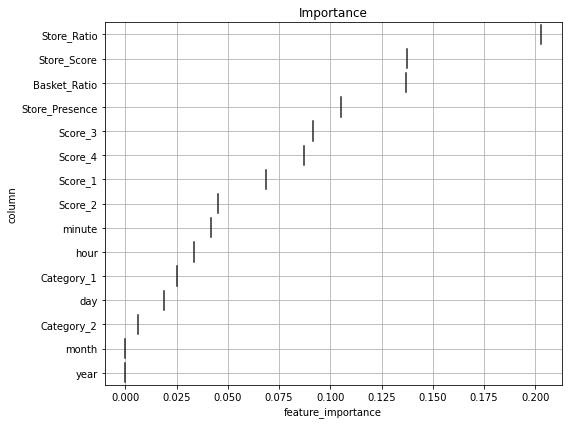

In [ ]:
%%time
# Fit a RandomForestClassifier model to the train dataset

#import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
# Instantiate the model
rfc = RandomForestClassifier(n_estimators= 200, min_samples_split = 2, min_samples_leaf = 1, max_features = 'sqrt', max_depth = 10, bootstrap = False)
# fitting the model on train data
rfc.fit(X_train, y_train)
# print score of the model
print_score(rfc)
# visualizing importance of features
fig, ax= visualize_importance(rfc.feature_importances_,X)

#Ada Boost Classifier

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.00      0.00      0.00        74
           3       0.00      0.00      0.00       444
           4       0.83      1.00      0.91      3030
           5       0.00      0.00      0.00        91

    accuracy                           0.83      3642
   macro avg       0.37      0.40      0.38      3642
weighted avg       0.69      0.83      0.76      3642

CPU times: user 7.51 s, sys: 50.3 ms, total: 7.56 s
Wall time: 7.57 s


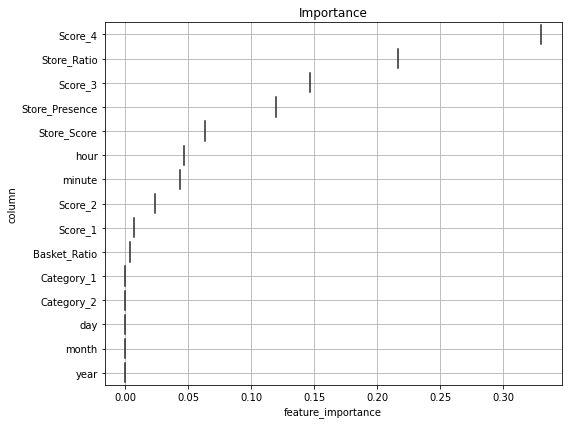

In [ ]:
%%time
# Fit a AdaBoost classifier model to the train dataset

# Import AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
# Instantiate the model
abc = AdaBoostClassifier(n_estimators= 300, learning_rate= 0.01)
# fitting the model on train data
abc.fit(X_train, y_train)
# print score of the model by calling function
print_score(abc)
# visualizing importance of features
fig, ax= visualize_importance(abc.feature_importances_,X)


### Now working with the test dataset provided

In [ ]:
# preparing test data as similarly as done for train data before.
test_x = test_dataset

In [ ]:

test_x['hour'] = pd.to_datetime(test_x['time'].astype(int), unit='s').dt.hour
test_x['month'] = pd.to_datetime(test_x['time'].astype(int), unit='s').dt.month
test_x['day'] = pd.to_datetime(test_x['time'].astype(int), unit='s').dt.day
test_x['year'] = pd.to_datetime(test_x['time'].astype(int), unit='s').dt.year
test_x['minute'] = pd.to_datetime(test_x['time'].astype(int), unit='s').dt.minute

In [ ]:
# check columns of test data
test_x.columns

Index(['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'time', 'hour', 'month', 'day', 'year', 'minute'],
      dtype='object')

In [ ]:
col_X_test = test_x[['Store_Ratio', 'Basket_Ratio', 'Category_1', 'Store_Score',
       'Category_2', 'Store_Presence', 'Score_1', 'Score_2', 'Score_3',
       'Score_4', 'hour', 'month', 'day', 'year', 'minute']]

In [ ]:
# passing test data for scaling

def scale_data(df):

  from sklearn.preprocessing import MinMaxScaler
  scaler = MinMaxScaler()
  
  df[col] = scaler.fit_transform(df)
  return df

In [ ]:
test_x = scale_data(col_X_test)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


In [ ]:
# Perforn the prediction on the test dataset
y_predicted = vc.predict(test_x)
y_predicted

array([4, 4, 4, ..., 4, 4, 4])

In [ ]:
# creating a dataframe of predicted results 
predictions = pd.DataFrame(y_predicted)

In [ ]:
# predicted values in dataframe
predictions.head()

,0
0,4
1,4
2,4
3,4
4,4


### CONCLUSION

We have performed EDA, preprocessing, build different models, visualized feature importance, did hyper parameter tunning of each model and did prediction. store ratio is most important data in the dataset. we used voting classifier for prediction